# Project: Term Deposit Subscription

## Project Overview:

The goal of this project is to build a model for predicting if a customer will buy an investment product or not. To solve this problem the data consists of multiple feature providing information about different customers. The metrics used are

i. age : age of customer (numeric)

ii. job : type of job (categorical)

iii. marital : marital status (categorical)

iv. education (categorical)

v. default: has credit in default? (binary)

vi. balance: average yearly balance, in euros (numeric)

vii. housing: has a housing loan? (binary)

viii. loan: has personal loan? (binary)

ix. contact: contact communication type (categorical)

x. day: last contact day of the month (numeric)

xi. month: last contact month of year (categorical)

xii. duration: last contact duration, in seconds (numeric)

xiii. campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

The data set consists of multiple binary, categorical and numeric features. The goal of the project will be to learn from all the features provided and predict if the customer will subscribe to product or not. The response/result variable y has two responses yes or no.

## Data Setup :

In [37]:
# Import the libraries required 
import os
import random 
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegressionCV
from sklearn.svm import SVC
from pycaret.classification import *
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score 
from sklearn.metrics import f1_score, make_scorer, ConfusionMatrixDisplay, roc_auc_score
from sklearn.ensemble import  StackingClassifier
from scipy.stats import uniform as sp_randFloat, randint as sp_randInt
from xgboost import XGBClassifier
from numpy import loadtxt
from dython.nominal import associations
import joblib
import lightgbm
from kmodes.kprototypes import KPrototypes
from plotnine import *
import plotnine
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.io as pio
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

In [398]:
# Set the file path
data_file_path=os.path.join(os.path.abspath('') , "Data","term-deposit-marketing-2020.csv")
# Set the random seed
random_seed=1212
# Set the random seed for python environment 
os.environ['PYTHONHASHSEED']=str(random_seed)
# Set numpy random seed
np.random.seed(random_seed)
# Set the random seed value
random.seed(random_seed)
# Setup List for storing the classfier, accuracy, f1 score and datatset type
eval_report=list()


**Step 0: Define some generic functions which will be used in the script**

In [382]:
# Function returning outlier percentage and column name
def calculate_outlier_stats( dataframename, col_name ):
    
    ''' Calculating the outlier statistics:
    Input: 
    This function takes two arguments dataframename & col_name 
    where,
    i. dataframename: name of dataframe containing the numerical
                        data column.
    ii. col_name: name of the colum containing numerical data.
    Output:
    This function returns two values percent_value & index
    where,
    i. percent_value: % of records attributing to outliers.
    ii. index: boolean list indicating if the element at a 
                particular index is outlier or not.
    '''
    
    # Store the summary statitics
    summary_stat = dataframename[col_name].describe()
    
    # Calculate IQR range
    iqr_range = summary_stat['75%'] - summary_stat['25%']

    # Calculate the minimum limit
    min_limit  = summary_stat['25%'] - 1.5 * iqr_range
    
    # Calculate the maximum limit
    max_limit  = summary_stat['75%'] + 1.5 * iqr_range

    # Set the index values
    index = (dataframename[col_name] < min_limit) | (dataframename[col_name] > max_limit)
    
    # Calculate percentage  value
    percent_value = (sum(index)/len(index)) * 100
    
    # outlier percentage
    print("outlier percentage {:.3f} %".format(percent_value))
    
    # Return values
    return percent_value, index

# Define function for model metric reporting reporting
def model_performance_report(mdl_classifier_obj, classifier_name, 
                             features_test, labels_test, 
                             reporting=True
                            ):
    
    ''' Calculating Performance report of model:
    Input: 
    This function takes 5 input arguments  
    
    i.   mdl_classifier_obj: classifier trained object 
    ii.  classifier_name: name of the Classifier
    iii. features_test: Test dataset features
    iv.  labels_test: Test dataset labels
    v.   reporting: default=True, set to false if you
                    want to disable classification report 
                    and confusion matrix.
    Output:
    This function returns 3 values 

    i.   mdl_accuracy: % accuracy of the model.
    ii.  mdl_roc_score: precision recall auc score of the model.
    iii. predicted_labels : The predicted value of labels 
                            predicted by classifier.
    '''
 
    print("-------------------------------------------------------------\n")
    print("Performance metrics for ", classifier_name, ":\n")
    print("-------------------------------------------------------------\n")
    # Generate the classification report
    print("Model Accuracy :")
    
    # Calculate accuracy 
    mdl_accuracy = mdl_classifier_obj.score(features_test, labels_test)
    
    # Print the accuracy of the model 
    print("model score: %.3f" %mdl_accuracy)
    
    print("-------------------------------------------------------------\n")
    # Predicted labels for test
    predicted_labels = mdl_classifier_obj.predict(features_test)
    
    '''# Generate the classification report
    print("Model F1-Score :")
    
    # Calculate F1-Score 
    mdl_f1_score = f1_score(labels_test,predicted_labels, average='macro')
    
    # Print the F1-Score  of the model 
    print("F1 score macro avg: %.3f" %mdl_f1_score )
    
     # Calculate F1-Score 
    mdl_f1_score = f1_score(labels_test,predicted_labels, average='weighted')
    
    # Print the F1-Score  of the model 
    print("F1 score weighted avg: %.3f" %mdl_f1_score )
    '''
    # Calculate AUC score
    mdl_roc_score = roc_auc_score(labels_test,predicted_labels)
    
    # Print the accuracy of the model 
    print("ROC AUC score: %.3f" %mdl_roc_score )
    
    if (reporting):
        
        print("-------------------------------------------------------------\n")
        
        # Generate the classification report
        print("Classification Report :")
    
        # Print the classification report
        print(classification_report(labels_test,predicted_labels))
        print("-------------------------------------------------------------\n")
    
        # Generate the classification report
        print("Confusion Matrix  :")
    
        # Develop the confusion matrix
        confusion_matrix_mdl = confusion_matrix(labels_test,predicted_labels)
    
        # Display the confusion matrix
        confusion_matrix_display_mdl = ConfusionMatrixDisplay(confusion_matrix_mdl).plot()
    
    return [mdl_accuracy, mdl_roc_score, predicted_labels]
    
# Function for performing parameter optimization 
def return_optimized_hyper_parameter(mdl_classifier, preprocessor, grid_params, features_train_ovr, 
                                     labels_train_ovr, cv=5, n_iter=10, scoring='roc_auc', verbose=5):
    
    ''' Optimize hyper parameters of the model :
     Input: 
    This function takes 9 input arguments, 5 mandatory 
    and 4 optional.
    
    i.   mdl_classifier: classifier object for which hyper parameter 
                         tunning needs  to be performed.
    ii.  preprocessor: Data preprocessing definition.
    iii. grid_params:  Dictionary object containing value for which 
                       hyper parameter tuning parameters
    iv.  features_train_ovr: Training dataset features
    iv.  labels_train_ovr: Training dataset labels
    v.   cv: default=5, or user provided value
    vi.  n_iter: default=10, or user provided value
    vii. scoring: default=roc_auc, or user provided value
    viii.verbose: default=5, or user provided value
    
    
    Output:
    This function returns 3 values 

    i.   grid.best_params_: Hyperparamters of the best performing model.
    ii.  grid.cv_results_:  Cross validation results of the best 
                            performing model.
    iii. grid : Trained RandomizedSearchCV class object.
    
    '''
    # Build the pipeline
    model_optimized = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', mdl_classifier)
                              ])

    # Perform random grid search  
    grid = RandomizedSearchCV(model_optimized, grid_params, verbose=verbose, 
                              cv=cv, n_jobs = -1, n_iter=n_iter, scoring=scoring)

    # Perform fit operation
    grid.fit(features_train_ovr, labels_train_ovr)
     
    #return the grid features 
    return grid.best_params_ , grid.cv_results_, grid

def visualize_cluster_features( features_data , cluster_id):
    ''' Generating Visualization for age, balance, duration, loan,
        housing loan, marital status, education, and job features :
    Input: 
    This function takes 1 input argument  
    
    i.   features_data: data belonging to cluster to be analy
    
    Output:
    Plots for all the features
    '''
    #set the plot dimensions
    countplt, axes=plt.subplots(3,3,figsize = (22,24))
    # Call regplot on each axes

    # Analyze the age distribution 
    sns.histplot(x=features_data['age'] , ax=axes[0,0])
    axes[0,0].set_title('age distribution - cluster '+ str(cluster_id) ,fontsize = 10)

    # Analyze the balance distribution 
    sns.histplot(x=features_data['balance'], ax=axes[0,1])
    axes[0,1].set_title('balance distribution - cluster '+ str(cluster_id) ,fontsize = 10)

    # Analyze the duration distribution 
    sns.histplot(x=features_data['duration'], ax=axes[0,2])
    axes[0,2].set_title('duration distribution - cluster '+ str(cluster_id) ,fontsize = 10)


    # Analyze the loan
    sns.countplot(x = 'loan', data=features_data, ax = axes[1,0]  )
    axes[1,0].set_title('loan distribution- cluster '+ str(cluster_id) ,fontsize = 10)
    axes[1,0].set_xlabel('loan', fontsize =10)
    axes[1,0].set_ylabel('count', fontsize = 10)
    axes[1,0].tick_params(labelrotation=35)
    for rect in axes[1,0].patches:
        axes[1,0].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
                 rect.get_height(), horizontalalignment='center', fontsize = 11) 

    # Analyze the housing
    sns.countplot(x = 'housing', data=features_data, ax = axes[1,1]  )
    axes[1,1].set_title('housing distribution- cluster '+ str(cluster_id) ,fontsize = 10)
    axes[1,1].set_xlabel('housing', fontsize =10)
    axes[1,1].set_ylabel('count', fontsize = 10)
    axes[1,1].tick_params(labelrotation=35)
    for rect in axes[1,1].patches:
        axes[1,1].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
                 rect.get_height(), horizontalalignment='center', fontsize = 11)

    # analyze the default
    sns.countplot(x = 'default', data=features_data, ax = axes[1,2])
    axes[1,2].set_title('default distribution- cluster '+ str(cluster_id) ,fontsize = 10)
    axes[1,2].set_xlabel('default', fontsize =10)
    axes[1,2].set_ylabel('count', fontsize = 10)
    axes[1,2].tick_params(labelrotation=35)
    for rect in axes[1,2].patches:
        axes[1,2].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
                 rect.get_height(), horizontalalignment='center', fontsize = 11)    

    # Analyze the marital status
    sns.countplot(x = 'marital', data=features_data, ax = axes[2,0]  )
    axes[2,0].set_title('marital status distribution- cluster '+ str(cluster_id),fontsize = 10)
    axes[2,0].set_xlabel('marital', fontsize =10)
    axes[2,0].set_ylabel('count', fontsize = 10)
    axes[2,0].tick_params(labelrotation=45)
    for rect in axes[2,0].patches:
        axes[2,0].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
                 rect.get_height(), horizontalalignment='center', fontsize = 11)

    # Analyze the education
    sns.countplot(x = 'education', data=features_data, ax = axes[2,1]  )
    axes[2,1].set_title('education level distribution- cluster '+ str(cluster_id) ,fontsize = 10)
    axes[2,1].set_xlabel('Education Level', fontsize =10)
    axes[2,1].set_ylabel('count', fontsize = 10)
    axes[2,1].tick_params(labelrotation=35)
    for rect in axes[2,1].patches:
        axes[2,1].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
                 rect.get_height(), horizontalalignment='center', fontsize = 11)

    # Analyze the job distribution 
    sns.countplot(x = 'job', data=features_data , ax=axes[2,2])
    axes[2,2].set_title('Job title distribution- cluster '+ str(cluster_id)  ,fontsize = 10)
    axes[2,2].set_xlabel('Job', fontsize =10)
    axes[2,2].set_ylabel('count', fontsize = 10)
    axes[2,2].tick_params(labelrotation=45)
    for rect in axes[2,2].patches:
        axes[2,2].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
                 rect.get_height(), horizontalalignment='center', fontsize = 11)


**Step 1: Load the data into Pandas data frame**

In [4]:
# Load the data from csv file
pd_input_data=pd.read_csv(data_file_path)

## Exploratory Data Analysis:
**Step 2. Let's analyze the features individually first to understand their distributions.**


In [5]:
# Check for null values if any
pd_input_data.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
y            0
dtype: int64

In [6]:
# Understand the distribution for continuous features
pd_input_data.describe()

,age,balance,day,duration,campaign
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,40.544600,1274.277550,16.017225,254.824300,2.882175
std,9.641776,2903.769716,8.278127,259.366498,3.239051
min,19.000000,-8019.000000,1.000000,0.000000,1.000000
25%,33.000000,54.000000,8.000000,100.000000,1.000000
50%,39.000000,407.000000,17.000000,175.000000,2.000000
75%,48.000000,1319.000000,21.000000,313.000000,3.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000


**a. _Understanding distribution of age feature_**

Text(0.5, 1.0, 'age data distribution')

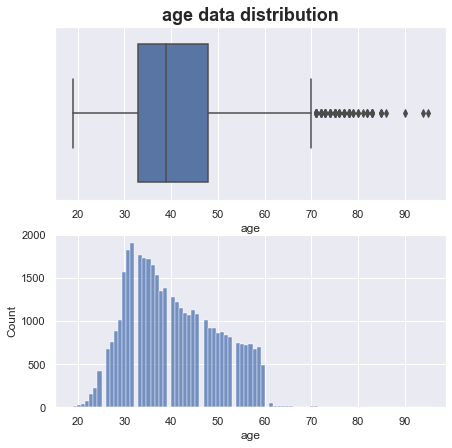

In [280]:
#set the plot dimensions
countplt, axes=plt.subplots(2,1,figsize = (7,7))
# Call regplot on each axes
sns.boxplot(x=pd_input_data['age'] , ax=axes[0])
sns.histplot(x=pd_input_data['age'], ax=axes[1])
axes[0].set_title('age data distribution',fontsize = 18, fontweight='bold')

In [281]:
# Calculate the outlier precentages 
age_outlier_precent, age_indexes = calculate_outlier_stats(pd_input_data, 'age')

outlier percentage 0.198 %


**Analysis(based on dataset):**<br>
i.   There are multiple outliers present in the distribution.<br>
ii.  The age data seems to be right skewed.<br>
iii. 0.198 % records of entire dataset are outliers.<br>


**b. _Understanding distribution of balance feature_**

Text(0.5, 1.0, 'balance data distribution')

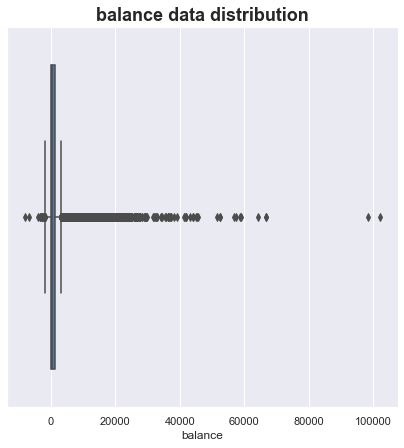

In [282]:
#set the plot dimensions
countplt, ax=plt.subplots(figsize = (7,7))
# Plot a boxplot for balance feature
ax=sns.boxplot(x=pd_input_data['balance'])
ax.set_title('balance data distribution',fontsize = 18, fontweight='bold')

In [283]:
# Calculate the outlier precentages 
balance_outlier_precent, balance_indexes = calculate_outlier_stats(pd_input_data, 'balance')

outlier percentage 10.700 %


**Analysis(based on dataset):**<br>
i. There are too many outliers present in the distribution.<br>
ii. The age data seems to be right skewed.<br>
iii. 10.699% of data records attribute to outliers.<br>

**c. _Understanding distribution of duration feature_**

Text(0.5, 1.0, 'duration data distribution')

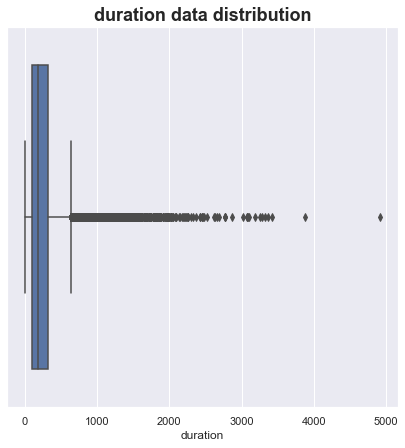

In [284]:
# Plot a boxplot for duration feature
countplt, ax = plt.subplots(figsize = (7,7))
ax = sns.boxplot(x=pd_input_data['duration'])
ax.set_title('duration data distribution',fontsize = 18, fontweight='bold')

In [285]:
# Calculate the outlier precentages 
duration_outlier_precent, duration_indexes = calculate_outlier_stats(pd_input_data, 'duration')

outlier percentage 7.500 %


**Analysis(based on dataset):**<br>
i. There are too many outliers present in the distribution.<br>
ii. The age data seems to be right skewed.<br>
iii. 7.473% of the records attribute to outliers.<br>

**d. _Understanding distribution of campaign feature_**

<AxesSubplot:xlabel='campaign'>

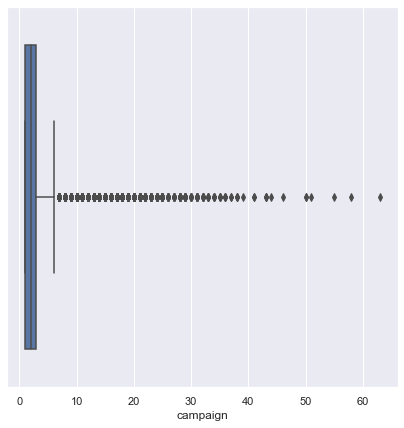

In [286]:
countplt, ax = plt.subplots(figsize = (7,7))
#Analyze the campaign feature
sns.boxplot(x=pd_input_data['campaign'])

In [287]:
# Calculate the outlier precentages 
campaign_outlier_precent, campaign_indexes = calculate_outlier_stats(pd_input_data, 'campaign')

outlier percentage 7.480 %


**Analysis(based on dataset):**<br>
i. There are too many outliers present in the distribution.<br>
ii. The age data seems to be right skewed.<br>
iii. 7.48% records attribute to outliers.<br>

**e. _Understanding distribution of job feature_**

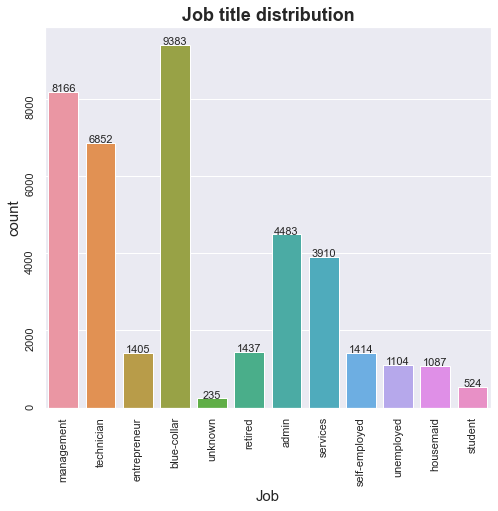

In [288]:
# Generate plot for job tittle distribution in datatset
countplt, ax = plt.subplots(figsize = (8,7))
ax=sns.countplot(x = 'job', data=pd_input_data)
ax.set_title('Job title distribution',fontsize = 18, fontweight='bold')
ax.set_xlabel('Job', fontsize =15)
ax.set_ylabel('count', fontsize = 15)
ax.tick_params(labelrotation=90)
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
             rect.get_height(), horizontalalignment='center', fontsize = 11)

**Analysis(based on dataset):**<br>
 i. Blue-collar jobs are the most prominent job, followed by management, and then technicians for this dataset.<br>
ii. The data is not equally spread into all categories.<br>

**f. _Understanding distribution of marital  and education features_**

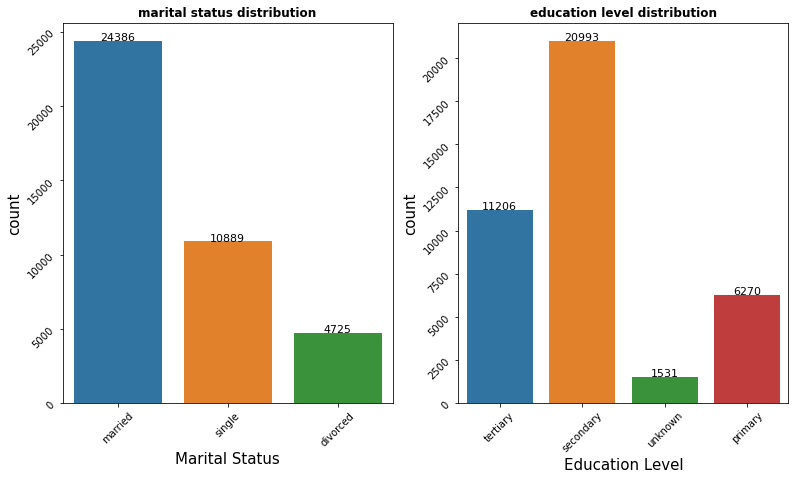

In [379]:
# Generate plot for marital distribution in datatset
countplt, ax = plt.subplots(1,2,figsize = (13,7))
sns.countplot(x = 'marital', data=pd_input_data, ax =ax[0])
ax[0].set_title('marital status distribution',fontsize = 12, fontweight='bold')
ax[0].set_xlabel('Marital Status', fontsize =15)
ax[0].set_ylabel('count', fontsize = 15)
ax[0].tick_params(labelrotation=45)
for rect in ax[0].patches:
    ax[0].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
             rect.get_height(), horizontalalignment='center', fontsize = 11)
    
ax[1]=sns.countplot(x = 'education', data=pd_input_data)
ax[1].set_title('education level distribution',fontsize = 12, fontweight='bold')
ax[1].set_xlabel('Education Level', fontsize =15)
ax[1].set_ylabel('count', fontsize = 15)
ax[1].tick_params(labelrotation=45)
for rect in ax[1].patches:
    ax[1].text (rect.get_x() + rect.get_width()/2, rect.get_height() + 0.75,
             rect.get_height(), horizontalalignment='center', fontsize = 11)

**Analysis(based on dataset):**<br>
 i. Blue-collar jobs are the most prominent job, followed by management, and then technicians for this dataset.<br>
ii. The data is not equally spread into all categories.<br>
iii. Secondary education level is the most common education level followed by tertiary.<br>

**g. _Understanding distribution of housing and loan features_**

Text(0, 0.5, 'count')

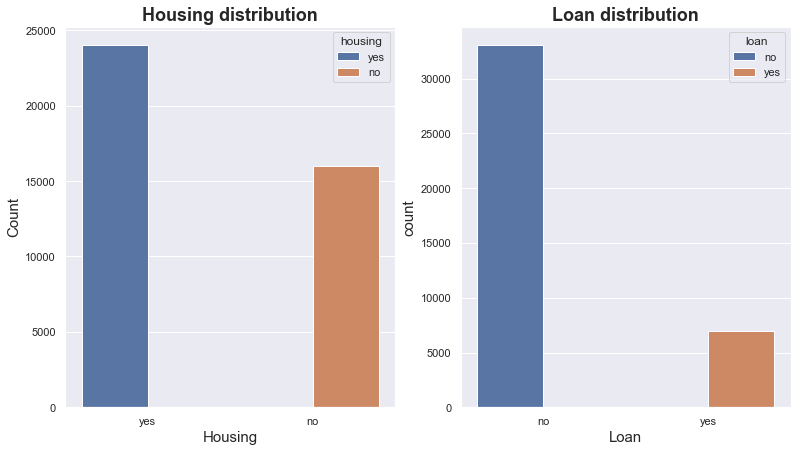

In [290]:
# Set the plot dimensions 
countplt, axes = plt.subplots(1,2,figsize = (13,7))
sns.countplot(x = 'housing', data=pd_input_data, ax =axes[0], hue='housing')
axes[0].set_title('Housing distribution',fontsize = 18, fontweight='bold')
axes[0].set_xlabel('Housing', fontsize =15)
axes[0].set_ylabel('Count', fontsize = 15)
sns.countplot(x = 'loan', data=pd_input_data, ax =axes[1], hue='loan')
axes[1].set_title('Loan distribution',fontsize = 18, fontweight='bold')
axes[1].set_xlabel('Loan', fontsize =15)
axes[1].set_ylabel('count', fontsize = 15)

**Analysis:**<br>
    i. The majority of population belonging to this dataset has house loans.<br>
   ii. The majority of poplulation belonging to this dataset do not have personal loans.<br>

**h. _Understanding distribution of day and month feature_**

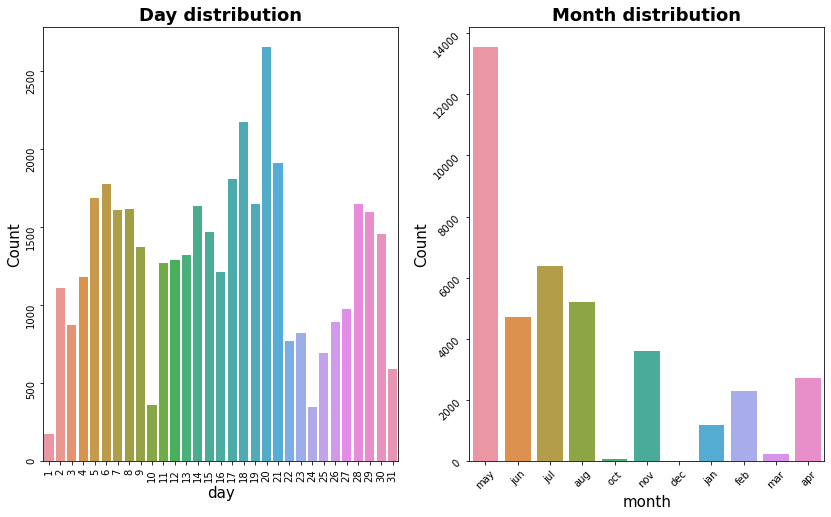

In [380]:
# Set the plot dimensions 
countplt, axes = plt.subplots(1,2,figsize = (14,8))
sns.countplot(x = 'day', data=pd_input_data, ax =axes[0],fill=True)
axes[0].set_title('Day distribution',fontsize = 18, fontweight='bold')
axes[0].set_xlabel('day', fontsize =15)
axes[0].set_ylabel('Count', fontsize = 15)
axes[0].tick_params(labelrotation=90)
sns.countplot(x = 'month', data=pd_input_data, ax =axes[1],fill=True)
axes[1].set_title('Month distribution',fontsize = 18, fontweight='bold')
axes[1].set_xlabel('month', fontsize =15)
axes[1].set_ylabel('Count', fontsize = 15)
axes[1].tick_params(labelrotation=45)

**Analysis(based on dataset):**<br>
  i. From the plot we can see most of the call were made in the mid of the month.<br>
 ii. The number of calls made varies throughout the month, but the first day of month records the lowest number.<br>
iii. Month of may has registered the most number of calls, and oct registered the lowest number of calls.<br>
    

**Step 3. Let's analyze correlation among different continuous features.**<br>
Let's analyze if there is any correlation between age, campaign, duration and balance features.

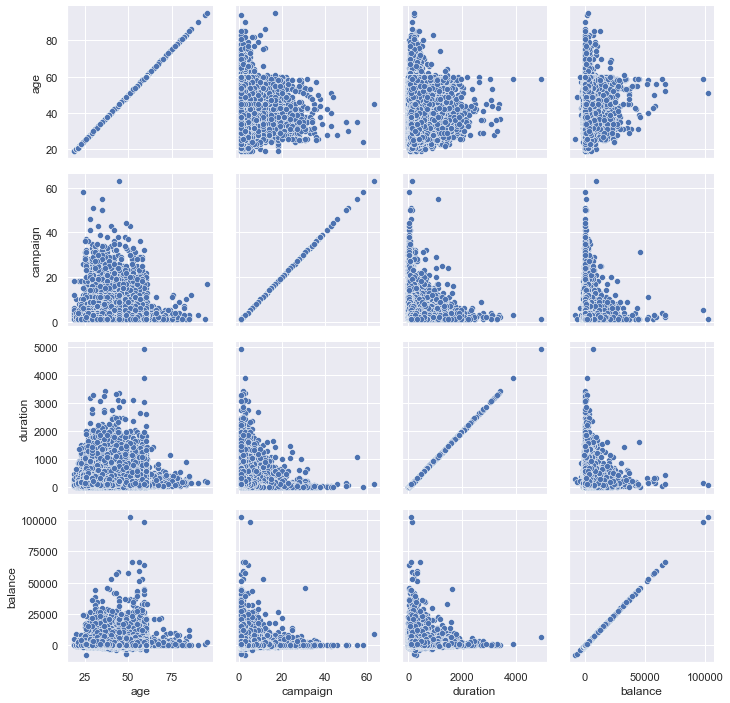

In [292]:
# Generate the pair grids
g = sns.PairGrid(pd_input_data[['age', 'campaign', 'duration', 'balance']])
# Plot the pair grid
g.map(sns.scatterplot)

From pair plots we do not see any clear correlation between any of the features.<br>
correlation matrix for more indepth analysis.

<AxesSubplot:>

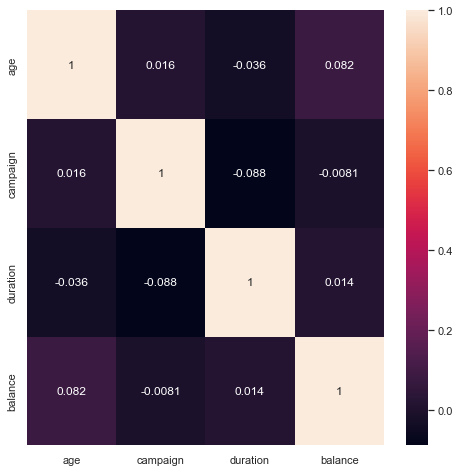

In [293]:
# Compute the correlation matrix
corr_matrix = pd_input_data[['age', 'campaign', 'duration', 'balance']].corr()

# Set the plot dimensions 
countplt, axes = plt.subplots(figsize = (8,8))

# Generate a color map
colour_map = sns.diverging_palette(220, 30, as_cmap=True)

# Draw the map
sns.heatmap(corr_matrix, annot=True) 

Let's analyze if there is any correlation between 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'day' and 'month' features. 

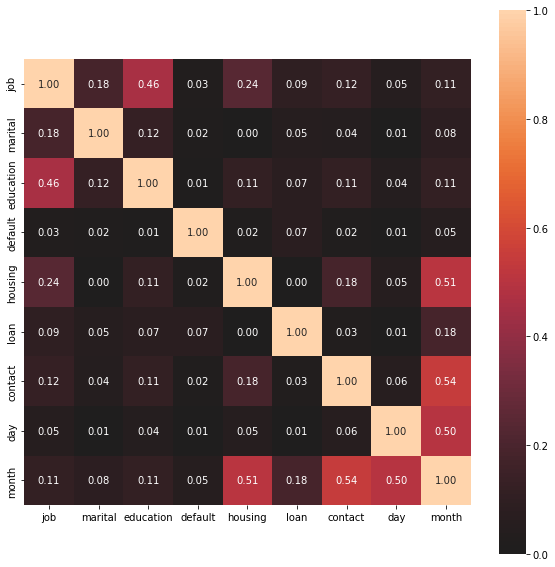

In [387]:
# Select categorical column
categorical_df= pd_input_data[['job', 'marital', 'education', 'default', 'housing',
                                'loan', 'contact', 'day', 'month']].copy()

# plot the categorical correlation heatmap
categorical_correlation= associations(categorical_df, filename= 'categorical_correlation.png', figsize=(10,10))

From the correlation matrix, we can conclude below:

    i. day and month, housing and month seems to have a positive correlation.
    ii. contact and month also seems to have a stronger positive correlation.

Let's understand the class labels for the distribution.

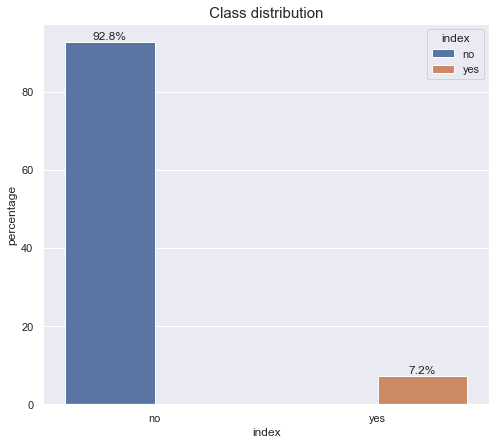

In [295]:
# Generate the class percentages
class_counts = pd_input_data['y'].value_counts(normalize=True).\
                rename('percentage').mul(100).reset_index()

# Set the plot dimension
countplt, sns_bar_plot = plt.subplots(figsize = (8,7))

# Generate a countplot for class labels
sns_bar_plot = sns.barplot(x="index", y="percentage", hue="index", data=class_counts)
sns_bar_plot.set_title(" Class distribution " , fontsize =15)

# Generate the labels 
for ptch_i in range(len(sns_bar_plot.patches)):
    # x-coordinate for the label
    x_cor = sns_bar_plot.patches[ptch_i].get_x() + (sns_bar_plot.patches[ptch_i].get_width()/2)
    # y-coordinate for the label
    y_cor = sns_bar_plot.patches[ptch_i].get_height()
    #Anotate the percentage
    sns_bar_plot.annotate('{:.1f}%'.format(y_cor), (x_cor, y_cor+ 0.5), ha='center')

plt.show()

From the dataset it looks like the class label distribution is extrememly disbalanced. 

## Generate Features And Labels:

**Step 7. Normalize the features and generate test and train datasets.**

In [7]:
# Set features and labels value
features = pd_input_data[['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 
                           'loan', 'contact', 'day', 'month', 'duration', 'campaign']]
labels = np.ravel(pd_input_data[['y']])

# Split the datasets into train and test datasets
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, 
                                                                         test_size=0.3, random_state=random_seed)


**Step 8. Transform the prediction labels.**

In [8]:
# Transform the predicted labels 
lbl_pred = LabelEncoder()

# Fit the label encoder
lbl_pred.fit(labels_train)

# Transform the train label
labels_train= lbl_pred.transform(labels_train)

# Transform the test label
labels_test= lbl_pred.transform(labels_test)

**Step 9. Define transformation pipelines for numerical and categorical features.**

In [9]:
# Set the numeric feature column names
numeric_features = ['age', 'balance', 'duration', 'campaign']

# Define the numeric transformers
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])

# Set the categorical feature column names
categorical_features = ['job', 'marital', 'education', 'default',\
                        'housing', 'loan', 'contact', 'day', 'month']

# Define the categorical transformers
categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Define the column transformer
preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, numeric_features),
                                               ('cat', categorical_transformer, categorical_features)])

# Create a list containing evaluation summary
eval_report = []

**Step 10. Build the pipeline and train model to see prediction results.**

In [10]:
# Build the pipeline for LogisticRegressionCV training
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', LogisticRegressionCV(cv=5, random_state=random_seed, 
                                                        class_weight='balanced',
                                                        scoring='roc_auc',
                                                        max_iter=4000
                                                       )
                      )
                     ])

# Fit the model
clf.fit(features_train, labels_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'balance', 'duration',
                                                   'campaign']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'day', 'month'])])),
                ('classifier',
                 LogisticRe

**Explore the metrics**

-------------------------------------------------------------

Performance metrics for  LogisticRegressionCV :

-------------------------------------------------------------

Model Accuracy :
model score: 0.937
-------------------------------------------------------------

ROC AUC score: 0.867
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       0.99      0.87      0.93     11126
           1       0.34      0.86      0.49       874

    accuracy                           0.87     12000
   macro avg       0.67      0.87      0.71     12000
weighted avg       0.94      0.87      0.89     12000

-------------------------------------------------------------

Confusion Matrix  :


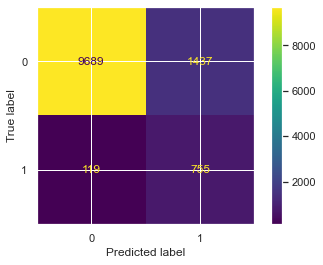

In [302]:
# Generate the model performance 
final_eval=model_performance_report(clf, "LogisticRegressionCV", features_test, labels_test)  

# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LogisticRegressionCV", final_eval[0] , final_eval[1], "balanced" , "roc_auc", "No"])

The model accuracy is good, but from the classification and report we can see that the model is extremely good at predicting 0 labels.

**Step 11. Let's explore PyCaret library if it can improve the accuracy score.**

 **Set up**<br>
 
exp_clf101 = setup(data = pd_input_data, target = 'y', train_size =0.7,categorical_features=categorical_features, numeric_features=numeric_features,normalize = True, session_id = 101)

|index|Description|Value|
|---|---|---|
|0|session\_id|101|
|1|Target|y|
|2|Target Type|Binary|
|3|Label Encoded|None|
|4|Original Data|40000,14|
|5|Missing Values|false|
|6|Numeric Features|4|
|7|Categorical Features|9|
|8|Ordinal Features|false|
|9|High Cardinality Features|false|
|10|High Cardinality Method||
|11|Transformed Train Set|27999,71|
|12|Transformed Test Set|12001,71|
|13|Shuffle Train-Test|True|
|14|Stratify Train-Test|False|
|15|Fold Generator|StratifiedKFold|
|16|Fold Number|10|
|17|CPU Jobs|-1|
|18|Use GPU|false|
|19|Log Experiment|false|
|20|Experiment Name|clf-default-name|
|21|USI|034b|
|22|Imputation Type|simple|
|23|Iterative Imputation Iteration|None|
|24|Numeric Imputer|mean|
|25|Iterative Imputation Numeric Model|None|
|26|Categorical Imputer|constant|
|27|Iterative Imputation Categorical Model|None|
|28|Unknown Categoricals Handling|least\_frequent|
|29|Normalize|true|
|30|Normalize Method|zscore|
|31|Transformation|false|
|32|Transformation Method|None|
|33|PCA|false|
|34|PCA Method|None|
|35|PCA Components|None|
|36|Ignore Low Variance|false|
|37|Combine Rare Levels|false|
|38|Rare Level Threshold|None|
|39|Numeric Binning|false|
|40|Remove Outliers|false|
|41|Outliers Threshold||
|42|Remove Multicollinearity|false|
|43|Multicollinearity Threshold||
|44|Remove Perfect Collinearity|true|
|45|Clustering|false|
|46|Clustering Iteration||
|47|Polynomial Features|false|
|48|Polynomial Degree||
|49|Trignometry Features|false|
|50|Polynomial Threshold||
|51|Group Features|false|
|52|Feature Selection|false|
|53|Feature Selection Method|classic|
|54|Features Selection Threshold||
|55|Feature Interaction|false|
|56|Feature Ratio|false|
|57|Interaction Threshold||
|58|Fix Imbalance|false|
|59|Fix Imbalance Method|SMOTE|

**Compare the model**<br>

|index|Model|Accuracy|AUC|Recall|Prec\.|F1|Kappa|MCC|TT \(Sec)|
|---|---|---|---|---|---|---|---|---|---|
|lightgbm|Light Gradient Boosting Machine|0\.9371|0\.9486|0\.4078|0\.606|0\.4868|0\.4547|0\.4652|0\.397|
|gbc|Gradient Boosting Classifier|0\.9367|0\.9437|0\.3654|0\.6168|0\.4584|0\.4272|0\.444|4\.208|
|lr|Logistic Regression|0\.9349|0\.9297|0\.2968|0\.6198|0\.4008|0\.3709|0\.3995|0\.981|
|rf|Random Forest Classifier|0\.9346|0\.9378|0\.289|0\.6172|0\.3934|0\.3636|0\.3932|3\.016|
|svm|SVM - Linear Kernel|0\.9336|0\.0|0\.2172|0\.6506|0\.3072|0\.284|0\.3359|0\.181|
|lda|Linear Discriminant Analysis|0\.9334|0\.9314|0\.4496|0\.5573|0\.4971|0\.4619|0\.4653|0\.37|
|knn|K Neighbors Classifier|0\.9321|0\.8338|0\.2915|0\.5734|0\.3857|0\.3539|0\.3771|13\.775|
|ridge|Ridge Classifier|0\.9314|0\.0|0\.1504|0\.6395|0\.2431|0\.2213|0\.2873|0\.057|
|ada|Ada Boost Classifier|0\.9309|0\.9293|0\.3348|0\.5513|0\.4158|0\.3814|0\.3953|1\.14|
|et|Extra Trees Classifier|0\.9291|0\.9198|0\.198|0\.549|0\.2904|0\.2617|0\.3003|3\.361|
|dummy|Dummy Classifier|0\.9266|0\.5|0\.0|0\.0|0\.0|0\.0|0\.0|0\.028|
|dt|Decision Tree Classifier|0\.9182|0\.7014|0\.4472|0\.4449|0\.4456|0\.4016|0\.4018|0\.282|
|nb|Naive Bayes|0\.6621|0\.7729|0\.7791|0\.1513|0\.2533|0\.1487|0\.2325|0\.057|
|qda|Quadratic Discriminant Analysis|0\.4448|0\.5129|0\.5927|0\.076|0\.1334|0\.0055|0\.0144|0\.192|

From the results **'Light Gradient Boosting Machine'** seems to be the best algorithm. But even for lightgbm the recall and **F1 score** is pretty low. <br>
Maybe stratifying option will help in improving the **F1 score** of the algorithm.

Re-run of pycaret to fix the imbalance issue<br>

**Fix the imbalance issue** <br>
exp_clf101 = setup(data = pd_input_data, target = 'y', train_size =0.7, normalize = True,
                   categorical_features=categorical_features, numeric_features=numeric_features,
                    fix_imbalance= True, session_id = random_seed)<br>
                    
|index|Description|Value|
|---|---|---|
|0|session\_id|1212|
|1|Target|y|
|2|Target Type|Binary|
|3|Label Encoded|None|
|4|Original Data|40000,14|
|5|Missing Values|false|
|6|Numeric Features|4|
|7|Categorical Features|9|
|8|Ordinal Features|false|
|9|High Cardinality Features|false|
|10|High Cardinality Method||
|11|Transformed Train Set|27999,71|
|12|Transformed Test Set|12001,71|
|13|Shuffle Train-Test|True|
|14|Stratify Train-Test|False|
|15|Fold Generator|StratifiedKFold|
|16|Fold Number|10|
|17|CPU Jobs|-1|
|18|Use GPU|false|
|19|Log Experiment|false|
|20|Experiment Name|clf-default-name|
|21|USI|f8fa|
|22|Imputation Type|simple|
|23|Iterative Imputation Iteration|None|
|24|Numeric Imputer|mean|
|25|Iterative Imputation Numeric Model|None|
|26|Categorical Imputer|constant|
|27|Iterative Imputation Categorical Model|None|
|28|Unknown Categoricals Handling|least\_frequent|
|29|Normalize|true|
|30|Normalize Method|zscore|
|31|Transformation|false|
|32|Transformation Method|None|
|33|PCA|false|
|34|PCA Method|None|
|35|PCA Components|None|
|36|Ignore Low Variance|false|
|37|Combine Rare Levels|false|
|38|Rare Level Threshold|None|
|39|Numeric Binning|false|
|40|Remove Outliers|false|
|41|Outliers Threshold||
|42|Remove Multicollinearity|false|
|43|Multicollinearity Threshold||
|44|Remove Perfect Collinearity|true|
|45|Clustering|false|
|46|Clustering Iteration||
|47|Polynomial Features|false|
|48|Polynomial Degree||
|49|Trignometry Features|false|
|50|Polynomial Threshold||
|51|Group Features|false|
|52|Feature Selection|false|
|53|Feature Selection Method|classic|
|54|Features Selection Threshold||
|55|Feature Interaction|false|
|56|Feature Ratio|false|
|57|Interaction Threshold||
|58|Fix Imbalance|true|
|59|Fix Imbalance Method|SMOTE|


<br>
Compare the models: <br>
<br>


|index|Model|Accuracy|AUC|Recall|Prec\.|F1|Kappa|MCC|TT \(Sec)|
|---|---|---|---|---|---|---|---|---|---|
|lightgbm|Light Gradient Boosting Machine|0\.932|0\.94334|0\.55487|0\.5282|0\.54077|0\.50411|0\.50452|1\.71|
|rf|Random Forest Classifier|0\.93118|0\.93811|0\.44061|0\.52806|0\.47992|0\.44344|0\.44576|7\.516|
|et|Extra Trees Classifier|0\.9301|0\.92007|0\.3071|0\.52752|0\.38728|0\.35307|0\.36807|8\.639|
|dummy|Dummy Classifier|0\.92778|0\.5|0\.0|0\.0|0\.0|0\.0|0\.0|0\.348|
|dt|Decision Tree Classifier|0\.9091|0\.71362|0\.48514|0\.39462|0\.43476|0\.38595|0\.38864|1\.137|
|gbc|Gradient Boosting Classifier|0\.90275|0\.93263|0\.76354|0\.40831|0\.53172|0\.48306|0\.51281|11\.711|
|ada|Ada Boost Classifier|0\.8985|0\.91432|0\.70915|0\.3893|0\.50235|0\.45118|0\.47659|2\.951|
|lda|Linear Discriminant Analysis|0\.87603|0\.92241|0\.80512|0\.34616|0\.48395|0\.42599|0\.47542|1\.073|
|ridge|Ridge Classifier|0\.87596|0\.0|0\.80512|0\.34602|0\.48381|0\.42583|0\.47529|0\.389|
|lr|Logistic Regression|0\.872|0\.93065|0\.84221|0\.34312|0\.48737|0\.42876|0\.48566|2\.586|
|knn|K Neighbors Classifier|0\.87175|0\.86867|0\.74577|0\.32895|0\.45635|0\.39582|0\.43879|20\.736|
|svm|SVM - Linear Kernel|0\.85564|0\.0|0\.86494|0\.3181|0\.46452|0\.4013|0\.46912|0\.659|
|nb|Naive Bayes|0\.48062|0\.73096|0\.80315|0\.10304|0\.18264|0\.06265|0\.135|0\.384|
|qda|Quadratic Discriminant Analysis|0\.07254|0\.50017|1\.0|0\.07224|0\.13475|5e-05|0\.00377|0\.608|

Here we can see lightgbm is giving a good accuracy for the model and **F1 score** has also improved a bit. Let's use another Metric auc_roc, this might be the best metric to us as the dataset is disbalanced 


**Fix the imbalance issue and add roc_auc metric**<br> 
exp_clf101 = setup(data = pd_input_data, target = 'y', train_size =0.7, normalize = True,
                   categorical_features=categorical_features, numeric_features=numeric_features,
                    fix_imbalance= True, session_id = random_seed)
<br>


|index|Description|Value|
|---|---|---|
|0|session\_id|1212|
|1|Target|y|
|2|Target Type|Binary|
|3|Label Encoded|None|
|4|Original Data|40000,14|
|5|Missing Values|false|
|6|Numeric Features|4|
|7|Categorical Features|9|
|8|Ordinal Features|false|
|9|High Cardinality Features|false|
|10|High Cardinality Method||
|11|Transformed Train Set|27999,71|
|12|Transformed Test Set|12001,71|
|13|Shuffle Train-Test|True|
|14|Stratify Train-Test|False|
|15|Fold Generator|StratifiedKFold|
|16|Fold Number|10|
|17|CPU Jobs|-1|
|18|Use GPU|false|
|19|Log Experiment|false|
|20|Experiment Name|clf-default-name|
|21|USI|94b0|
|22|Imputation Type|simple|
|23|Iterative Imputation Iteration|None|
|24|Numeric Imputer|mean|
|25|Iterative Imputation Numeric Model|None|
|26|Categorical Imputer|constant|
|27|Iterative Imputation Categorical Model|None|
|28|Unknown Categoricals Handling|least\_frequent|
|29|Normalize|true|
|30|Normalize Method|zscore|
|31|Transformation|false|
|32|Transformation Method|None|
|33|PCA|false|
|34|PCA Method|None|
|35|PCA Components|None|
|36|Ignore Low Variance|false|
|37|Combine Rare Levels|false|
|38|Rare Level Threshold|None|
|39|Numeric Binning|false|
|40|Remove Outliers|false|
|41|Outliers Threshold||
|42|Remove Multicollinearity|false|
|43|Multicollinearity Threshold||
|44|Remove Perfect Collinearity|true|
|45|Clustering|false|
|46|Clustering Iteration||
|47|Polynomial Features|false|
|48|Polynomial Degree||
|49|Trignometry Features|false|
|50|Polynomial Threshold||
|51|Group Features|false|
|52|Feature Selection|false|
|53|Feature Selection Method|classic|
|54|Features Selection Threshold||
|55|Feature Interaction|false|
|56|Feature Ratio|false|
|57|Interaction Threshold||
|58|Fix Imbalance|true|
|59|Fix Imbalance Method|SMOTE|



<br>


**add roc_auc metric in pycaret**<br> 

add_metric('roc_auc', 'RocAuc' ,roc_auc_score, greater_is_better=True)

**Compare the model**<br>
best = compare_models(cross_validation = True, round= 5, sort='RocAuc')
<br>


|index|Model|Accuracy|AUC|Recall|Prec\.|F1|Kappa|MCC|RocAuc|TT \(Sec)|
|---|---|---|---|---|---|---|---|---|---|---|
|svm|SVM - Linear Kernel|0\.85564|0\.0|0\.86494|0\.3181|0\.46452|0\.4013|0\.46912|0\.85993|0\.709|
|lr|Logistic Regression|0\.872|0\.93065|0\.84221|0\.34312|0\.48737|0\.42876|0\.48566|0\.85826|2\.181|
|lda|Linear Discriminant Analysis|0\.87603|0\.92241|0\.80512|0\.34616|0\.48395|0\.42599|0\.47542|0\.84334|1\.157|
|ridge|Ridge Classifier|0\.87596|0\.0|0\.80512|0\.34602|0\.48381|0\.42583|0\.47529|0\.8433|0\.404|
|gbc|Gradient Boosting Classifier|0\.90275|0\.93263|0\.76354|0\.40831|0\.53172|0\.48306|0\.51281|0\.83856|12\.408|
|knn|K Neighbors Classifier|0\.87175|0\.86867|0\.74577|0\.32895|0\.45635|0\.39582|0\.43879|0\.81366|24\.981|
|ada|Ada Boost Classifier|0\.8985|0\.91432|0\.70915|0\.3893|0\.50235|0\.45118|0\.47659|0\.81119|3\.247|
|lightgbm|Light Gradient Boosting Machine|0\.932|0\.94334|0\.55487|0\.5282|0\.54077|0\.50411|0\.50452|0\.75811|1\.772|
|dt|Decision Tree Classifier|0\.9091|0\.71362|0\.48514|0\.39462|0\.43476|0\.38595|0\.38864|0\.71362|1\.279|
|rf|Random Forest Classifier|0\.93118|0\.93811|0\.44061|0\.52806|0\.47992|0\.44344|0\.44576|0\.70498|8\.076|
|et|Extra Trees Classifier|0\.9301|0\.92007|0\.3071|0\.52752|0\.38728|0\.35307|0\.36807|0\.64285|10\.02|
|nb|Naive Bayes|0\.48062|0\.73096|0\.80315|0\.10304|0\.18264|0\.06265|0\.135|0\.62934|0\.399|
|qda|Quadratic Discriminant Analysis|0\.07254|0\.50017|1\.0|0\.07224|0\.13475|5e-05|0\.00377|0\.50017|0\.654|
|dummy|Dummy Classifier|0\.92778|0\.5|0\.0|0\.0|0\.0|0\.0|0\.0|0\.5|0\.36|




<br>

Based on the RocAUC metric looks like SVM, Logistic Regression and Linear Discriminant seems to be the good way.

**Step 12. Let's handle the imbalance in the dataset and then try to improve Light Gradient Boosting Machine Model.**
<br>


We are able to generate a balanced datatset after oversampling. Let's proceed with the training of Light Gradient Boosting Model. <br>

c. Train Light Gradient Boosting Model <br>

In [303]:
# Build the pipeline
model_lgbm = Pipeline(steps=[('preprocessor', preprocessor),
                             ('classifier',LGBMClassifier(random_state=random_seed,
                                                          #class_weight ='balanced',
                                                          objective='binary',
                                                          is_unbalance=True,
                                                          metric='auc'))
                            ])
# Evaluate the model
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=random_seed)


# Train the model
model_lgbm.fit(features_train, labels_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'balance', 'duration',
                                                   'campaign']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'day', 'month'])])),
                ('classifier',
                 LGBMClassi

-------------------------------------------------------------

Performance metrics for  LGBMClassifier on balanced training dataset :

-------------------------------------------------------------

Model Accuracy :
model score: 0.887
-------------------------------------------------------------

ROC AUC score: 0.885
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       0.99      0.89      0.94     11126
           1       0.38      0.88      0.53       874

    accuracy                           0.89     12000
   macro avg       0.69      0.88      0.73     12000
weighted avg       0.95      0.89      0.91     12000

-------------------------------------------------------------

Confusion Matrix  :


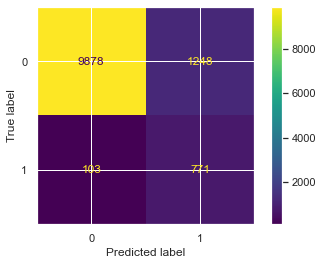

In [304]:
# Generate the model performance 
final_eval=model_performance_report(model_lgbm, "LGBMClassifier on balanced training dataset", 
                                     features_test, labels_test)  

# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LGBMClassifier", final_eval[0] , final_eval[1], "balanced" , "auc", "No"])

From the model we can see even though the accuracy has dropped, but the model **roc_auc** has increased 
indicating that the model is becoming better at predicting both class labels. Let's tune the hyperparameter and see if it helps.

In [11]:
# Fine tuning of LGBMClassifier
grid_params = {
    'classifier__learning_rate': sp_randFloat(), #[0.05],
    'classifier__num_leaves': sp_randInt(20, 80),
    'classifier__boosting_type' : ['gbdt', 'dart'],
    'classifier__objective' : ['binary'],
    'classifier__max_depth' : sp_randInt(4, 8),#[5,6,7,8],
    'classifier__random_state' : [random_seed], 
    'classifier__colsample_bytree' :sp_randFloat(),# [0.5,0.7],
    'classifier__subsample' : sp_randFloat(),#[0.5,0.7],
    'classifier__min_split_gain' : [0.01],
    'classifier__class_weight' : ['balanced'],
    'classifier__metric': ['auc', 'l1', 'l2', 'binary_logloss'],
    'classifier__is_unbalance' : [True],
    'classifier__metric': ['auc']
    }

# Perform hyper parameter tunning 
model_gbc_grid_param, score, _ = return_optimized_hyper_parameter(LGBMClassifier(), preprocessor, grid_params, 
                                                               features_train_ovr, labels_train_ovr, 
                                                               cv=5, n_iter=2000)

Fitting 5 folds for each of 2000 candidates, totalling 10000 fits
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.897 total time=   0.4s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.899 total time=   0.6s
[CV 4/5] END classifier__boo

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.889 total time=   0.4s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.869217625368181, classifier__is_unbalance=True, classifier__learning_rate=0.281465958012288, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.752380128410048;, score=0.941 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.900 total time=   0.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.869217625368181, classifier__is_unbalance=True, classifier__learning_rate=0.281465958012288, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.752380128410048;, score=0.936 total time=   2.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.906 total time=   0.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.869217625368181, classifier__is_unbalance=True, classifier__learning_rate=0.281465958012288, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.752380128410048;, score=0.936 total time=   2.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7752108437741816, classifier__is_unbalance=True, classifier__learning_rate=0.07433056879513888, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0917381116706153;, score=0.942 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7752108437741816, classifier__is_unbalance=True, classifier__learning_rate=0.07433056879513888, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0917381116706153;, score=0.940 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.31035471097124645, classifier__is_unbalance=True, classifier__learning_rate=0.1393396010067809, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5638970634680678;, score=0.937 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.26979851695342383, classifier__is_unbalance=True, classifier__learning_rate=0.5654127988994546, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5347283649245319;, score=0.916 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.26979851695342383, classifier__is_unbalance=True, classifier__learning_rate=0.5654127988994546, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5347283649245319;, score=0.913 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4384529545852236, classifier__is_unbalance=True, classifier__learning_rate=0.9306539223092242, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4264669320690425;, score=0.923 total time=   1.2s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06423251043510703, classifier__is_unbalance=True, classifier__learning_rate=0.3186744021983806, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.45712716678574117;, score=0.927 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06423251043510703, classifier__is_unbalance=True, classifier__learning_rate=0.3186744021983806, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.45712716678574117;, score=0.922 total time=   0.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.0782896196866687, classifier__is_unbalance=True, classifier__learning_rate=0.37925980903414835, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9506898294340294;, score=0.924 total time=   1.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.17237175596165877, classifier__is_unbalance=True, classifier__learning_rate=0.7695853116091905, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.31051825814516043;, score=0.910 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.857863113774601, classifier__is_unbalance=True, classifier__learning_rate=0.1505726789981805, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8286251631490634;, score=0.940 total time=   0.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6721107350390061, classifier__is_unbalance=True, classifier__learning_rate=0.8496636960147931, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.04069157073516472;, score=0.934 total time=   1.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.0782896196866687, classifier__is_unbalance=True, classifier__learning_rate=0.37925980903414835, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9506898294340294;, score=0.933 total time=   1.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.0782896196866687, classifier__is_unbalance=True, classifier__learning_rate=0.37925980903414835, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9506898294340294;, score=0.927 total time=   1.2s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06979352422460539, classifier__is_unbalance=True, classifier__learning_rate=0.552090924414751, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1336372765867907;, score=0.907 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8931831945037342, classifier__is_unbalance=True, classifier__learning_rate=0.3135239611203364, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.975105221139713;, score=0.928 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06979352422460539, classifier__is_unbalance=True, classifier__learning_rate=0.552090924414751, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1336372765867907;, score=0.911 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8931831945037342, classifier__is_unbalance=True, classifier__learning_rate=0.3135239611203364, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.975105221139713;, score=0.922 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8931831945037342, classifier__is_unbalance=True, classifier__learning_rate=0.3135239611203364, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.975105221139713;, score=0.928 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5787776990717608, classifier__is_unbalance=True, classifier__learning_rate=0.41231388789326817, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.22115917230723736;, score=0.933 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.23260432702264477, classifier__is_unbalance=True, classifier__learning_rate=0.2550248265183166, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8181984353511028;, score=0.934 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13895432083782622, classifier__is_unbalance=True, classifier__learning_rate=0.1845914535209895, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11906657796697184;, score=0.921 total time=   1.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13895432083782622, classifier__is_unbalance=True, classifier__learning_rate=0.1845914535209895, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11906657796697184;, score=0.925 total time=   1.3s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2395612458411428, classifier__is_unbalance=True, classifier__learning_rate=0.1517046376680492, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9439785608312827;, score=0.933 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4702982328289186, classifier__is_unbalance=True, classifier__learning_rate=0.6212674715553865, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6199594139327471;, score=0.934 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4702982328289186, classifier__is_unbalance=True, classifier__learning_rate=0.6212674715553865, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6199594139327471;, score=0.926 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13895432083782622, classifier__is_unbalance=True, classifier__learning_rate=0.1845914535209895, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11906657796697184;, score=0.928 total time=   1.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13895432083782622, classifier__is_unbalance=True, classifier__learning_rate=0.1845914535209895, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11906657796697184;, score=0.928 total time=   1.2s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6070687567992461, classifier__is_unbalance=True, classifier__learning_rate=0.2576175838392346, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7637719666028578;, score=0.938 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15500660538258537, classifier__is_unbalance=True, classifier__learning_rate=0.004209771753065139, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8006109040350572;, score=0.872 total time=   0.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.034296578246626575, classifier__is_unbalance=True, classifier__learning_rate=0.44326931544565307, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1391853962185976;, score=0.908 total time=   1.1s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6723685828941077, classifier__is_unbalance=True, classifier__learning_rate=0.7744708251693259, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10464203744746181;, score=0.925 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.46219647568639444, classifier__is_unbalance=True, classifier__learning_rate=0.5475738033949009, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08282092585188217;, score=0.926 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.46219647568639444, classifier__is_unbalance=True, classifier__learning_rate=0.5475738033949009, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08282092585188217;, score=0.919 total time=   0.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5130912160408121, classifier__is_unbalance=True, classifier__learning_rate=0.17938694153472656, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1130844218967576;, score=0.939 total time=   1.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5815432571069167, classifier__is_unbalance=True, classifier__learning_rate=0.7881637086699742, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7306323362853595;, score=0.916 total time=   0.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.05447517181432393, classifier__is_unbalance=True, classifier__learning_rate=0.9585152460989461, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10667000316169906;, score=0.908 total time=   1.1s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9102715038733329, classifier__is_unbalance=True, classifier__learning_rate=0.6495724286966195, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9247711438819018;, score=0.925 total time=   0.9s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7948742353596623, classifier__is_unbalance=True, classifier__learning_rate=0.8326453115441643, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2636754601104221;, score=0.932 total time=   1.2s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14897474490192897, classifier__is_unbalance=True, classifier__learning_rate=0.502346827738771, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5544457607149303;, score=0.925 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1237911642331595, classifier__is_unbalance=True, classifier__learning_rate=0.918443946581227, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1261130299697727;, score=0.933 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1237911642331595, classifier__is_unbalance=True, classifier__learning_rate=0.918443946581227, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1261130299697727;, score=0.930 total time=   1.5s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14897474490192897, classifier__is_unbalance=True, classifier__learning_rate=0.502346827738771, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5544457607149303;, score=0.933 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14897474490192897, classifier__is_unbalance=True, classifier__learning_rate=0.502346827738771, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5544457607149303;, score=0.923 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8914625334838367, classifier__is_unbalance=True, classifier__learning_rate=0.02456804251718958, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20016983698051904;, score=0.933 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8914625334838367, classifier__is_unbalance=True, classifier__learning_rate=0.02456804251718958, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20016983698051904;, score=0.932 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.516635096730911, classifier__is_unbalance=True, classifier__learning_rate=0.9377319514584298, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.03481174485970118;, score=0.927 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.937087344690949, classifier__is_unbalance=True, classifier__learning_rate=0.901965712136579, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.14484613314524397;, score=0.910 total time=   1.5s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8392123293297123, classifier__is_unbalance=True, classifier__learning_rate=0.3350670144179315, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8585424842270117;, score=0.936 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8914625334838367, classifier__is_unbalance=True, classifier__learning_rate=0.02456804251718958, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20016983698051904;, score=0.931 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3451571646242496, classifier__is_unbalance=True, classifier__learning_rate=0.7417430708638519, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6622287125252607;, score=0.918 total time=   1.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8836112771092131, classifier__is_unbalance=True, classifier__learning_rate=0.6856663361543159, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9288332791067601;, score=0.926 total time=   1.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2698745887279955, classifier__is_unbalance=True, classifier__learning_rate=0.30400218345995245, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.47118367855221244;, score=0.933 total time=   2.1s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2237218310625836, classifier__is_unbalance=True, classifier__learning_rate=0.7662652169814902, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8670344331187106;, score=0.923 total time=   2.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9966690285401447, classifier__is_unbalance=True, classifier__learning_rate=0.5832068387244859, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5435529245673828;, score=0.937 total time=   1.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9966690285401447, classifier__is_unbalance=True, classifier__learning_rate=0.5832068387244859, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5435529245673828;, score=0.936 total time=   1.3s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2237218310625836, classifier__is_unbalance=True, classifier__learning_rate=0.7662652169814902, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8670344331187106;, score=0.923 total time=   2.3s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3651721390365539, classifier__is_unbalance=True, classifier__learning_rate=0.33764617757706994, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9301709211384225;, score=0.934 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2237218310625836, classifier__is_unbalance=True, classifier__learning_rate=0.7662652169814902, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8670344331187106;, score=0.928 total time=   2.2s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3651721390365539, classifier__is_unbalance=True, classifier__learning_rate=0.33764617757706994, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9301709211384225;, score=0.930 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6411771659520962, classifier__is_unbalance=True, classifier__learning_rate=0.9269892827508577, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5417236875244893;, score=0.894 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6411771659520962, classifier__is_unbalance=True, classifier__learning_rate=0.9269892827508577, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5417236875244893;, score=0.676 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5515797670380201, classifier__is_unbalance=True, classifier__learning_rate=0.9394011087842217, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6599494257547043;, score=0.892 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1597489203673218, classifier__is_unbalance=True, classifier__learning_rate=0.024401610309475075, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3025166554665839;, score=0.912 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.07005700925293445, classifier__is_unbalance=True, classifier__learning_rate=0.8611382808042335, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8846824537002794;, score=0.912 total time=   1.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.19539192531528415, classifier__is_unbalance=True, classifier__learning_rate=0.9550496864179443, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12615206580301996;, score=0.925 total time=   1.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9759734639019005, classifier__is_unbalance=True, classifier__learning_rate=0.09938354865494625, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4604189051573323;, score=0.933 total time=   2.3s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6712521682113285, classifier__is_unbalance=True, classifier__learning_rate=0.7567705608641954, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.468707912042836;, score=0.921 total time=   1.5s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2129952714387091, classifier__is_unbalance=True, classifier__learning_rate=0.3847268011091556, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2230378849675645;, score=0.932 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2129952714387091, classifier__is_unbalance=True, classifier__learning_rate=0.3847268011091556, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2230378849675645;, score=0.929 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2129952714387091, classifier__is_unbalance=True, classifier__learning_rate=0.3847268011091556, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2230378849675645;, score=0.929 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.782798197198985, classifier__is_unbalance=True, classifier__learning_rate=0.4325468482098094, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9499180058540726;, score=0.924 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6783606346219846, classifier__is_unbalance=True, classifier__learning_rate=0.89942893410867, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2885412491301167;, score=0.905 total time=   1.9s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3109629170509671, classifier__is_unbalance=True, classifier__learning_rate=0.09110940815564716, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.846563171640483;, score=0.931 total time=   1.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.06883798773641991, classifier__is_unbalance=True, classifier__learning_rate=0.46101998040318215, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8945380980519497;, score=0.912 total time=   1.4s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8147968086046089, classifier__is_unbalance=True, classifier__learning_rate=0.24266645842932688, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.36365833863047214;, score=0.938 total time=   0.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4909199406239103, classifier__is_unbalance=True, classifier__learning_rate=0.5363563254593053, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.466705612277282;, score=0.920 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.45346819687873374, classifier__is_unbalance=True, classifier__learning_rate=0.014006947547161919, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7405350020857577;, score=0.913 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.45346819687873374, classifier__is_unbalance=True, classifier__learning_rate=0.014006947547161919, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7405350020857577;, score=0.910 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4803787011614362, classifier__is_unbalance=True, classifier__learning_rate=0.47936141224249507, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4025979135062576;, score=0.934 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.06832813521216818, classifier__is_unbalance=True, classifier__learning_rate=0.4268821901771457, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9412168167519959;, score=0.904 total time=   1.4s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.17327811871055343, classifier__is_unbalance=True, classifier__learning_rate=0.687492307808361, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5660450691147597;, score=0.931 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.536831522894252, classifier__is_unbalance=True, classifier__learning_rate=0.2367720573788984, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12281574895135239;, score=0.939 total time=   0.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7606674144459522, classifier__is_unbalance=True, classifier__learning_rate=0.5585945083877704, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0673049291739305;, score=0.939 total time=   1.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4438381734758161, classifier__is_unbalance=True, classifier__learning_rate=0.037610452047185494, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09443416520907344;, score=0.933 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15530640033603638, classifier__is_unbalance=True, classifier__learning_rate=0.7137212959455345, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4691412812514848;, score=0.905 total time=   0.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2779493330409176, classifier__is_unbalance=True, classifier__learning_rate=0.774242004421838, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12275532691719293;, score=0.917 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.20882755746952664, classifier__is_unbalance=True, classifier__learning_rate=0.15856060411973838, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.44158391951469933;, score=0.935 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5120154986668726, classifier__is_unbalance=True, classifier__learning_rate=0.9681808883844111, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2923209369414913;, score=0.922 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5120154986668726, classifier__is_unbalance=True, classifier__learning_rate=0.9681808883844111, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2923209369414913;, score=0.914 total time=   1.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08721212779668563, classifier__is_unbalance=True, classifier__learning_rate=0.7567704147896434, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.95119731583539;, score=0.904 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7045874043176619, classifier__is_unbalance=True, classifier__learning_rate=0.5132265250732013, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.312508419152309;, score=0.932 total time=   2.0s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8308904595911243, classifier__is_unbalance=True, classifier__learning_rate=0.8732627108740616, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3379361888131881;, score=0.890 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2794954315958703, classifier__is_unbalance=True, classifier__learning_rate=0.4019047982420435, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2898269847524192;, score=0.942 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1767363022074585, classifier__is_unbalance=True, classifier__learning_rate=0.68139924219558, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15319136621971896;, score=0.932 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1767363022074585, classifier__is_unbalance=True, classifier__learning_rate=0.68139924219558, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15319136621971896;, score=0.926 total time=   1.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1767363022074585, classifier__is_unbalance=True, classifier__learning_rate=0.68139924219558, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15319136621971896;, score=0.921 total time=   1.8s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8699650738417036, classifier__is_unbalance=True, classifier__learning_rate=0.23745128302860863, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8524320816484032;, score=0.935 total time=   1.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.11678348231637792, classifier__is_unbalance=True, classifier__learning_rate=0.9391345568186942, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07881195350897041;, score=0.872 total time=   0.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09134445480744413, classifier__is_unbalance=True, classifier__learning_rate=0.15740022359800176, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.14052663610508032;, score=0.915 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__col

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.11678348231637792, classifier__is_unbalance=True, classifier__learning_rate=0.9391345568186942, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07881195350897041;, score=0.915 total time=   0.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09134445480744413, classifier__is_unbalance=True, classifier__learning_rate=0.15740022359800176, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.14052663610508032;, score=0.905 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__col

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6530668308092127, classifier__is_unbalance=True, classifier__learning_rate=0.33589290843538233, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7268327292897324;, score=0.939 total time=   1.3s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8039258028849362, classifier__is_unbalance=True, classifier__learning_rate=0.36526977709616304, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6648852536989703;, score=0.938 total time=   1.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.759490055256446, classifier__is_unbalance=True, classifier__learning_rate=0.3033056197682702, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.06005599630815106;, score=0.942 total time=   1.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.759490055256446, classifier__is_unbalance=True, classifier__learning_rate=0.3033056197682702, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.06005599630815106;, score=0.937 total time=   1.3s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8296306009847427, classifier__is_unbalance=True, classifier__learning_rate=0.6626015767140179, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4758950910991655;, score=0.900 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9346631827634045, classifier__is_unbalance=True, classifier__learning_rate=0.7371170685204612, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6647364518080527;, score=0.864 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.840033961173075, classifier__is_unbalance=True, classifier__learning_rate=0.587136446531004, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7566219141698587;, score=0.923 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.840033961173075, classifier__is_unbalance=True, classifier__learning_rate=0.587136446531004, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7566219141698587;, score=0.910 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_by

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5917002425596358, classifier__is_unbalance=True, classifier__learning_rate=0.048107688875606125, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9146521478945489;, score=0.937 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1883796393677648, classifier__is_unbalance=True, classifier__learning_rate=0.9048705996705566, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5117819271216751;, score=0.909 total time=   0.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1883796393677648, classifier__is_unbalance=True, classifier__learning_rate=0.9048705996705566, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5117819271216751;, score=0.911 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7500116895122049, classifier__is_unbalance=True, classifier__learning_rate=0.7195123518641156, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.629589204214665;, score=0.932 total time=   1.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.819308150919772, classifier__is_unbalance=True, classifier__learning_rate=0.09115761726039662, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7599084548444482;, score=0.939 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.819308150919772, classifier__is_unbalance=True, classifier__learning_rate=0.09115761726039662, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7599084548444482;, score=0.936 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4165983818457415, classifier__is_unbalance=True, classifier__learning_rate=0.5621951186734135, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7853878954841882;, score=0.940 total time=   1.5s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4165983818457415, classifier__is_unbalance=True, classifier__learning_rate=0.5621951186734135, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7853878954841882;, score=0.935 total time=   1.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.907289692260809, classifier__is_unbalance=True, classifier__learning_rate=0.44698928043909036, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8153612655901705;, score=0.919 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6915288898839906, classifier__is_unbalance=True, classifier__learning_rate=0.2925906221033101, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5826570349024514;, score=0.936 total time=   2.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.789698783086586, classifier__is_unbalance=True, classifier__learning_rate=0.1984006895121595, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3391748820355187;, score=0.938 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.789698783086586, classifier__is_unbalance=True, classifier__learning_rate=0.1984006895121595, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3391748820355187;, score=0.937 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.39475510562271066, classifier__is_unbalance=True, classifier__learning_rate=0.8944559134923532, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12898125342054334;, score=0.895 total time=   2.1s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9364576182447256, classifier__is_unbalance=True, classifier__learning_rate=0.47859661637347106, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5211651162249765;, score=0.936 total time=   1.2s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.458557628906493, classifier__is_unbalance=True, classifier__learning_rate=0.7858282321381483, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2076537972328517;, score=0.904 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.458557628906493, classifier__is_unbalance=True, classifier__learning_rate=0.7858282321381483, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2076537972328517;, score=0.903 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6478803015850231, classifier__is_unbalance=True, classifier__learning_rate=0.07345706622943315, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7053472469030356;, score=0.932 total time=   2.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3278745904494157, classifier__is_unbalance=True, classifier__learning_rate=0.865750175614109, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3564909916944028;, score=0.919 total time=   1.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.21898439530565794, classifier__is_unbalance=True, classifier__learning_rate=0.10085237936899272, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23267193504273997;, score=0.933 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.21898439530565794, classifier__is_unbalance=True, classifier__learning_rate=0.10085237936899272, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23267193504273997;, score=0.933 total time=   2.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9396450182708829, classifier__is_unbalance=True, classifier__learning_rate=0.2700366359621844, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.25602441685328303;, score=0.938 total time=   2.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.18526021595324615, classifier__is_unbalance=True, classifier__learning_rate=0.7697800057441563, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5386263173634455;, score=0.933 total time=   1.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9396450182708829, classifier__is_unbalance=True, classifier__learning_rate=0.2700366359621844, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.25602441685328303;, score=0.940 total time=   2.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9396450182708829, classifier__is_unbalance=True, classifier__learning_rate=0.2700366359621844, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.25602441685328303;, score=0.941 total time=   2.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9257012260819393, classifier__is_unbalance=True, classifier__learning_rate=0.7047638204856687, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.581420909395376;, score=0.929 total time=   1.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.0987489785646376, classifier__is_unbalance=True, classifier__learning_rate=0.6994730303371816, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1509553163668329;, score=0.916 total time=   2.0s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.0024037841971408236, classifier__is_unbalance=True, classifier__learning_rate=0.7580400717316563, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6251896835830987;, score=0.891 total time=   1.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9553342855457424, classifier__is_unbalance=True, classifier__learning_rate=0.08708269270663727, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7348321982140418;, score=0.934 total time=   1.3s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5647417272336444, classifier__is_unbalance=True, classifier__learning_rate=0.5186084885130244, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.44483687117213155;, score=0.930 total time=   0.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.37164903613288736, classifier__is_unbalance=True, classifier__learning_rate=0.3018102032363059, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6826703229381453;, score=0.937 total time=   1.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5082936064022971, classifier__is_unbalance=True, classifier__learning_rate=0.1800161743234059, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7151920592189736;, score=0.940 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5082936064022971, classifier__is_unbalance=True, classifier__learning_rate=0.1800161743234059, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7151920592189736;, score=0.933 total time=   1.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7840279512810443, classifier__is_unbalance=True, classifier__learning_rate=0.5153059328376639, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5093827069347803;, score=0.927 total time=   2.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7840279512810443, classifier__is_unbalance=True, classifier__learning_rate=0.5153059328376639, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5093827069347803;, score=0.935 total time=   2.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5149683118641708, classifier__is_unbalance=True, classifier__learning_rate=0.7417273484600508, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6168141943775652;, score=0.913 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9539801876110798, classifier__is_unbalance=True, classifier__learning_rate=0.9953461298923103, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.42328820530476297;, score=0.901 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.11246053313114601, classifier__is_unbalance=True, classifier__learning_rate=0.4150235622923001, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3567558627444809;, score=0.926 total time=   2.3s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7314848556519434, classifier__is_unbalance=True, classifier__learning_rate=0.20424204837250948, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8952476479506427;, score=0.938 total time=   1.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3104936672300843, classifier__is_unbalance=True, classifier__learning_rate=0.7119738178212203, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8745606729624733;, score=0.914 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7598422343767508, classifier__is_unbalance=True, classifier__learning_rate=0.504000296554283, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.45097641397754074;, score=0.919 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3673751492189995, classifier__is_unbalance=True, classifier__learning_rate=0.8035397711127382, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.728490853995666;, score=0.912 total time=   2.1s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.34450817673328815, classifier__is_unbalance=True, classifier__learning_rate=0.776211604718635, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.030629025455406023;, score=0.921 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5960595150411644, classifier__is_unbalance=True, classifier__learning_rate=0.18114573840352566, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.21576090905595535;, score=0.939 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.19030249127832954, classifier__is_unbalance=True, classifier__learning_rate=0.11784839347663911, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9001562540506132;, score=0.935 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7245575922932154, classifier__is_unbalance=True, classifier__learning_rate=0.36635541485294676, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7670217986792763;, score=0.922 total time=   0.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6802777089499188, classifier__is_unbalance=True, classifier__learning_rate=0.3500361627056757, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2523673447531988;, score=0.935 total time=   3.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8740005714230116, classifier__is_unbalance=True, classifier__learning_rate=0.08468651374789127, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9182178608672507;, score=0.935 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.37509295859983915, classifier__is_unbalance=True, classifier__learning_rate=0.6067355342891536, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29192317908332355;, score=0.936 total time=   2.2s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.0011774794349020956, classifier__is_unbalance=True, classifier__learning_rate=0.8959491501933784, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5048847547652379;, score=0.891 total time=   0.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.37509295859983915, classifier__is_unbalance=True, classifier__learning_rate=0.6067355342891536, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29192317908332355;, score=0.933 total time=   2.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__col

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.36183133908763054, classifier__is_unbalance=True, classifier__learning_rate=0.3309808521692812, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8791721596395424;, score=0.940 total time=   1.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.23334930731337855, classifier__is_unbalance=True, classifier__learning_rate=0.3662387382466954, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5729914950826532;, score=0.926 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9566737488608814, classifier__is_unbalance=True, classifier__learning_rate=0.48719740326951166, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3236585534226256;, score=0.942 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5991128080938084, classifier__is_unbalance=True, classifier__learning_rate=0.20430617452899802, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.22569128598722477;, score=0.939 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.39247154587069943, classifier__is_unbalance=True, classifier__learning_rate=0.2090728038891485, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.007936416152416137;, score=0.939 total time=   1.9s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.39247154587069943, classifier__is_unbalance=True, classifier__learning_rate=0.2090728038891485, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.007936416152416137;, score=0.938 total time=   2.4s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.39247154587069943, classifier__is_unbalance=True, classifier__learning_rate=0.2090728038891485, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.007936416152416137;, score=0.938 total time=   2.2s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1161813277193785, classifier__is_unbalance=True, classifier__learning_rate=0.9567211059528263, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.30437392886635994;, score=0.923 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.22687726116803764, classifier__is_unbalance=True, classifier__learning_rate=0.19713345308165753, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3815426540374378;, score=0.932 total time=   5.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8333007399612344, classifier__is_unbalance=True, classifier__learning_rate=0.7437392784504598, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26221548176156684;, score=0.929 total time=   1.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.16159334061773312, classifier__is_unbalance=True, classifier__learning_rate=0.0778706321219017, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8321763957235512;, score=0.934 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14221827796187825, classifier__is_unbalance=True, classifier__learning_rate=0.18715970855384412, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.42456217155501796;, score=0.927 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.21153257116898472, classifier__is_unbalance=True, classifier__learning_rate=0.23081210133816887, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7924912131704103;, score=0.940 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.21153257116898472, classifier__is_unbalance=True, classifier__learning_rate=0.23081210133816887, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7924912131704103;, score=0.935 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3601576929575854, classifier__is_unbalance=True, classifier__learning_rate=0.9136283374012534, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5351905084121843;, score=0.861 total time=   3.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3601576929575854, classifier__is_unbalance=True, classifier__learning_rate=0.9136283374012534, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5351905084121843;, score=0.861 total time=   2.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5066164067978343, classifier__is_unbalance=True, classifier__learning_rate=0.9904854404993282, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6318064837141582;, score=0.922 total time=   3.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9037752224383225, classifier__is_unbalance=True, classifier__learning_rate=0.8947992350029721, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2065476454759716;, score=0.894 total time=   1.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9562146330803445, classifier__is_unbalance=True, classifier__learning_rate=0.5134220315871469, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6135655278177894;, score=0.934 total time=   3.4s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.04795648231952987, classifier__is_unbalance=True, classifier__learning_rate=0.24678191641309088, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3566772471211511;, score=0.920 total time=   1.2s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2694942497098104, classifier__is_unbalance=True, classifier__learning_rate=0.6616412612017866, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37983024042728075;, score=0.914 total time=   1.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.021427634889443437, classifier__is_unbalance=True, classifier__learning_rate=0.7776619260711211, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5407079227655478;, score=0.901 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6763841464665888, classifier__is_unbalance=True, classifier__learning_rate=0.5164473125150426, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5914059657110402;, score=0.928 total time=   1.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9140815592743019, classifier__is_unbalance=True, classifier__learning_rate=0.5549252008042586, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7240740916460069;, score=0.929 total time=   2.4s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6105320241971518, classifier__is_unbalance=True, classifier__learning_rate=0.6000444815849499, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5424218459310118;, score=0.937 total time=   3.1s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.013561504822067194, classifier__is_unbalance=True, classifier__learning_rate=0.3505854563421442, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6121914121794209;, score=0.907 total time=   0.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2732443395816788, classifier__is_unbalance=True, classifier__learning_rate=0.7259994270245321, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0043790316585352596;, score=0.940 total time=   1.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2732443395816788, classifier__is_unbalance=True, classifier__learning_rate=0.7259994270245321, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0043790316585352596;, score=0.936 total time=   1.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5547859032385378, classifier__is_unbalance=True, classifier__learning_rate=0.07184207420481592, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4182497883868018;, score=0.925 total time=   1.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.30455068534908714, classifier__is_unbalance=True, classifier__learning_rate=0.31497598509302227, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7242846769425632;, score=0.933 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.30455068534908714, classifier__is_unbalance=True, classifier__learning_rate=0.31497598509302227, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7242846769425632;, score=0.939 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.30455068534908714, classifier__is_unbalance=True, classifier__learning_rate=0.31497598509302227, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7242846769425632;, score=0.933 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.250748110279184, classifier__is_unbalance=True, classifier__learning_rate=0.2806078908355566, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6198184075211051;, score=0.937 total time=   2.4s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.027258370238138485, classifier__is_unbalance=True, classifier__learning_rate=0.7386265036151765, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7580838582129141;, score=0.882 total time=   0.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5254076653092348, classifier__is_unbalance=True, classifier__learning_rate=0.6210528714768293, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0889155934234529;, score=0.911 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.09472677487137593, classifier__is_unbalance=True, classifier__learning_rate=0.971434663094161, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.17648887340513097;, score=0.911 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.797837119664436, classifier__is_unbalance=True, classifier__learning_rate=0.6431620690180339, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9339156978819927;, score=0.910 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1630433474729569, classifier__is_unbalance=True, classifier__learning_rate=0.509142313580344, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8387646595687891;, score=0.934 total time=   2.0s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1630433474729569, classifier__is_unbalance=True, classifier__learning_rate=0.509142313580344, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8387646595687891;, score=0.934 total time=   2.0s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1630433474729569, classifier__is_unbalance=True, classifier__learning_rate=0.509142313580344, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8387646595687891;, score=0.931 total time=   1.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2313493248454489, classifier__is_unbalance=True, classifier__learning_rate=0.34485456833832795, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07539187879154641;, score=0.934 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2313493248454489, classifier__is_unbalance=True, classifier__learning_rate=0.34485456833832795, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07539187879154641;, score=0.934 total time=   1.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1169064368377094, classifier__is_unbalance=True, classifier__learning_rate=0.8187661543768584, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9636654135276823;, score=0.932 total time=   1.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.17835694427630078, classifier__is_unbalance=True, classifier__learning_rate=0.20438831700416316, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5859349517559593;, score=0.933 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6094270277051731, classifier__is_unbalance=True, classifier__learning_rate=0.34617660359538593, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5797661983099205;, score=0.934 total time=   2.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.030671028064329753, classifier__is_unbalance=True, classifier__learning_rate=0.18286098408416018, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3211291526131702;, score=0.892 total time=   1.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024615369058170078, classifier__is_unbalance=True, classifier__learning_rate=0.6013725985974712, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.480654526445379;, score=0.900 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.45321811662617395, classifier__is_unbalance=True, classifier__learning_rate=0.2835133808117446, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6839397343619253;, score=0.937 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12955639302128863, classifier__is_unbalance=True, classifier__learning_rate=0.7399859264698595, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.38684180458099926;, score=0.940 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12955639302128863, classifier__is_unbalance=True, classifier__learning_rate=0.7399859264698595, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.38684180458099926;, score=0.930 total time=   1.4s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7119003296296069, classifier__is_unbalance=True, classifier__learning_rate=0.37340968583632483, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7415816038616581;, score=0.940 total time=   2.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.18970554320644528, classifier__is_unbalance=True, classifier__learning_rate=0.20586070904577936, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5327706073091185;, score=0.935 total time=   1.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9639974140059262, classifier__is_unbalance=True, classifier__learning_rate=0.07201587278347876, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4070093384228246;, score=0.931 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9639974140059262, classifier__is_unbalance=True, classifier__learning_rate=0.07201587278347876, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4070093384228246;, score=0.935 total time=   0.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9138916814730774, classifier__is_unbalance=True, classifier__learning_rate=0.671826782769317, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9211033081960157;, score=0.926 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09798035701659369, classifier__is_unbalance=True, classifier__learning_rate=0.12178210179531035, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2976951257185009;, score=0.912 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.818405853882693, classifier__is_unbalance=True, classifier__learning_rate=0.4177329473547996, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8024444612720765;, score=0.929 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1560000504724507, classifier__is_unbalance=True, classifier__learning_rate=0.274484059496083, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8127570067962724;, score=0.929 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4950521115026656, classifier__is_unbalance=True, classifier__learning_rate=0.060095379185788445, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.39450653703789773;, score=0.938 total time=   0.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6277594936990557, classifier__is_unbalance=True, classifier__learning_rate=0.4514051473057292, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.27145156042517804;, score=0.938 total time=   1.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6277594936990557, classifier__is_unbalance=True, classifier__learning_rate=0.4514051473057292, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.27145156042517804;, score=0.942 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6277594936990557, classifier__is_unbalance=True, classifier__learning_rate=0.4514051473057292, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.27145156042517804;, score=0.941 total time=   1.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.833874251508052, classifier__is_unbalance=True, classifier__learning_rate=0.1554754404692107, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6351422676152992;, score=0.936 total time=   3.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9863590020726979, classifier__is_unbalance=True, classifier__learning_rate=0.2519472616590156, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.31375649009519635;, score=0.930 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.05671619563920649, classifier__is_unbalance=True, classifier__learning_rate=0.6472601598575506, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8146540126837195;, score=0.902 total time=   0.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9572959783522728, classifier__is_unbalance=True, classifier__learning_rate=0.6526541697036765, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.13959846373526952;, score=0.896 total time=   2.2s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.697218954351733, classifier__is_unbalance=True, classifier__learning_rate=0.933787984519231, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12760319694537903;, score=0.913 total time=   1.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8106649922940956, classifier__is_unbalance=True, classifier__learning_rate=0.4654875747713375, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7493937386771348;, score=0.929 total time=   3.3s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4620038416921498, classifier__is_unbalance=True, classifier__learning_rate=0.946605233327574, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9201286200665907;, score=0.921 total time=   2.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.11503880890658302, classifier__is_unbalance=True, classifier__learning_rate=0.023799725332513733, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37356849486346577;, score=0.916 total time=   3.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4620038416921498, classifier__is_unbalance=True, classifier__learning_rate=0.946605233327574, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9201286200665907;, score=0.916 total time=   2.2s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9328310637717453, classifier__is_unbalance=True, classifier__learning_rate=0.22892602061754685, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.009411165481421846;, score=0.936 total time=   1.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9009872696875003, classifier__is_unbalance=True, classifier__learning_rate=0.8265526162235614, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.25951957508492984;, score=0.847 total time=   1.3s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6606865214853939, classifier__is_unbalance=True, classifier__learning_rate=0.029910327198588105, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5896832096989318;, score=0.927 total time=   3.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13893127615631307, classifier__is_unbalance=True, classifier__learning_rate=0.7805831454634871, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7083507629103669;, score=0.933 total time=   2.8s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.01665631281405655, classifier__is_unbalance=True, classifier__learning_rate=0.04990279628752892, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2250327388428549;, score=0.860 total time=   1.0s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.970710320023319, classifier__is_unbalance=True, classifier__learning_rate=0.2959724314686619, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8898083340801152;, score=0.936 total time=   1.1s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.970710320023319, classifier__is_unbalance=True, classifier__learning_rate=0.2959724314686619, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8898083340801152;, score=0.933 total time=   1.0s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14567700333400313, classifier__is_unbalance=True, classifier__learning_rate=0.45929885931937864, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.883307024087792;, score=0.929 total time=   2.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.15879954402309693, classifier__is_unbalance=True, classifier__learning_rate=0.5002564149558374, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7287751677888955;, score=0.925 total time=   4.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.797383692248141, classifier__is_unbalance=True, classifier__learning_rate=0.17545052047583953, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1280484105535078;, score=0.940 total time=   2.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9309823709810495, classifier__is_unbalance=True, classifier__learning_rate=0.6164356527790096, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9466401611960206;, score=0.926 total time=   2.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5889496280728529, classifier__is_unbalance=True, classifier__learning_rate=0.3949253850903859, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7809042235029079;, score=0.936 total time=   1.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6862730596732807, classifier__is_unbalance=True, classifier__learning_rate=0.10429649349961823, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8410410742691009;, score=0.929 total time=   1.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6862730596732807, classifier__is_unbalance=True, classifier__learning_rate=0.10429649349961823, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8410410742691009;, score=0.934 total time=   1.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9410235126952963, classifier__is_unbalance=True, classifier__learning_rate=0.8753249733713538, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.38104453171205066;, score=0.903 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.20525224847697288, classifier__is_unbalance=True, classifier__learning_rate=0.6459175496169268, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7225325056072904;, score=0.933 total time=   2.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9562131009721933, classifier__is_unbalance=True, classifier__learning_rate=0.8357645901215262, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8148008444191733;, score=0.857 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1627019291360885, classifier__is_unbalance=True, classifier__learning_rate=0.3709526299363338, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.14528869430262192;, score=0.933 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1627019291360885, classifier__is_unbalance=True, classifier__learning_rate=0.3709526299363338, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.14528869430262192;, score=0.933 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1741368906830606, classifier__is_unbalance=True, classifier__learning_rate=0.329374076023882, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8566063550441625;, score=0.932 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.62864777474122, classifier__is_unbalance=True, classifier__learning_rate=0.8302515112482273, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6090275572049574;, score=0.912 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_b

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.62864777474122, classifier__is_unbalance=True, classifier__learning_rate=0.8302515112482273, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6090275572049574;, score=0.913 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.49526643673545445, classifier__is_unbalance=True, classifier__learning_rate=0.6167505148859704, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8287950962486093;, score=0.935 total time=   2.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.723958044975734, classifier__is_unbalance=True, classifier__learning_rate=0.31043580785544245, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2937396552530642;, score=0.943 total time=   2.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7465196150645952, classifier__is_unbalance=True, classifier__learning_rate=0.01605565630578365, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7100276946636939;, score=0.927 total time=   1.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4424016274929722, classifier__is_unbalance=True, classifier__learning_rate=0.15295558517033703, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19611913782620827;, score=0.937 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.47547076633940866, classifier__is_unbalance=True, classifier__learning_rate=0.5550969351469183, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1973514610149525;, score=0.918 total time=   1.1s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3501144795414567, classifier__is_unbalance=True, classifier__learning_rate=0.17877612552393563, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8269582604367055;, score=0.940 total time=   0.9s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3501144795414567, classifier__is_unbalance=True, classifier__learning_rate=0.17877612552393563, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8269582604367055;, score=0.938 total time=   0.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09971478941882417, classifier__is_unbalance=True, classifier__learning_rate=0.6903750985978329, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9362893893119921;, score=0.923 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09971478941882417, classifier__is_unbalance=True, classifier__learning_rate=0.6903750985978329, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9362893893119921;, score=0.924 total time=   2.0s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5891731492655274, classifier__is_unbalance=True, classifier__learning_rate=0.3632060321521625, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5366431339664708;, score=0.935 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8230519955986921, classifier__is_unbalance=True, classifier__learning_rate=0.6729395492055215, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20614551106078827;, score=0.902 total time=   1.0s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7731918100123496, classifier__is_unbalance=True, classifier__learning_rate=0.4638429632054679, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2830455018915633;, score=0.919 total time=   1.0s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5913006543115997, classifier__is_unbalance=True, classifier__learning_rate=0.560323861018325, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37198393628384385;, score=0.908 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5628221876122168, classifier__is_unbalance=True, classifier__learning_rate=0.4107744494283301, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8488340151270112;, score=0.938 total time=   2.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8087475116675006, classifier__is_unbalance=True, classifier__learning_rate=0.983052523659728, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7564105509038674;, score=0.909 total time=   2.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.08103483626735586, classifier__is_unbalance=True, classifier__learning_rate=0.9678155095521649, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7592793727129129;, score=0.926 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.08103483626735586, classifier__is_unbalance=True, classifier__learning_rate=0.9678155095521649, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7592793727129129;, score=0.917 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.08103483626735586, classifier__is_unbalance=True, classifier__learning_rate=0.9678155095521649, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7592793727129129;, score=0.923 total time=   1.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.17195948970061048, classifier__is_unbalance=True, classifier__learning_rate=0.4395459216083176, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24382655581268764;, score=0.928 total time=   1.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.49139890058830404, classifier__is_unbalance=True, classifier__learning_rate=0.4886402279062778, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19194087768792067;, score=0.910 total time=   0.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7026523794284002, classifier__is_unbalance=True, classifier__learning_rate=0.44465815723609725, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416393206127865;, score=0.932 total time=   2.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4787081533454054, classifier__is_unbalance=True, classifier__learning_rate=0.5869169663240218, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.921068185398016;, score=0.913 total time=   0.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.15249643355330222, classifier__is_unbalance=True, classifier__learning_rate=0.9433279501064203, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8809151169952182;, score=0.926 total time=   2.1s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7245860380532732, classifier__is_unbalance=True, classifier__learning_rate=0.5245833803765951, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6839238814710291;, score=0.931 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7245860380532732, classifier__is_unbalance=True, classifier__learning_rate=0.5245833803765951, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6839238814710291;, score=0.925 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5586612751220742, classifier__is_unbalance=True, classifier__learning_rate=0.6436121741534324, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9224842388729634;, score=0.933 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5586612751220742, classifier__is_unbalance=True, classifier__learning_rate=0.6436121741534324, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9224842388729634;, score=0.930 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7604982790216253, classifier__is_unbalance=True, classifier__learning_rate=0.8128393933209561, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7718217820238076;, score=0.895 total time=   1.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3390167585173831, classifier__is_unbalance=True, classifier__learning_rate=0.08374941647122403, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05993803022803734;, score=0.922 total time=   2.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12042043403421332, classifier__is_unbalance=True, classifier__learning_rate=0.6240963065681394, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.010077511808181394;, score=0.922 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12042043403421332, classifier__is_unbalance=True, classifier__learning_rate=0.6240963065681394, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.010077511808181394;, score=0.931 total time=   1.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6750595602243683, classifier__is_unbalance=True, classifier__learning_rate=0.9924576635966265, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3962030836865099;, score=0.523 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.12905091198617125, classifier__is_unbalance=True, classifier__learning_rate=0.8019695663008752, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37759923421455843;, score=0.929 total time=   0.9s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7462684729669796, classifier__is_unbalance=True, classifier__learning_rate=0.5552693163045537, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6959624016511285;, score=0.927 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7462684729669796, classifier__is_unbalance=True, classifier__learning_rate=0.5552693163045537, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6959624016511285;, score=0.931 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.36309150436241167, classifier__is_unbalance=True, classifier__learning_rate=0.8019258022379823, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19573874693224425;, score=0.885 total time=   1.0s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.17149949673930576, classifier__is_unbalance=True, classifier__learning_rate=0.4379975883374446, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.18483771569492846;, score=0.936 total time=   2.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4523106714587297, classifier__is_unbalance=True, classifier__learning_rate=0.9229732920693335, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9361938408894485;, score=0.921 total time=   1.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8738168514661279, classifier__is_unbalance=True, classifier__learning_rate=0.04377554258892569, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9670383943850812;, score=0.930 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.07846505168803031, classifier__is_unbalance=True, classifier__learning_rate=0.08415886414843898, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.017120738541688052;, score=0.914 total time=   0.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8955152909462336, classifier__is_unbalance=True, classifier__learning_rate=0.7348313728236531, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9541213466833339;, score=0.908 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7761234177542078, classifier__is_unbalance=True, classifier__learning_rate=0.40110462361531607, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3510159954236207;, score=0.931 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.41095425405242325, classifier__is_unbalance=True, classifier__learning_rate=0.15089917189950686, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26012386462169323;, score=0.936 total time=   1.0s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5042831665573974, classifier__is_unbalance=True, classifier__learning_rate=0.1005523992845786, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8783403622605985;, score=0.932 total time=   2.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2458149660822454, classifier__is_unbalance=True, classifier__learning_rate=0.11908511356871687, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09598887277954615;, score=0.932 total time=   2.0s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6529050180482122, classifier__is_unbalance=True, classifier__learning_rate=0.8181122226263835, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15413078687819137;, score=0.931 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6529050180482122, classifier__is_unbalance=True, classifier__learning_rate=0.8181122226263835, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15413078687819137;, score=0.938 total time=   1.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.46929982792333425, classifier__is_unbalance=True, classifier__learning_rate=0.13682210833808395, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.897149114744999;, score=0.938 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4087550541332077, classifier__is_unbalance=True, classifier__learning_rate=0.14457924635627883, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9136612715724385;, score=0.937 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8501849800745714, classifier__is_unbalance=True, classifier__learning_rate=0.49758510442695036, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8361841518848231;, score=0.936 total time=   2.3s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3938310745085688, classifier__is_unbalance=True, classifier__learning_rate=0.7851041517939394, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7433896746409071;, score=0.918 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4502575693014481, classifier__is_unbalance=True, classifier__learning_rate=0.7066359152190194, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26664693392487004;, score=0.935 total time=   2.1s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4216041289145518, classifier__is_unbalance=True, classifier__learning_rate=0.0006246590002620955, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8374152717982368;, score=0.905 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.152496923869621, classifier__is_unbalance=True, classifier__learning_rate=0.6487127379809842, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24010157325054304;, score=0.914 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.152496923869621, classifier__is_unbalance=True, classifier__learning_rate=0.6487127379809842, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24010157325054304;, score=0.922 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5726971298168165, classifier__is_unbalance=True, classifier__learning_rate=0.44471574951259385, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4281796452573061;, score=0.930 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8368421011069888, classifier__is_unbalance=True, classifier__learning_rate=0.34941545487543124, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.74757103015327;, score=0.933 total time=   2.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9434859095183556, classifier__is_unbalance=True, classifier__learning_rate=0.9594390666159982, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6138098229827821;, score=0.754 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9434859095183556, classifier__is_unbalance=True, classifier__learning_rate=0.9594390666159982, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6138098229827821;, score=0.774 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.85721263684224, classifier__is_unbalance=True, classifier__learning_rate=0.9824249559083644, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1342895356741176;, score=0.913 total time=   2.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.85721263684224, classifier__is_unbalance=True, classifier__learning_rate=0.9824249559083644, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1342895356741176;, score=0.872 total time=   2.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_by

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.05699588620350027, classifier__is_unbalance=True, classifier__learning_rate=0.4737677004957003, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7329220407089028;, score=0.918 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.05699588620350027, classifier__is_unbalance=True, classifier__learning_rate=0.4737677004957003, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7329220407089028;, score=0.909 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5978859634861529, classifier__is_unbalance=True, classifier__learning_rate=0.0680233941557441, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.027979622311069763;, score=0.938 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8634776285377289, classifier__is_unbalance=True, classifier__learning_rate=0.3183402372274652, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3558262948861446;, score=0.924 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7728034822304034, classifier__is_unbalance=True, classifier__learning_rate=0.003727742849515603, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6753529019484253;, score=0.922 total time=   2.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7625036175963537, classifier__is_unbalance=True, classifier__learning_rate=0.20555401035337795, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.46434152567550413;, score=0.933 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6678619978772357, classifier__is_unbalance=True, classifier__learning_rate=0.04297450539057002, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.037278383868985854;, score=0.933 total time=   1.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.20302519947152986, classifier__is_unbalance=True, classifier__learning_rate=0.45753182317673213, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6664395308468664;, score=0.934 total time=   2.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__col

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.374512467519882, classifier__is_unbalance=True, classifier__learning_rate=0.7530249725158801, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6043075055956045;, score=0.934 total time=   1.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.46349164383265884, classifier__is_unbalance=True, classifier__learning_rate=0.14980931376964368, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.868243131343655;, score=0.936 total time=   2.1s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.22190795796596785, classifier__is_unbalance=True, classifier__learning_rate=0.6392853475896052, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.41244483378446384;, score=0.913 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7705470060916466, classifier__is_unbalance=True, classifier__learning_rate=0.05913794707677644, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4943105138393674;, score=0.934 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2529704404061792, classifier__is_unbalance=True, classifier__learning_rate=0.7748986512600534, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7093635850008331;, score=0.927 total time=   2.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8734264558493429, classifier__is_unbalance=True, classifier__learning_rate=0.7942369750593781, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24919863773107231;, score=0.915 total time=   2.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8731878429978758, classifier__is_unbalance=True, classifier__learning_rate=0.4221926427943107, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9547861046137651;, score=0.922 total time=   0.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.701857375279883, classifier__is_unbalance=True, classifier__learning_rate=0.3269010654396768, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8067802972025485;, score=0.937 total time=   2.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5245603749995015, classifier__is_unbalance=True, classifier__learning_rate=0.06191032228474824, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7364270564133789;, score=0.925 total time=   2.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.24213477194792687, classifier__is_unbalance=True, classifier__learning_rate=0.8612024267458649, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.36811972884832644;, score=0.920 total time=   2.2s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9299708758002617, classifier__is_unbalance=True, classifier__learning_rate=0.5826742637347339, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.13752743739258533;, score=0.935 total time=   1.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6940548888284073, classifier__is_unbalance=True, classifier__learning_rate=0.7354478203100985, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.13523868000302774;, score=0.928 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7214785706535943, classifier__is_unbalance=True, classifier__learning_rate=0.007111999127523139, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.460004653879462;, score=0.915 total time=   2.2s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7293673926331051, classifier__is_unbalance=True, classifier__learning_rate=0.3389937479870587, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.02732552688939549;, score=0.931 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.05151741144975075, classifier__is_unbalance=True, classifier__learning_rate=0.2164439766234667, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8932157824304369;, score=0.906 total time=   2.3s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8720723522690061, classifier__is_unbalance=True, classifier__learning_rate=0.06527773265338654, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4406335925316509;, score=0.935 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2394025402324138, classifier__is_unbalance=True, classifier__learning_rate=0.13569145611451805, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9191927748605154;, score=0.933 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9620682802169827, classifier__is_unbalance=True, classifier__learning_rate=0.5656848222699593, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.14185274686192373;, score=0.938 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8034090049722146, classifier__is_unbalance=True, classifier__learning_rate=0.8778011714836169, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9130283512588515;, score=0.727 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8034090049722146, classifier__is_unbalance=True, classifier__learning_rate=0.8778011714836169, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9130283512588515;, score=0.889 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1930939024691415, classifier__is_unbalance=True, classifier__learning_rate=0.88546422449166, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.43777098226567324;, score=0.928 total time=   1.9s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1930939024691415, classifier__is_unbalance=True, classifier__learning_rate=0.88546422449166, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.43777098226567324;, score=0.925 total time=   2.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8215645815089933, classifier__is_unbalance=True, classifier__learning_rate=0.2223385780650453, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4676630753712151;, score=0.932 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09065619505069211, classifier__is_unbalance=True, classifier__learning_rate=0.5939780763033086, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4584772526848633;, score=0.916 total time=   2.1s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09065619505069211, classifier__is_unbalance=True, classifier__learning_rate=0.5939780763033086, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4584772526848633;, score=0.923 total time=   2.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.512165579129567, classifier__is_unbalance=True, classifier__learning_rate=0.02055913073037674, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3393581112610836;, score=0.923 total time=   2.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4086300745777611, classifier__is_unbalance=True, classifier__learning_rate=0.9839559586562997, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8242589981177632;, score=0.890 total time=   3.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.30345166384733324, classifier__is_unbalance=True, classifier__learning_rate=0.3024260388440406, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.633359115226896;, score=0.937 total time=   2.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9399226668655566, classifier__is_unbalance=True, classifier__learning_rate=0.4880010408138198, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8998473148950262;, score=0.937 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9399226668655566, classifier__is_unbalance=True, classifier__learning_rate=0.4880010408138198, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8998473148950262;, score=0.937 total time=   1.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.43868576180417307, classifier__is_unbalance=True, classifier__learning_rate=0.24696676188523647, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3664288579819698;, score=0.938 total time=   2.2s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7454951507152104, classifier__is_unbalance=True, classifier__learning_rate=0.658368927997683, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10016622922344409;, score=0.906 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.715554094717347, classifier__is_unbalance=True, classifier__learning_rate=0.12377334024336561, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26900008493739813;, score=0.941 total time=   1.1s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09946122832077997, classifier__is_unbalance=True, classifier__learning_rate=0.871434689259681, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7922981894573431;, score=0.927 total time=   3.3s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09946122832077997, classifier__is_unbalance=True, classifier__learning_rate=0.871434689259681, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7922981894573431;, score=0.921 total time=   3.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.025457486206881375, classifier__is_unbalance=True, classifier__learning_rate=0.6894652207947024, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29496917150140556;, score=0.912 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.20143423945901218, classifier__is_unbalance=True, classifier__learning_rate=0.23917294399107636, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3947611869581531;, score=0.940 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.20143423945901218, classifier__is_unbalance=True, classifier__learning_rate=0.23917294399107636, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3947611869581531;, score=0.938 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8520740873917678, classifier__is_unbalance=True, classifier__learning_rate=0.1466155321055671, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4864353124812616;, score=0.927 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8520740873917678, classifier__is_unbalance=True, classifier__learning_rate=0.1466155321055671, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4864353124812616;, score=0.931 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.24745225882570288, classifier__is_unbalance=True, classifier__learning_rate=0.9810120380262618, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3367359570863969;, score=0.610 total time=   1.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.24745225882570288, classifier__is_unbalance=True, classifier__learning_rate=0.9810120380262618, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3367359570863969;, score=0.874 total time=   1.9s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.24745225882570288, classifier__is_unbalance=True, classifier__learning_rate=0.9810120380262618, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3367359570863969;, score=0.621 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.10949484157632361, classifier__is_unbalance=True, classifier__learning_rate=0.2291928262826276, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11582211379816543;, score=0.918 total time=   3.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5990155908358769, classifier__is_unbalance=True, classifier__learning_rate=0.8433983638313352, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7704564714650616;, score=0.797 total time=   0.8s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9568407369825026, classifier__is_unbalance=True, classifier__learning_rate=0.7108506825689185, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7406754637961254;, score=0.923 total time=   2.2s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7891694892501535, classifier__is_unbalance=True, classifier__learning_rate=0.2955625524361558, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.02575678788279956;, score=0.935 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1825683786820127, classifier__is_unbalance=True, classifier__learning_rate=0.5464112774617139, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15976520503048863;, score=0.926 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06509661720245996, classifier__is_unbalance=True, classifier__learning_rate=0.7581954255855446, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6844642012833461;, score=0.892 total time=   1.2s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7247039248983261, classifier__is_unbalance=True, classifier__learning_rate=0.3826374544201375, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6026268371659418;, score=0.925 total time=   0.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.037261213651401226, classifier__is_unbalance=True, classifier__learning_rate=0.05223046222617589, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08704312253677049;, score=0.896 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5601169935737902, classifier__is_unbalance=True, classifier__learning_rate=0.9804345294313219, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9079265669733827;, score=0.927 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4860133950954385, classifier__is_unbalance=True, classifier__learning_rate=0.7675365077391392, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9340518617275261;, score=0.894 total time=   1.2s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.16405675071128878, classifier__is_unbalance=True, classifier__learning_rate=0.24030773357460444, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3403842004111801;, score=0.926 total time=   3.3s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.21010012712565496, classifier__is_unbalance=True, classifier__learning_rate=0.1677431470256876, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.536594566741149;, score=0.938 total time=   2.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7726429544766523, classifier__is_unbalance=True, classifier__learning_rate=0.35436207470445713, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.799590637069843;, score=0.942 total time=   1.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5510573300134834, classifier__is_unbalance=True, classifier__learning_rate=0.9409024531746253, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.18819767262251752;, score=0.769 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7883311648168727, classifier__is_unbalance=True, classifier__learning_rate=0.8518496847412299, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.47513690948720133;, score=0.896 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7726429544766523, classifier__is_unbalance=True, classifier__learning_rate=0.35436207470445713, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.799590637069843;, score=0.938 total time=   1.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5510573300134834, classifier__is_unbalance=True, classifier__learning_rate=0.9409024531746253, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.18819767262251752;, score=0.889 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7636643236778154, classifier__is_unbalance=True, classifier__learning_rate=0.7095103209453586, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6134018371179798;, score=0.924 total time=   4.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.45335981200678543, classifier__is_unbalance=True, classifier__learning_rate=0.23297588889848164, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6941411812298517;, score=0.940 total time=   1.0s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1854360051694265, classifier__is_unbalance=True, classifier__learning_rate=0.8788712829076213, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8107446671626778;, score=0.939 total time=   1.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1854360051694265, classifier__is_unbalance=True, classifier__learning_rate=0.8788712829076213, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8107446671626778;, score=0.930 total time=   1.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.25084174810198634, classifier__is_unbalance=True, classifier__learning_rate=0.5531305733918935, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7924415830743928;, score=0.922 total time=   1.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.32797401410164806, classifier__is_unbalance=True, classifier__learning_rate=0.622665565399254, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8699388782773888;, score=0.926 total time=   1.4s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8799451438864045, classifier__is_unbalance=True, classifier__learning_rate=0.9664797616859508, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26497738020478767;, score=0.795 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.25084174810198634, classifier__is_unbalance=True, classifier__learning_rate=0.5531305733918935, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7924415830743928;, score=0.923 total time=   1.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.834974279232961, classifier__is_unbalance=True, classifier__learning_rate=0.10917477434196188, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5608555454553776;, score=0.935 total time=   4.0s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.44114832700235473, classifier__is_unbalance=True, classifier__learning_rate=0.21407614309023937, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5899347082812396;, score=0.936 total time=   5.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.35795320157129884, classifier__is_unbalance=True, classifier__learning_rate=0.4005002087074315, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8535712187001202;, score=0.932 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9318491919618951, classifier__is_unbalance=True, classifier__learning_rate=0.031677108748161875, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3292611946039453;, score=0.924 total time=   2.3s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.034446716893298035, classifier__is_unbalance=True, classifier__learning_rate=0.10083455367951655, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.03330230193089556;, score=0.886 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.31767076502927016, classifier__is_unbalance=True, classifier__learning_rate=0.7084981730937031, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29877605280129793;, score=0.934 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5525898877200923, classifier__is_unbalance=True, classifier__learning_rate=0.7489076899130152, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4692989202689902;, score=0.925 total time=   1.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9954319459579396, classifier__is_unbalance=True, classifier__learning_rate=0.8606397408319021, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.44662765667011806;, score=0.910 total time=   3.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.532670536501413, classifier__is_unbalance=True, classifier__learning_rate=0.2904195424326298, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9907226770064849;, score=0.941 total time=   2.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.532670536501413, classifier__is_unbalance=True, classifier__learning_rate=0.2904195424326298, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9907226770064849;, score=0.942 total time=   2.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.24331963267585865, classifier__is_unbalance=True, classifier__learning_rate=0.032844839883008015, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7567104203498792;, score=0.917 total time=   2.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8263049024501813, classifier__is_unbalance=True, classifier__learning_rate=0.054745947050763744, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07715924865166268;, score=0.929 total time=   2.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8263049024501813, classifier__is_unbalance=True, classifier__learning_rate=0.054745947050763744, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07715924865166268;, score=0.925 total time=   2.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.16255957825995937, classifier__is_unbalance=True, classifier__learning_rate=0.9423956083333268, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7823661337430529;, score=0.883 total time=   2.1s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8263049024501813, classifier__is_unbalance=True, classifier__learning_rate=0.054745947050763744, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07715924865166268;, score=0.932 total time=   2.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8263049024501813, classifier__is_unbalance=True, classifier__learning_rate=0.054745947050763744, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07715924865166268;, score=0.931 total time=   2.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5938949315839863, classifier__is_unbalance=True, classifier__learning_rate=0.07129689752417079, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4030983250323401;, score=0.930 total time=   3.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7913260494170934, classifier__is_unbalance=True, classifier__learning_rate=0.8508999899355736, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7577153871914923;, score=0.924 total time=   3.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.501235047828706, classifier__is_unbalance=True, classifier__learning_rate=0.9533021606483049, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6307969347943221;, score=0.895 total time=   3.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.47670186341221565, classifier__is_unbalance=True, classifier__learning_rate=0.7702367072927824, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8204836817846985;, score=0.920 total time=   5.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5272885698548783, classifier__is_unbalance=True, classifier__learning_rate=0.9431971256809641, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09555253124534913;, score=0.922 total time=   2.1s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5272885698548783, classifier__is_unbalance=True, classifier__learning_rate=0.9431971256809641, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09555253124534913;, score=0.879 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8713282288623333, classifier__is_unbalance=True, classifier__learning_rate=0.5548127414324436, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6724035659898268;, score=0.930 total time=   2.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7980991881682825, classifier__is_unbalance=True, classifier__learning_rate=0.5853271860154408, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6599548807602611;, score=0.927 total time=   2.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08899083036474076, classifier__is_unbalance=True, classifier__learning_rate=0.5702429708638747, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9741743963104477;, score=0.924 total time=   1.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7062919260938512, classifier__is_unbalance=True, classifier__learning_rate=0.712513714627522, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8219848598569269;, score=0.925 total time=   3.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8829706801467531, classifier__is_unbalance=True, classifier__learning_rate=0.27750301926320475, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9550979326902495;, score=0.940 total time=   2.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7445577355445605, classifier__is_unbalance=True, classifier__learning_rate=0.6059011605307753, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.018934184425311695;, score=0.912 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.516903346471263, classifier__is_unbalance=True, classifier__learning_rate=0.39051765868746435, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.004790111195927427;, score=0.939 total time=   3.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5764380933075163, classifier__is_unbalance=True, classifier__learning_rate=0.272891224728406, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7414524312657245;, score=0.940 total time=   2.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08899083036474076, classifier__is_unbalance=True, classifier__learning_rate=0.5702429708638747, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9741743963104477;, score=0.923 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5764380933075163, classifier__is_unbalance=True, classifier__learning_rate=0.272891224728406, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7414524312657245;, score=0.936 total time=   2.5s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08899083036474076, classifier__is_unbalance=True, classifier__learning_rate=0.5702429708638747, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9741743963104477;, score=0.917 total time=   1.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5764380933075163, classifier__is_unbalance=True, classifier__learning_rate=0.272891224728406, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7414524312657245;, score=0.941 total time=   2.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8037912348846626, classifier__is_unbalance=True, classifier__learning_rate=0.6471800852427656, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5733070474353068;, score=0.926 total time=   4.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9769036620915095, classifier__is_unbalance=True, classifier__learning_rate=0.21427908433217036, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07422953191373982;, score=0.939 total time=   1.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.44267870200136605, classifier__is_unbalance=True, classifier__learning_rate=0.32805298599327737, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9039159644851693;, score=0.937 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.44267870200136605, classifier__is_unbalance=True, classifier__learning_rate=0.32805298599327737, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9039159644851693;, score=0.939 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.035170022304992554, classifier__is_unbalance=True, classifier__learning_rate=0.11886919291090259, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.16300377818632406;, score=0.902 total time=   1.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7716471542263036, classifier__is_unbalance=True, classifier__learning_rate=0.8880143519122896, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2614241586964233;, score=0.688 total time=   1.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7304232900954666, classifier__is_unbalance=True, classifier__learning_rate=0.6389034796508916, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37300775302278644;, score=0.937 total time=   4.4s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7304232900954666, classifier__is_unbalance=True, classifier__learning_rate=0.6389034796508916, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37300775302278644;, score=0.930 total time=   2.9s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.22474708606196847, classifier__is_unbalance=True, classifier__learning_rate=0.3342477321788824, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19851085657908407;, score=0.929 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.16971826890680286, classifier__is_unbalance=True, classifier__learning_rate=0.3391849742739571, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.40777977163767964;, score=0.926 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.10822406293396492, classifier__is_unbalance=True, classifier__learning_rate=0.8966793395126419, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4501470147360709;, score=0.933 total time=   1.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.42037055635367404, classifier__is_unbalance=True, classifier__learning_rate=0.4671390471726896, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.01677871642574802;, score=0.926 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8719159619605842, classifier__is_unbalance=True, classifier__learning_rate=0.6630367802089936, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.16274689226117345;, score=0.929 total time=   3.1s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6093299595084584, classifier__is_unbalance=True, classifier__learning_rate=0.3701677210115397, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8640081586174786;, score=0.931 total time=   1.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8506423992726857, classifier__is_unbalance=True, classifier__learning_rate=0.40667132726491895, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1532388915472589;, score=0.915 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6458884547554843, classifier__is_unbalance=True, classifier__learning_rate=0.5617177176056651, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8053839350879709;, score=0.919 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.19563510587162836, classifier__is_unbalance=True, classifier__learning_rate=0.11383475929395115, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7360743142458772;, score=0.933 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9231589212964725, classifier__is_unbalance=True, classifier__learning_rate=0.6370727599161569, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7574405023611265;, score=0.934 total time=   1.9s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.24299559946872595, classifier__is_unbalance=True, classifier__learning_rate=0.29130850664361674, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2183703579013474;, score=0.942 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.24299559946872595, classifier__is_unbalance=True, classifier__learning_rate=0.29130850664361674, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2183703579013474;, score=0.937 total time=   1.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5006768810707156, classifier__is_unbalance=True, classifier__learning_rate=0.7616323810409225, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26238598448844486;, score=0.930 total time=   3.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5006768810707156, classifier__is_unbalance=True, classifier__learning_rate=0.7616323810409225, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26238598448844486;, score=0.929 total time=   3.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7451052065029495, classifier__is_unbalance=True, classifier__learning_rate=0.3030015271191272, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10424855908120334;, score=0.940 total time=   3.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7451052065029495, classifier__is_unbalance=True, classifier__learning_rate=0.3030015271191272, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10424855908120334;, score=0.942 total time=   2.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7314382906106507, classifier__is_unbalance=True, classifier__learning_rate=0.5583120854456749, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37208955039810754;, score=0.898 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7678592726458601, classifier__is_unbalance=True, classifier__learning_rate=0.09467388656724551, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7699851839321399;, score=0.940 total time=   1.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.48113292291231935, classifier__is_unbalance=True, classifier__learning_rate=0.7301505340680328, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08309949058290278;, score=0.924 total time=   2.1s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5690091060539834, classifier__is_unbalance=True, classifier__learning_rate=0.7939442242058978, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9235780638504487;, score=0.926 total time=   0.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6183866437758487, classifier__is_unbalance=True, classifier__learning_rate=0.9371085388498566, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7880506403584847;, score=0.924 total time=   2.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.45453052344204914, classifier__is_unbalance=True, classifier__learning_rate=0.6291607989311923, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.012751226990187603;, score=0.911 total time=   1.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5288829088929865, classifier__is_unbalance=True, classifier__learning_rate=0.30637839852739646, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8748535967414396;, score=0.938 total time=   2.2s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1517043894272604, classifier__is_unbalance=True, classifier__learning_rate=0.16714037357393052, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8670117306546827;, score=0.918 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6386029568882141, classifier__is_unbalance=True, classifier__learning_rate=0.20759523727181506, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1136633229920726;, score=0.938 total time=   1.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6386029568882141, classifier__is_unbalance=True, classifier__learning_rate=0.20759523727181506, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1136633229920726;, score=0.935 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2999704490242152, classifier__is_unbalance=True, classifier__learning_rate=0.9145508542531549, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.819742727538253;, score=0.928 total time=   1.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5549003152575518, classifier__is_unbalance=True, classifier__learning_rate=0.6393076017816187, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3340492275514233;, score=0.906 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6485874792518709, classifier__is_unbalance=True, classifier__learning_rate=0.7210399507478861, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9446630273141419;, score=0.930 total time=   1.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4180649988708417, classifier__is_unbalance=True, classifier__learning_rate=0.4745230424232444, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9782273712565183;, score=0.932 total time=   1.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4562184380180523, classifier__is_unbalance=True, classifier__learning_rate=0.9873198093705073, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6950173240262771;, score=0.907 total time=   1.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.06020149737725511, classifier__is_unbalance=True, classifier__learning_rate=0.40290530840729644, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.841216864605771;, score=0.901 total time=   1.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6332879342258528, classifier__is_unbalance=True, classifier__learning_rate=0.02204665652118354, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2756943574600248;, score=0.916 total time=   1.1s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6332879342258528, classifier__is_unbalance=True, classifier__learning_rate=0.02204665652118354, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2756943574600248;, score=0.923 total time=   1.2s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8886955045419863, classifier__is_unbalance=True, classifier__learning_rate=0.3709442343971515, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5645260742041998;, score=0.938 total time=   1.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7979591844038724, classifier__is_unbalance=True, classifier__learning_rate=0.4176566678952208, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6447393414073505;, score=0.915 total time=   1.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6825524696268188, classifier__is_unbalance=True, classifier__learning_rate=0.978562880196037, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.739074560164128;, score=0.902 total time=   1.3s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6825524696268188, classifier__is_unbalance=True, classifier__learning_rate=0.978562880196037, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.739074560164128;, score=0.906 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_by

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5312295937240147, classifier__is_unbalance=True, classifier__learning_rate=0.36845334004671504, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6072870442188079;, score=0.942 total time=   3.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5312295937240147, classifier__is_unbalance=True, classifier__learning_rate=0.36845334004671504, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6072870442188079;, score=0.937 total time=   2.3s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8271989671116771, classifier__is_unbalance=True, classifier__learning_rate=0.17895372600074233, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.005288821260059695;, score=0.938 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5091606299540252, classifier__is_unbalance=True, classifier__learning_rate=0.9234133796034827, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8488465613748598;, score=0.895 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6464729424821066, classifier__is_unbalance=True, classifier__learning_rate=0.525455715708089, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9588312230323238;, score=0.920 total time=   0.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2969034030236347, classifier__is_unbalance=True, classifier__learning_rate=0.7783998198242561, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2056138072837289;, score=0.928 total time=   2.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.049403602214682873, classifier__is_unbalance=True, classifier__learning_rate=0.09728553619876534, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3621097137478979;, score=0.902 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.049403602214682873, classifier__is_unbalance=True, classifier__learning_rate=0.09728553619876534, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3621097137478979;, score=0.894 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__co

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2071487353145569, classifier__is_unbalance=True, classifier__learning_rate=0.6017364242885838, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9948853579018802;, score=0.930 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2071487353145569, classifier__is_unbalance=True, classifier__learning_rate=0.6017364242885838, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9948853579018802;, score=0.932 total time=   0.9s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6593103988006664, classifier__is_unbalance=True, classifier__learning_rate=0.8154884212977679, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.49617705659817357;, score=0.914 total time=   1.2s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.39509751090364875, classifier__is_unbalance=True, classifier__learning_rate=0.7194562438561704, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.66087438150649;, score=0.911 total time=   1.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.44731349853822944, classifier__is_unbalance=True, classifier__learning_rate=0.4332165896435075, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37492797833200686;, score=0.940 total time=   2.3s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.04682334902488372, classifier__is_unbalance=True, classifier__learning_rate=0.6774190283613354, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09429293489068025;, score=0.907 total time=   1.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9941871888652184, classifier__is_unbalance=True, classifier__learning_rate=0.2988060277188196, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08000293384030277;, score=0.938 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9941871888652184, classifier__is_unbalance=True, classifier__learning_rate=0.2988060277188196, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08000293384030277;, score=0.938 total time=   1.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8456905933018688, classifier__is_unbalance=True, classifier__learning_rate=0.4130705750192354, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.17877611236546498;, score=0.931 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8456905933018688, classifier__is_unbalance=True, classifier__learning_rate=0.4130705750192354, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.17877611236546498;, score=0.928 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.675640452330626, classifier__is_unbalance=True, classifier__learning_rate=0.011278561898397932, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5842728924141913;, score=0.913 total time=   2.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14366635607615819, classifier__is_unbalance=True, classifier__learning_rate=0.8099246930653812, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.18163096857728367;, score=0.901 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12305033754592243, classifier__is_unbalance=True, classifier__learning_rate=0.6804064067796274, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9298072312457739;, score=0.924 total time=   4.3s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7863860720539047, classifier__is_unbalance=True, classifier__learning_rate=0.4993562771505412, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6255928529013063;, score=0.942 total time=   5.0s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5411946446317698, classifier__is_unbalance=True, classifier__learning_rate=0.810415662089146, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7101708544834968;, score=0.926 total time=   3.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6065049181935878, classifier__is_unbalance=True, classifier__learning_rate=0.5844420250105277, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7479783826948884;, score=0.902 total time=   2.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15984944096642262, classifier__is_unbalance=True, classifier__learning_rate=0.6171039403425869, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7524592977652813;, score=0.915 total time=   1.4s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9676379555751909, classifier__is_unbalance=True, classifier__learning_rate=0.8060980283868404, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.015037606662032132;, score=0.912 total time=   0.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8363177675103883, classifier__is_unbalance=True, classifier__learning_rate=0.3862041331830546, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7183603820842506;, score=0.942 total time=   3.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8363177675103883, classifier__is_unbalance=True, classifier__learning_rate=0.3862041331830546, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7183603820842506;, score=0.939 total time=   2.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2625862112686539, classifier__is_unbalance=True, classifier__learning_rate=0.6898262211286842, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7604939463528816;, score=0.929 total time=   2.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.38125160410106373, classifier__is_unbalance=True, classifier__learning_rate=0.11266712092791464, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9347855268720574;, score=0.941 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5198715670464944, classifier__is_unbalance=True, classifier__learning_rate=0.07589212935727252, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.256302222229164;, score=0.931 total time=   3.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.21827970118088436, classifier__is_unbalance=True, classifier__learning_rate=0.6857037563098334, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05198605712176929;, score=0.927 total time=   3.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4224187818792725, classifier__is_unbalance=True, classifier__learning_rate=0.013412427568790908, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24097224811017115;, score=0.911 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5192136711312861, classifier__is_unbalance=True, classifier__learning_rate=0.551299029902203, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5361737382083289;, score=0.938 total time=   2.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4557896389545163, classifier__is_unbalance=True, classifier__learning_rate=0.12791340145249086, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5531913034849392;, score=0.941 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.33574031750975575, classifier__is_unbalance=True, classifier__learning_rate=0.956012723739123, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6735692807427753;, score=0.832 total time=   1.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.609509842375647, classifier__is_unbalance=True, classifier__learning_rate=0.683405270523354, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5612042158647557;, score=0.923 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.609509842375647, classifier__is_unbalance=True, classifier__learning_rate=0.683405270523354, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5612042158647557;, score=0.922 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_by

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8888063065218117, classifier__is_unbalance=True, classifier__learning_rate=0.8037762664701871, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.42732066781589184;, score=0.905 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8888063065218117, classifier__is_unbalance=True, classifier__learning_rate=0.8037762664701871, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.42732066781589184;, score=0.904 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.055390970626582714, classifier__is_unbalance=True, classifier__learning_rate=0.15166012029370668, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2833995098231442;, score=0.903 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.055390970626582714, classifier__is_unbalance=True, classifier__learning_rate=0.15166012029370668, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2833995098231442;, score=0.909 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__co

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2433873955092969, classifier__is_unbalance=True, classifier__learning_rate=0.017061482754991752, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1296135613614694;, score=0.913 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.11431999062138254, classifier__is_unbalance=True, classifier__learning_rate=0.28046918287780076, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.023390459315807854;, score=0.924 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8426802924532673, classifier__is_unbalance=True, classifier__learning_rate=0.00747774527560463, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.16876217786627778;, score=0.921 total time=   2.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.29503496783252814, classifier__is_unbalance=True, classifier__learning_rate=0.047255675233493166, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4720846357669123;, score=0.923 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__col

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1204417351785001, classifier__is_unbalance=True, classifier__learning_rate=0.540980303541189, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8748278589174732;, score=0.921 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.0153112998654088, classifier__is_unbalance=True, classifier__learning_rate=0.3660016640235154, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9498473526943264;, score=0.897 total time=   0.4s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.0153112998654088, classifier__is_unbalance=True, classifier__learning_rate=0.3660016640235154, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9498473526943264;, score=0.892 total time=   0.4s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3269955629682698, classifier__is_unbalance=True, classifier__learning_rate=0.0796668559834034, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.31423421859237277;, score=0.938 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13772352759370665, classifier__is_unbalance=True, classifier__learning_rate=0.7942715372364697, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0383081911861175;, score=0.925 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7377744774057894, classifier__is_unbalance=True, classifier__learning_rate=0.9268484520403328, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5418224992275247;, score=0.919 total time=   2.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.25662944220219586, classifier__is_unbalance=True, classifier__learning_rate=0.04933456845560802, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8484491336296036;, score=0.919 total time=   2.0s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8364758447433829, classifier__is_unbalance=True, classifier__learning_rate=0.8875784309168324, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.008840398293870066;, score=0.860 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2035565415747782, classifier__is_unbalance=True, classifier__learning_rate=0.7233707277200798, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05965762327381807;, score=0.899 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5403222336542773, classifier__is_unbalance=True, classifier__learning_rate=0.41129332492098125, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6876469264117893;, score=0.939 total time=   1.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12545247335771248, classifier__is_unbalance=True, classifier__learning_rate=0.8862474215054594, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6802629650893829;, score=0.930 total time=   1.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12545247335771248, classifier__is_unbalance=True, classifier__learning_rate=0.8862474215054594, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6802629650893829;, score=0.928 total time=   1.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.19540405888774848, classifier__is_unbalance=True, classifier__learning_rate=0.6830567672526806, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05828352212012977;, score=0.929 total time=   2.0s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5796554548457696, classifier__is_unbalance=True, classifier__learning_rate=0.13989502059297332, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.22424573419596594;, score=0.941 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7449398270446158, classifier__is_unbalance=True, classifier__learning_rate=0.5177511151896161, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6084108881230524;, score=0.912 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7524309945639468, classifier__is_unbalance=True, classifier__learning_rate=0.2917371654127511, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12984007807199338;, score=0.936 total time=   1.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

In [12]:
model_gbc_grid_param
obj_mdl_lgbm_opt = LGBMClassifier(learning_rate=model_gbc_grid_param['classifier__learning_rate'],
                                  num_leaves=model_gbc_grid_param['classifier__num_leaves'],
                                  boosting_type=model_gbc_grid_param['classifier__boosting_type'],
                                  objective=model_gbc_grid_param['classifier__objective'],
                                  max_depth=model_gbc_grid_param['classifier__max_depth'],
                                  random_state=model_gbc_grid_param['classifier__random_state'],
                                  colsample_bytree=model_gbc_grid_param['classifier__colsample_bytree'],
                                  subsample=model_gbc_grid_param['classifier__subsample'],
                                  min_split_gain=model_gbc_grid_param['classifier__min_split_gain'],
                                  class_weight=model_gbc_grid_param['classifier__class_weight'],
                                  metric=model_gbc_grid_param['classifier__metric'],
                                  is_unbalance=model_gbc_grid_param['classifier__is_unbalance']
                                 )

# Build pipeline 
model_lgbm_2 = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier',obj_mdl_lgbm_opt)])

# Fit the model
model_lgbm_2.fit(features_train_ovr, labels_train_ovr)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'balance', 'duration',
                                                   'campaign']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'day', 'month'])])),
                ('classifier',
                 LGBMClassi

-------------------------------------------------------------

Performance metrics for  LGBMClassifier on balanced training dataset with optimized hyper parameters :

-------------------------------------------------------------

Model Accuracy :
model score: 0.745
-------------------------------------------------------------

AUC score: 0.855
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.73      0.84     11126
           1       0.22      0.98      0.36       874

    accuracy                           0.75     12000
   macro avg       0.61      0.86      0.60     12000
weighted avg       0.94      0.75      0.81     12000

-------------------------------------------------------------

Confusion Matrix  :


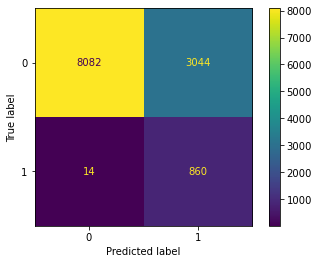

In [13]:
# Generate the model performance 
final_eval=model_performance_report(model_lgbm_2, 
                                    "LGBMClassifier on balanced training dataset with optimized hyper parameters",
                                    features_test, labels_test)  

# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LGBMClassifier(iter#2000)", final_eval[0] , final_eval[1], "balanced" , "auc", "Yes"])


Let's see if changing the number of iteration and see if it helps with model performance.

In [159]:
# Build the pipeline
model_lgbm_2 = LGBMClassifier()

# Fine tuning of LGBMClassifier
grid_params = {
    'classifier__learning_rate': sp_randFloat(), #[0.05],
    'classifier__num_leaves': sp_randInt(20, 80),
    'classifier__boosting_type' : ['gbdt', 'dart'],
    'classifier__objective' : ['binary'],
    'classifier__max_depth' : sp_randInt(4, 8), #[5,6,7,8],
    'classifier__random_state' : [random_seed], 
    'classifier__colsample_bytree' :sp_randFloat(), # [0.5,0.7],
    'classifier__subsample' : sp_randFloat(), #[0.5,0.7],
    'classifier__min_split_gain' : [0.01],
    'classifier__class_weight' : ['balanced'],
    'classifier__metric': ['auc', 'l1', 'l2', 'binary_logloss'],
    'classifier__is_unbalance' : [True],
    'classifier__metric': ['auc']
    }

# Perform hyper parameter tunning 
model_gbc_grid_param, score, _ = return_optimized_hyper_parameter(model_lgbm_2, preprocessor, grid_params, 
                                                               features_train_ovr, labels_train_ovr, 
                                                               cv=5, n_iter=1500)

Fitting 5 folds for each of 1500 candidates, totalling 7500 fits


In [29]:
#model_gbc_grid_param
obj_mdl_lgbm_opt_1_ = LGBMClassifier(learning_rate=model_gbc_grid_param['classifier__learning_rate'],
                                  num_leaves=model_gbc_grid_param['classifier__num_leaves'],
                                  boosting_type=model_gbc_grid_param['classifier__boosting_type'],
                                  objective=model_gbc_grid_param['classifier__objective'],
                                  max_depth=model_gbc_grid_param['classifier__max_depth'],
                                  random_state=model_gbc_grid_param['classifier__random_state'],
                                  colsample_bytree=model_gbc_grid_param['classifier__colsample_bytree'],
                                  subsample=model_gbc_grid_param['classifier__subsample'],
                                  min_split_gain=model_gbc_grid_param['classifier__min_split_gain'],
                                  class_weight=model_gbc_grid_param['classifier__class_weight'],
                                  metric=model_gbc_grid_param['classifier__metric'],
                                  is_unbalance=model_gbc_grid_param['classifier__is_unbalance']
                                 )

# Build pipeline 
model_lgbm_3= Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier',obj_mdl_lgbm_opt_1_)])
'''

model_lgbm = LGBMClassifier(boosting_type='dart', class_weight='balanced',
                                colsample_bytree=0.7028129204880681,
                                is_unbalance=True,
                                learning_rate=0.2744506850872477, max_depth=7,
                                metric='auc', min_split_gain=0.01,
                                num_leaves=21, objective='binary',
                                random_state=1212,
                                subsample=0.6125624927574134)

model_lgbm_3 = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier',model_lgbm)
                              ])'''
# Fit the model
model_lgbm_3.fit(features_train, labels_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'balance', 'duration',
                                                   'campaign']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'day', 'month'])])),
                ('classifier',
                 LGBMClassi

-------------------------------------------------------------

Performance metrics for  LGBMClassifier on balanced training dataset with optimized hyper parameters :

-------------------------------------------------------------

Model Accuracy :
model score: 0.763
-------------------------------------------------------------

ROC AUC score: 0.865
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.75      0.85     11126
           1       0.23      0.99      0.38       874

    accuracy                           0.76     12000
   macro avg       0.62      0.87      0.62     12000
weighted avg       0.94      0.76      0.82     12000

-------------------------------------------------------------

Confusion Matrix  :


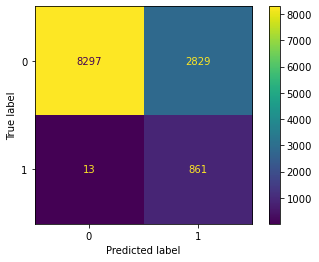

In [28]:
# Generate the model performance 
final_eval=model_performance_report(model_lgbm_3, 
                                    "LGBMClassifier on balanced training dataset with optimized hyper parameters",
                                    features_test, labels_test)  


# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LGBMClassifier(iter#1500)", final_eval[0] , final_eval[1], "balanced" , "auc", "Yes"])


The model performance seems to have improved, the model has become better at predicting the positive label as well. There are only 13 labels for positive class which were miscalssified.

After parameter optimisation looks like auc score has increased. Let's try to experiment with ensemble methods to see if it helps with the model optimization.<br>

## Ensemble Methods

**Step 13. Using LGBMClassifier() as base classifier, lets see if stacking ensemble technique improves the performance.**<br>

####  Stacking 
<br>
Let's use the top 4 models returned by the PyCaret and try to use the topmost model (based on RocAuc score) as a meta classifier and rest as layer 1 for stacking. So, we will be using SVM - Linear Kernel, Logistic Regression and Linear Discriminant Analysis Classifier as the layer 1 classifier. Model Light Gradient Boosting Machine will be used as meta model.<br>

    i. Let's find the optimised parameters for Gradient Boosting Classifier, and Random Forest classifier using RandomizedSearchCV method( We already have Logistic Regression model instance). 
    
<br>

**i. SVM - Linear Kernel Classifier parameter optimization**

In [39]:
# Fine tuning of SVM - Linear Kernel classifier 
grid_param_svm = {
    'classifier__kernel':['linear'],
    #'classifier__tol': sp_randFloat(1e-4,1e-3),
    'classifier__C': [0.1, 1, 10, 100, 1000],
    'classifier__class_weight': ['balanced'],
    'classifier__random_state':[random_seed],
    'classifier__verbose':[40],
    'classifier__max_iter':[600000],
    }

# Perform hyper parameter tunning for LinearSVC
grid_param_svm_param, score, Svm_model = return_optimized_hyper_parameter(SVC(), preprocessor,
                                                               grid_param_svm, features_train,
                                                               labels_train, cv=5, n_iter=5, verbose=60)
                                                               
# Print the grid parameter
print(grid_param_svm_param)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
...........................................
.*......*......*
optimization finished, #iter = 22031
.obj = -774.431470, rho = -0.626719
nSV = 7905, nBSV = 7059
Total nSV = 7905
.
*...*..*
optimization finished, #iter = 17883
*....obj = -783.289318, rho = -0.571663
nSV = 7991, nBSV = 7168
Total nSV = 7991
.*.*
optimization finished, #iter = 18127
obj = -770.753365, rho = -0.603439
nSV = 7865, nBSV = 7129
Total nSV = 7865
...*..*.......*.*
optimization finished, #iter = 23497
obj = -775.926505, rho = -0.621077
nSV = 7906, nBSV = 7204
Total nSV = 7906
........................................................*.....*..*
optimization finished, #iter = 18605
obj = -771.799760, rho = -0.492837
nSV = 7876, nBSV = 6991
Total nSV = 7876
...............................................................................*...................*..................................*...........................................*......................*.....

/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


...............WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -76510.010352, rho = -0.533547
nSV = 7895, nBSV = 7063
Total nSV = 7895


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................*.......................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
.obj = -75883.205754, rho = -0.539465
nSV = 7574, nBSV = 7038
Total nSV = 7574


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.....................................................................................................................................................................................................................................................................................................................................................................................*.....................................*.......................................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -75631.852484, rho = -0.635677
nSV = 7713, nBSV = 7050
Total nSV = 7713


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................*.....................................*.......................................................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -75203.071510, rho = -0.533746
nSV = 7673, nBSV = 7078
Total nSV = 7673


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


....................................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -682674.025927, rho = -0.887323
nSV = 14659, nBSV = 3562
Total nSV = 14659


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


......................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -713106.852321, rho = -0.664134
nSV = 14291, nBSV = 3606
Total nSV = 14291


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


...................................................................................................................................................................................................................................................................................................................................................................................................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -709463.280009, rho = -0.657848
nSV = 14311, nBSV = 3561
Total nSV = 14311


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.....................................................................................................................................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
.obj = -609462.588874, rho = -1.388384
nSV = 15536, nBSV = 77
Total nSV = 15536
.

/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
.obj = -654060.848455, rho = -1.403844
nSV = 15602, nBSV = 64
Total nSV = 15602
.

/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.............................................................................................................................................................................................................................................................................................................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -595246.722827, rho = -1.255932
nSV = 15666, nBSV = 78
Total nSV = 15666


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[CV 1/5; 1/5] START classifier__C=0.1, classifier__class_weight=balanced, classifier__kernel=linear, classifier__max_iter=600000, classifier__random_state=1212, classifier__verbose=40
[LibSVM][CV 1/5; 1/5] END classifier__C=0.1, classifier__class_weight=balanced, classifier__kernel=linear, classifier__max_iter=600000, classifier__random_state=1212, classifier__verbose=40;, score=0.938 total time=  45.3s
[CV 2/5; 2/5] START classifier__C=1, classifier__class_weight=balanced, classifier__kernel=linear, classifier__max_iter=6000

/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.............................................WARN: libsvm Solver reached max_iter
optimization finished, #iter = 600000
obj = -694962.214298, rho = -1.203297
nSV = 15666, nBSV = 63
Total nSV = 15666


/Users/jot/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=600000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]..................
*.
*..........*.*
optimization finished, #iter = 29202
obj = -969.598426, rho = -0.592913
nSV = 9856, nBSV = 8992
Total nSV = 9856
{'classifier__verbose': 40, 'classifier__random_state': 1212, 'classifier__max_iter': 600000, 'classifier__kernel': 'linear', 'classifier__class_weight': 'balanced', 'classifier__C': 0.1}


-------------------------------------------------------------

Performance metrics for  SVC Classifier on balanced training datasetwith optimized hyper parameters :

-------------------------------------------------------------

Model Accuracy :
model score: 0.856
-------------------------------------------------------------

ROC AUC score: 0.870
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       0.99      0.85      0.92     11126
           1       0.32      0.89      0.47       874

    accuracy                           0.86     12000
   macro avg       0.66      0.87      0.70     12000
weighted avg       0.94      0.86      0.88     12000

-------------------------------------------------------------

Confusion Matrix  :


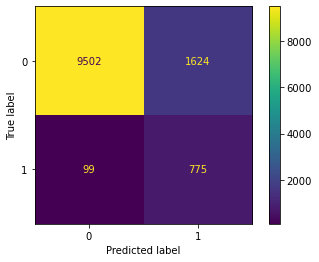

In [24]:
'''grid_param_svm_param={'classifier__verbose': 40, 'classifier__random_state': 1212, 'classifier__max_iter': 600000, 
 'classifier__kernel': 'linear', 'classifier__class_weight': 'balanced', 'classifier__C': 0.1}
'''
# Define model with optimized parameters
obj_mdl_svm_opt = SVC(kernel=grid_param_svm_param['classifier__kernel'],
                      C= grid_param_svm_param['classifier__C'],
                      class_weight= grid_param_svm_param['classifier__class_weight'],
                      random_state= grid_param_svm_param['classifier__random_state']
                      )
# Declare the pipeline
model_svm = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier',obj_mdl_svm_opt)])

# Perform fit operation on model
model_svm.fit(features_train, labels_train)

# Generate the model performance 
final_eval=model_performance_report(model_svm, 
                                     "SVC Classifier on balanced training datasetwith optimized hyper parameters",
                                     features_test, labels_test) 


# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "SVC Linear Kernel", final_eval[0] , final_eval[1], "balanced" , "none", "Yes"])

**ii. LogisticRegressionCV parameter optimization**

In [19]:
# Fine tuning of LogisticRegressionCV Classifier
grid_param_lrcv = {
    'classifier__scoring': ['roc_auc'], 
    'classifier__Cs': sp_randInt(5,100),
    'classifier__penalty': ['l1', 'l2', 'elasticnet'],
    'classifier__solver': ['newton-cg', 'lbfgs', 'liblinear'],
    'classifier__class_weight': ['balanced'],
    'classifier__n_jobs': [2], 
    'classifier__random_state':[random_seed],
     'classifier__max_iter':[100000]
    }

# Perform hyper parameter tunning for LogisticRegressionCV
grid_param_lrcv_param, score, lrcv_model = return_optimized_hyper_parameter(LogisticRegressionCV(cv=5), 
                                                                            preprocessor, grid_param_lrcv, 
                                                                            features_train, labels_train, 
                                                                            cv=5, n_iter=15, verbose=60) 

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV 3/5; 1/15] START classifier__Cs=83, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=l2, classifier__random_state=1212, classifier__scoring=roc_auc, classifier__solver=newton-cg
[CV 3/5; 1/15] END classifier__Cs=83, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=l2, classifier__random_state=1212, classifier__scoring=roc_auc, classifier__solver=newton-cg;, score=0.929 total time= 1.9min
[CV 1/5; 2/15] START classifier__Cs=31, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=l2, classifier__random_state=1212, classifier__scoring=roc_auc, classifier__solver=lbfgs
[CV 1/5; 2/15] END classifier__Cs=31, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=l2, classifier__random_state=1212, classifier__scor

[CV 2/5; 3/15] END classifier__Cs=98, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=elasticnet, classifier__random_state=1212, classifier__scoring=roc_auc, classifier__solver=newton-cg;, score=nan total time=   0.1s
[CV 3/5; 3/15] START classifier__Cs=98, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=elasticnet, classifier__random_state=1212, classifier__scoring=roc_auc, classifier__solver=newton-cg
[CV 3/5; 3/15] END classifier__Cs=98, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=elasticnet, classifier__random_state=1212, classifier__scoring=roc_auc, classifier__solver=newton-cg;, score=nan total time=   0.2s
[CV 4/5; 3/15] START classifier__Cs=98, classifier__class_weight=balanced, classifier__max_iter=100000, classifier__n_jobs=2, classifier__penalty=elasticnet, classifier__random_state=1212, classifier__

In [20]:
# Define model with optimized parameters
obj_mdl_lrcv_opt = LogisticRegressionCV(scoring=grid_param_lrcv_param['classifier__scoring'],
                                             Cs= grid_param_lrcv_param['classifier__Cs'],
                                             penalty= grid_param_lrcv_param['classifier__penalty'],
                                             solver=grid_param_lrcv_param['classifier__solver'],
                                             class_weight=grid_param_lrcv_param['classifier__class_weight'],
                                             n_jobs=grid_param_lrcv_param['classifier__n_jobs'],
                                             random_state=grid_param_lrcv_param['classifier__random_state'],
                                             max_iter=grid_param_lrcv_param['classifier__max_iter'],
                                            cv=5
                                            )

# Build the pipeline metrics.average_precision_score
pip_lrcv = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', obj_mdl_lrcv_opt
                      )
                     ])

-------------------------------------------------------------

Performance metrics for  GradientBoostingClassifier on balanced training dataset with optimized hyper parameters :

-------------------------------------------------------------

Model Accuracy :
model score: 0.937
-------------------------------------------------------------

ROC AUC score: 0.867
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       0.99      0.87      0.93     11126
           1       0.34      0.86      0.49       874

    accuracy                           0.87     12000
   macro avg       0.67      0.87      0.71     12000
weighted avg       0.94      0.87      0.89     12000

-------------------------------------------------------------

Confusion Matrix  :


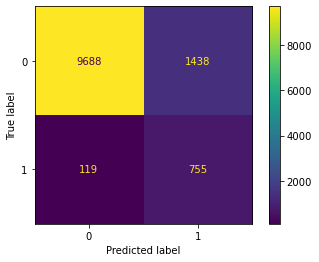

In [21]:

# Perform fit operation on model
pip_lrcv.fit(features_train, labels_train)

# Generate the model performance 
final_eval=model_performance_report(pip_lrcv, 
                         "LogisticRegressionCV",
                         features_test, labels_test) 

# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LogisticRegressionCV", final_eval[0] , final_eval[1], "balanced" , "roc_auc", "Yes"])

**_Let's implement stacking process._** 

<br> Utilising the top models recommended by PyCaret and our best performing model till now, lets build a atacking calssifier. The stacking classifier will be using LogisticRegressionCV and SVC linear kernel model as stacking estimators. Our best performing model LGBMClassifier will be used as final estimator.

In [50]:
# Define stacking estimator functions
stacking_estimators=[  
                       ('logistic_reg', Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', obj_mdl_lrcv_opt)])
                       ),
                       ('SVC_model' , Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', obj_mdl_svm_opt)])
                        ),
                      
                     ]


# Built pipeline for final estimator
model_lgbm_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', model_lgbm)])

# Define the stacking classifier
stck_classifier = StackingClassifier(estimators=stacking_estimators,
                                     final_estimator=model_lgbm
                                    ) 

# Train the classifier 
stck_classifier.fit(features_train, labels_train)

StackingClassifier(estimators=[('logistic_reg',
                                Pipeline(steps=[('preprocessor',
                                                 ColumnTransformer(transformers=[('num',
                                                                                  Pipeline(steps=[('scaler',
                                                                                                   StandardScaler())]),
                                                                                  ['age',
                                                                                   'balance',
                                                                                   'duration',
                                                                                   'campaign']),
                                                                                 ('cat',
                                                                                  Pipeline(steps=[('oneh

-------------------------------------------------------------

Performance metrics for  Stacking classifier on balanced dataset :

-------------------------------------------------------------

Model Accuracy :
model score: 0.678
-------------------------------------------------------------

ROC AUC score: 0.813
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.65      0.79     11126
           1       0.18      0.97      0.31       874

    accuracy                           0.68     12000
   macro avg       0.59      0.81      0.55     12000
weighted avg       0.94      0.68      0.75     12000

-------------------------------------------------------------

Confusion Matrix  :


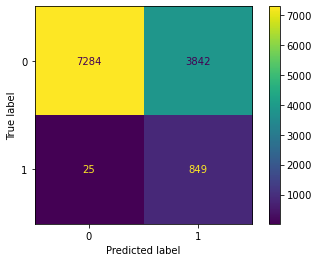

In [51]:
# Generate the model performance 
final_eval=model_performance_report(stck_classifier, "Stacking classifier on balanced dataset",
                                     features_test, labels_test) 

# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "StackingClassifier", final_eval[0] , final_eval[1], "--" , "--", "No"])

Even thought the model improved the classification rate for positive but the classification rate for negative class has declined.

**Step 14. Let's implement boosting ensemble technique using xgboost classifier.**<br>

####  Boosting using xgboost

Let's try to implement boosting ensemble technique and let's see if it helps in improving in performance and auc score.

In [69]:
# Define pipeline for XGBClassifier
xgb_mdl= Pipeline(steps=[('preprocessor', preprocessor),
                ('classifier', XGBClassifier())
               ])

# Define hyper parameter dictionary object
grid_param_xgb = {
    'classifier__eta':  sp_randFloat(),
    'classifier__max_depth': sp_randInt(4, 10),
    'classifier__max_delta_step': sp_randInt(1, 10),
    'classifier__tree_method': ['auto', 'exact', 'approx', 'hist', 'gpu_hist'],
    'classifier__random_state':[random_seed],
    'classifier__eval_metric': ['aucpr'],
    'classifier__objective':['binary:logitraw']
    }


# Tune the hyper parameters for XGBClassifier
mdl_xgb_grid_param, mdl_xgb_score, mdl_xgb = return_optimized_hyper_parameter(XGBClassifier(use_label_encoder =False),  
                                                                              preprocessor, 
                                                               grid_param_xgb, features_train,
                                                               labels_train,cv=5, n_iter=500)

# Print the grid paramter 
mdl_xgb_grid_param

Fitting 5 folds for each of 500 candidates, totalling 2500 fits
[CV 1/5] END classifier__eta=0.17992279359474184, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.2s
[CV 2/5] END classifier__eta=0.5222234267887806, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.933 total time=   0.8s
[CV 5/5] END classifier__eta=0.5222234267887806, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.941 total time=   2.3s
[CV 4/5] END classifier__eta=0.6990320488127992, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=

[CV 3/5] END classifier__eta=0.17992279359474184, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.2s
[CV 1/5] END classifier__eta=0.5222234267887806, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.944 total time=   0.8s
[CV 1/5] END classifier__eta=0.6990320488127992, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.927 total time=   5.6s
[CV 5/5] END classifier__eta=0.6990320488127992, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_st

[CV 2/5] END classifier__eta=0.17992279359474184, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.2s
[CV 3/5] END classifier__eta=0.5222234267887806, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.935 total time=   0.8s
[CV 2/5] END classifier__eta=0.6990320488127992, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.922 total time=   5.6s
[CV 1/5] END classifier__eta=0.04578017213623087, classifier__eval_metric=aucpr, classifier__max_delta_step=4, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_s

[CV 4/5] END classifier__eta=0.17992279359474184, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.2s
[CV 5/5] END classifier__eta=0.17992279359474184, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.1s
[CV 4/5] END classifier__eta=0.5222234267887806, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.936 total time=   0.8s
[CV 3/5] END classifier__eta=0.6990320488127992, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_

[CV 4/5] END classifier__eta=0.7605310916037648, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=approx;, score=0.923 total time=   7.5s
[CV 4/5] END classifier__eta=0.2691551496049248, classifier__eval_metric=aucpr, classifier__max_delta_step=7, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.943 total time=   3.3s
[CV 5/5] END classifier__eta=0.9158761159905783, classifier__eval_metric=aucpr, classifier__max_delta_step=3, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.2s
[CV 3/5] END classifier__eta=0.26204308109769325, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_

[CV 3/5] END classifier__eta=0.4423769992592256, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.935 total time=   1.3s
[CV 2/5] END classifier__eta=0.8841322971448943, classifier__eval_metric=aucpr, classifier__max_delta_step=4, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.918 total time=   5.2s
[CV 1/5] END classifier__eta=0.3196424095022773, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.1s
[CV 2/5] END classifier__eta=0.3196424095022773, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_stat

[CV 3/5] END classifier__eta=0.5625326201776316, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.927 total time=   4.9s
[CV 5/5] END classifier__eta=0.5625326201776316, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.935 total time=   2.8s
[CV 4/5] END classifier__eta=0.2959791438471502, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.937 total time=   2.5s
[CV 3/5] END classifier__eta=0.10055550573007721, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state

[CV 1/5] END classifier__eta=0.0499184894675927, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.947 total time=   7.0s
[CV 5/5] END classifier__eta=0.0499184894675927, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.943 total time=   9.8s
[CV 2/5] END classifier__eta=0.2959791438471502, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.934 total time=   2.7s
[CV 1/5] END classifier__eta=0.8081084691188468, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_stat

[CV 1/5] END classifier__eta=0.9703954881809655, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.923 total time=  18.8s
[CV 4/5] END classifier__eta=0.9703954881809655, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.921 total time=  16.6s
[CV 3/5] END classifier__eta=0.050851005123907056, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.939 total time=   3.7s
[CV 2/5] END classifier__eta=0.644711776471432, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state

{'classifier__eta': 0.1206337662605248,
 'classifier__eval_metric': 'aucpr',
 'classifier__max_delta_step': 6,
 'classifier__max_depth': 5,
 'classifier__objective': 'binary:logitraw',
 'classifier__random_state': 1212,
 'classifier__tree_method': 'hist'}

In [75]:
# Define model with optimized parameters
obj_mdl_xgbcls_opt = XGBClassifier(eta=mdl_xgb_grid_param['classifier__eta'],
                                        eval_metric= mdl_xgb_grid_param['classifier__eval_metric'],
                                        max_delta_step= mdl_xgb_grid_param['classifier__max_delta_step'],
                                        max_depth=mdl_xgb_grid_param['classifier__max_depth'],
                                        objective=mdl_xgb_grid_param['classifier__objective'],
                                        random_state=mdl_xgb_grid_param['classifier__random_state'],
                                        tree_method=mdl_xgb_grid_param['classifier__tree_method']
                                        )

# Build the pipeline metrics.average_precision_score
pip_xgbcls = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', obj_mdl_xgbcls_opt
                      )
                     ])


-------------------------------------------------------------

Performance metrics for  XGBoost Classifier with optimized hyper parameters :

-------------------------------------------------------------

Model Accuracy :
model score: 0.955
-------------------------------------------------------------

ROC AUC score: 0.705
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       0.96      1.00      0.98     11126
           1       0.93      0.41      0.57       874

    accuracy                           0.95     12000
   macro avg       0.94      0.71      0.77     12000
weighted avg       0.95      0.95      0.95     12000

-------------------------------------------------------------

Confusion Matrix  :


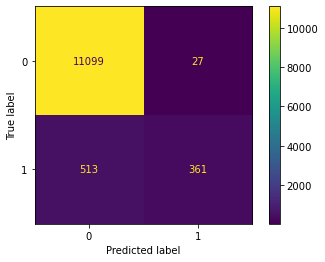

In [76]:
# Perform fit operation on model
pip_xgbcls.fit(features_test, labels_test)

# Generate the model performance 
final_eval=model_performance_report(pip_xgbcls, 
                         "XGBoost Classifier with optimized hyper parameters",
                         features_test, labels_test) 

# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "XGBClassifier", final_eval[0] , final_eval[1], "--" , "aucpr", "Yes"])


The model seems to have started performing worst. The classification rate for negative labels have improved significantly but for positive labels have worsened. 

**Step 15. Let's implement feature engineering for best performing models .**<br>

#### i. Remove features

Let's try removing feature creating too much noise in the training process 'day' and 'month', and then re train the model and see if performance becomes any better.

In [313]:
# Drop columns ['day', 'month'] from training feature set 
features_train_n = features_train.drop(axis=1, columns=['day', 'month'])
# Drop columns ['day', 'month'] from testing feature set 
features_test_n= features_test.drop(axis=1, columns=['day', 'month'])

In [83]:
# Set the new categorical feature column names - remove columns ['day', 'month']  
categorical_features_n = ['job', 'marital', 'education', 'default',\
                        'housing', 'loan', 'contact' ] 

# Re-define the CoulmnTransformer 
preprocessor_n = ColumnTransformer(transformers=[('num', numeric_transformer, numeric_features),
                                               ('cat', categorical_transformer, categorical_features_n)])

Let's try boosting and see if this helps 

In [85]:
# Define pipeline for XGBClassifier
xgb_mdl= Pipeline(steps=[('preprocessor', preprocessor_n),
                ('classifier', XGBClassifier())
               ])


# Let's optimize the hyper parameters                 
mdl_xgb_grid_param_n, mdl_xgb_score_n, mdl_xgb_n = return_optimized_hyper_parameter(XGBClassifier(use_label_encoder =False),  
                                                                              preprocessor_n, 
                                                               grid_param_xgb, features_train_n,
                                                               labels_train,cv=5, n_iter=500)
# Print the best grid paramater 
mdl_xgb_grid_param

Fitting 5 folds for each of 500 candidates, totalling 2500 fits
[CV 2/5] END classifier__eta=0.20485335149175454, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=nan total time=   0.0s
[CV 3/5] END classifier__eta=0.20485335149175454, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=nan total time=   0.0s
[CV 4/5] END classifier__eta=0.20485335149175454, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=nan total time=   0.0s
[CV 5/5] END classifier__eta=0.20485335149175454, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=5,

[CV 2/5] END classifier__eta=0.4767652721906087, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=nan total time=   0.0s
[CV 3/5] END classifier__eta=0.4767652721906087, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=nan total time=   0.0s
[CV 4/5] END classifier__eta=0.4767652721906087, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=nan total time=   0.0s
[CV 5/5] END classifier__eta=0.4767652721906087, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, 

[CV 4/5] END classifier__eta=0.19003469044209154, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=nan total time=   0.0s
[CV 5/5] END classifier__eta=0.19003469044209154, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=nan total time=   0.0s
[CV 1/5] END classifier__eta=0.011510515499575491, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=nan total time=   0.0s
[CV 2/5] END classifier__eta=0.011510515499575491, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=

[CV 3/5] END classifier__eta=0.6823052553966884, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=nan total time=   0.0s
[CV 4/5] END classifier__eta=0.6823052553966884, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=nan total time=   0.0s
[CV 5/5] END classifier__eta=0.6823052553966884, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=nan total time=   0.0s
[CV 1/5] END classifier__eta=0.024105155858889504, classifier__eval_metric=aucpr, classifier__max_delta_step=7, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212

[CV 4/5] END classifier__eta=0.8490786810600204, classifier__eval_metric=aucpr, classifier__max_delta_step=7, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.871 total time=  10.5s
[CV 3/5] END classifier__eta=0.9766316925896089, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.878 total time=  11.9s
[CV 2/5] END classifier__eta=0.6695766112020364, classifier__eval_metric=aucpr, classifier__max_delta_step=4, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.873 total time=  10.9s
[CV 1/5] END classifier__eta=0.7301816358442227, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state

[CV 5/5] END classifier__eta=0.22465669365881236, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.902 total time=  10.3s
[CV 4/5] END classifier__eta=0.09522363841230375, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.901 total time=  26.6s
[CV 3/5] END classifier__eta=0.36589326717102233, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=approx;, score=0.887 total time=  22.9s
[CV 2/5] END classifier__eta=0.3502027675924857, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random

[CV 2/5] END classifier__eta=0.9766316925896089, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.866 total time=  11.7s
[CV 1/5] END classifier__eta=0.6695766112020364, classifier__eval_metric=aucpr, classifier__max_delta_step=4, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.883 total time=  11.4s
[CV 5/5] END classifier__eta=0.6695766112020364, classifier__eval_metric=aucpr, classifier__max_delta_step=4, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.879 total time=   8.8s
[CV 5/5] END classifier__eta=0.7301816358442227, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=

[CV 4/5] END classifier__eta=0.7139873042528742, classifier__eval_metric=aucpr, classifier__max_delta_step=3, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.881 total time=   2.3s
[CV 2/5] END classifier__eta=0.7829903317278265, classifier__eval_metric=aucpr, classifier__max_delta_step=3, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=approx;, score=0.866 total time=  15.5s
[CV 1/5] END classifier__eta=0.01347461637891434, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.908 total time=  14.1s
[CV 4/5] END classifier__eta=0.01347461637891434, classifier__eval_metric=aucpr, classifier__max_delta_step=2, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_s

[CV 1/5] END classifier__eta=0.5285810299012241, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=approx;, score=0.889 total time=  14.6s
[CV 5/5] END classifier__eta=0.5285810299012241, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=approx;, score=0.881 total time=   8.6s
[CV 4/5] END classifier__eta=0.05188161284103454, classifier__eval_metric=aucpr, classifier__max_delta_step=1, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=approx;, score=0.904 total time=  12.9s
[CV 3/5] END classifier__eta=0.42394181634596284, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__rando

[CV 2/5] END classifier__eta=0.5957929510427419, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.873 total time=   8.9s
[CV 5/5] END classifier__eta=0.5957929510427419, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.883 total time=   5.9s
[CV 1/5] END classifier__eta=0.686264242138716, classifier__eval_metric=aucpr, classifier__max_delta_step=7, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.888 total time=   1.0s
[CV 5/5] END classifier__eta=0.686264242138716, classifier__eval_metric=aucpr, classifier__max_delta_step=7, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=12

[CV 4/5] END classifier__eta=0.20046150853550448, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.896 total time=  14.4s
[CV 4/5] END classifier__eta=0.989395365992447, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.872 total time=   9.0s
[CV 3/5] END classifier__eta=0.06976849270813945, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.910 total time=   7.5s
[CV 2/5] END classifier__eta=0.5726638533862928, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_stat

{'classifier__eta': 0.1206337662605248,
 'classifier__eval_metric': 'aucpr',
 'classifier__max_delta_step': 6,
 'classifier__max_depth': 5,
 'classifier__objective': 'binary:logitraw',
 'classifier__random_state': 1212,
 'classifier__tree_method': 'hist'}

[CV 5/5] END classifier__eta=0.26888392822667295, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.905 total time=   6.3s
[CV 4/5] END classifier__eta=0.7148610574033106, classifier__eval_metric=aucpr, classifier__max_delta_step=3, classifier__max_depth=9, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.873 total time=  14.8s
[CV 3/5] END classifier__eta=0.5430213142896996, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.893 total time=   6.1s
[CV 1/5] END classifier__eta=0.5039886188217723, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_state

[CV 5/5] END classifier__eta=0.18539855514042536, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=6, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=exact;, score=0.905 total time=   9.9s
[CV 4/5] END classifier__eta=0.14229903751553374, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=approx;, score=0.910 total time=   7.3s
[CV 3/5] END classifier__eta=0.8016686392227116, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=hist;, score=0.877 total time=   2.0s
[CV 2/5] END classifier__eta=0.05644273700664593, classifier__eval_metric=aucpr, classifier__max_delta_step=5, classifier__max_depth=8, classifier__objective=binary:logitraw, classifier__random_

[CV 1/5] END classifier__eta=0.21947400969958175, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.2s
[CV 2/5] END classifier__eta=0.21947400969958175, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.2s
[CV 3/5] END classifier__eta=0.21947400969958175, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=gpu_hist;, score=nan total time=   0.1s
[CV 4/5] END classifier__eta=0.21947400969958175, classifier__eval_metric=aucpr, classifier__max_delta_step=9, classifier__max_depth=4, classifier__objective=binary:logitraw, classifier__ran

[CV 2/5] END classifier__eta=0.0820521879082422, classifier__eval_metric=aucpr, classifier__max_delta_step=6, classifier__max_depth=5, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.899 total time=   9.1s
[CV 1/5] END classifier__eta=0.7128859504721096, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.880 total time=  11.7s
[CV 5/5] END classifier__eta=0.7128859504721096, classifier__eval_metric=aucpr, classifier__max_delta_step=8, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_state=1212, classifier__tree_method=auto;, score=0.878 total time=  10.9s
[CV 4/5] END classifier__eta=0.0382913403905738, classifier__eval_metric=aucpr, classifier__max_delta_step=7, classifier__max_depth=7, classifier__objective=binary:logitraw, classifier__random_state=

In [86]:
# Define model with optimized parameters
obj_mdl_xgbcls_opt_n = XGBClassifier(eta=mdl_xgb_grid_param_n['classifier__eta'],
                                        eval_metric= mdl_xgb_grid_param_n['classifier__eval_metric'],
                                        max_delta_step= mdl_xgb_grid_param_n['classifier__max_delta_step'],
                                        max_depth=mdl_xgb_grid_param_n['classifier__max_depth'],
                                        objective=mdl_xgb_grid_param_n['classifier__objective'],
                                        random_state=mdl_xgb_grid_param_n['classifier__random_state'],
                                        tree_method=mdl_xgb_grid_param_n['classifier__tree_method']
                                        )

# Build the pipeline metrics.average_precision_score
pip_xgbcls_n = Pipeline(steps=[('preprocessor', preprocessor_n),
                      ('classifier', obj_mdl_xgbcls_opt_n
                      )
                     ])


-------------------------------------------------------------

Performance metrics for  XGBoost classifier on balanced dataset :

-------------------------------------------------------------

Model Accuracy :
model score: 0.941
-------------------------------------------------------------

ROC AUC score: 0.612
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       0.94      1.00      0.97     11126
           1       0.84      0.23      0.36       874

    accuracy                           0.94     12000
   macro avg       0.89      0.61      0.66     12000
weighted avg       0.94      0.94      0.92     12000

-------------------------------------------------------------

Confusion Matrix  :


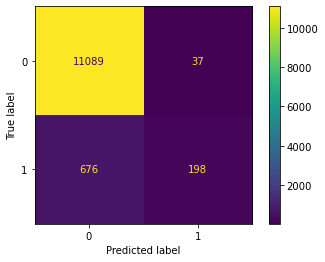

In [88]:
# Perform fit operation  
pip_xgbcls_n.fit(features_test_n, labels_test)

# Generate the model performance 
final_eval=model_performance_report(pip_xgbcls_n, "XGBoost classifier on balanced dataset",
                        features_test_n, labels_test)

# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "XGBClassifier(Features removed)", final_eval[0] , final_eval[1], "balanced" , "roc_auc", "Yes"])


Let's try if LGBMClassifier is able to perform better after removal of features. 

In [95]:
# Fine tuning of LGBMClassifier
grid_params_lgbm = {
    'classifier__learning_rate': sp_randFloat(), #[0.05],
    'classifier__num_leaves': sp_randInt(20, 80),
    'classifier__boosting_type' : ['gbdt', 'dart'],
    'classifier__objective' : ['binary'],
    'classifier__max_depth' : sp_randInt(4, 8), #[5,6,7,8],
    'classifier__random_state' : [random_seed], 
    'classifier__colsample_bytree' :sp_randFloat(), # [0.5,0.7],
    'classifier__subsample' : sp_randFloat(), #[0.5,0.7],
    'classifier__min_split_gain' : [0.01],
    'classifier__class_weight' : ['balanced'],
    'classifier__metric': ['auc', 'l1', 'l2', 'binary_logloss'],
    'classifier__is_unbalance' : [True],
    'classifier__metric': ['auc']
    }

# Perform hyper parameter tunning 
model_lgbm_grid_param, score, _ = return_optimized_hyper_parameter(LGBMClassifier(), preprocessor_n, grid_params_lgbm, 
                                                               features_train_n,labels_train, cv=5, n_iter=1500)

Fitting 5 folds for each of 1500 candidates, totalling 7500 fits
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8672601936471618, classifier__is_unbalance=True, classifier__learning_rate=0.4591069674401198, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7177014169303398;, score=nan total time=   0.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8672601936471618, classifier__is_unbalance=True, classifier__learning_rate=0.4591069674401198, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7177014169303398;, score=nan total time=   0.0s
[CV 4/5] END classifier__boosting_type=

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4805252894612768, classifier__is_unbalance=True, classifier__learning_rate=0.42668887893948004, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5321761193356965;, score=nan total time=   0.0s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4805252894612768, classifier__is_unbalance=True, classifier__learning_rate=0.42668887893948004, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5321761193356965;, score=nan total time=   0.0s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.09939501099942716, classifier__is_unbalance=True, classifier__learning_rate=0.27278645573157567, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6721627005333287;, score=nan total time=   0.0s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.09939501099942716, classifier__is_unbalance=True, classifier__learning_rate=0.27278645573157567, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6721627005333287;, score=nan total time=   0.0s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.09884196278484803, classifier__is_unbalance=True, classifier__learning_rate=0.7228938292206538, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5397897955022497;, score=0.865 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.09884196278484803, classifier__is_unbalance=True, classifier__learning_rate=0.7228938292206538, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5397897955022497;, score=0.866 total time=   0.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5165989807120481, classifier__is_unbalance=True, classifier__learning_rate=0.8764209148754413, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2895314150407028;, score=0.841 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5928856588831011, classifier__is_unbalance=True, classifier__learning_rate=0.6792756345493112, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6432749165674186;, score=0.877 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.35727467845029093, classifier__is_unbalance=True, classifier__learning_rate=0.6562993908250065, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8357798526643802;, score=0.880 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9431033709382434, classifier__is_unbalance=True, classifier__learning_rate=0.3739093352676467, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5663184309882061;, score=0.895 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9476008615358495, classifier__is_unbalance=True, classifier__learning_rate=0.38680136967407297, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8866059736593677;, score=0.904 total time=   1.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5186729151057329, classifier__is_unbalance=True, classifier__learning_rate=0.9822235637948855, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.925502584230938;, score=0.884 total time=   1.4s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12344961310703317, classifier__is_unbalance=True, classifier__learning_rate=0.11569563265050697, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6845506749345746;, score=0.793 total time=   1.4s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9688614590505576, classifier__is_unbalance=True, classifier__learning_rate=0.10278005199252116, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9762856243346206;, score=0.905 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9089233226922381, classifier__is_unbalance=True, classifier__learning_rate=0.15783016502039615, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8270959213333012;, score=0.895 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9089233226922381, classifier__is_unbalance=True, classifier__learning_rate=0.15783016502039615, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8270959213333012;, score=0.905 total time=   0.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9958191194685296, classifier__is_unbalance=True, classifier__learning_rate=0.9370763500389983, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.49662362141616956;, score=0.881 total time=   1.3s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7836862879258037, classifier__is_unbalance=True, classifier__learning_rate=0.33865506276958945, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19524783336737395;, score=0.878 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8657968538691649, classifier__is_unbalance=True, classifier__learning_rate=0.5952986503328155, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7575639067870316;, score=0.894 total time=   1.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.49451417380679585, classifier__is_unbalance=True, classifier__learning_rate=0.39089651771240996, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7493055712517144;, score=0.888 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6813771270024923, classifier__is_unbalance=True, classifier__learning_rate=0.35671614053285416, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3457348774250425;, score=0.906 total time=   1.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6813771270024923, classifier__is_unbalance=True, classifier__learning_rate=0.35671614053285416, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3457348774250425;, score=0.902 total time=   1.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9421685361106286, classifier__is_unbalance=True, classifier__learning_rate=0.09373521046290667, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.47508225555842687;, score=0.903 total time=   2.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6531095341445814, classifier__is_unbalance=True, classifier__learning_rate=0.8408900038000905, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7324795700875799;, score=0.875 total time=   1.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6361929298392571, classifier__is_unbalance=True, classifier__learning_rate=0.9295493056507075, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.43779422137784996;, score=0.867 total time=   1.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8912500997721315, classifier__is_unbalance=True, classifier__learning_rate=0.07160782072599281, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.32162492761394856;, score=0.897 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7722514797348637, classifier__is_unbalance=True, classifier__learning_rate=0.8350974689681284, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8177526667686144;, score=0.869 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9896191994684868, classifier__is_unbalance=True, classifier__learning_rate=0.13213386419360895, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.917217467547406;, score=0.913 total time=   0.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6470688044544135, classifier__is_unbalance=True, classifier__learning_rate=0.6659715722866093, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6446684505429889;, score=0.856 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6470688044544135, classifier__is_unbalance=True, classifier__learning_rate=0.6659715722866093, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6446684505429889;, score=0.867 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9619616686297413, classifier__is_unbalance=True, classifier__learning_rate=0.4274053851259758, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5362948485905114;, score=0.898 total time=   1.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5870141456641896, classifier__is_unbalance=True, classifier__learning_rate=0.8724759465646046, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09852400707685427;, score=0.844 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8734753630820078, classifier__is_unbalance=True, classifier__learning_rate=0.5532158389653162, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5138124498501712;, score=0.861 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8734753630820078, classifier__is_unbalance=True, classifier__learning_rate=0.5532158389653162, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5138124498501712;, score=0.880 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.34692384264856446, classifier__is_unbalance=True, classifier__learning_rate=0.093712019915144, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.42828046005364306;, score=0.901 total time=   1.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.34692384264856446, classifier__is_unbalance=True, classifier__learning_rate=0.093712019915144, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.42828046005364306;, score=0.894 total time=   1.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2710147381462621, classifier__is_unbalance=True, classifier__learning_rate=0.42044453016052197, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4280321364064198;, score=0.890 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.33248435961883427, classifier__is_unbalance=True, classifier__learning_rate=0.2370464806379995, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9468608989995407;, score=0.889 total time=   1.2s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.989906887036197, classifier__is_unbalance=True, classifier__learning_rate=0.1455006300990097, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7179246966852241;, score=0.909 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.989906887036197, classifier__is_unbalance=True, classifier__learning_rate=0.1455006300990097, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7179246966852241;, score=0.906 total time=   1.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4550583868106347, classifier__is_unbalance=True, classifier__learning_rate=0.20033937426726756, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.02534212970303118;, score=0.890 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4550583868106347, classifier__is_unbalance=True, classifier__learning_rate=0.20033937426726756, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.02534212970303118;, score=0.895 total time=   1.0s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.02936330656833963, classifier__is_unbalance=True, classifier__learning_rate=0.5179334128407375, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7524245484698818;, score=0.868 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.49092073322387453, classifier__is_unbalance=True, classifier__learning_rate=0.8263386451201599, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5152830239754728;, score=0.840 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.561543573985602, classifier__is_unbalance=True, classifier__learning_rate=0.6099866426188866, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3587463942161505;, score=0.898 total time=   2.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.561543573985602, classifier__is_unbalance=True, classifier__learning_rate=0.6099866426188866, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3587463942161505;, score=0.892 total time=   1.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3586979024610969, classifier__is_unbalance=True, classifier__learning_rate=0.36289384317662, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9137715284756405;, score=0.904 total time=   1.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5738680595814923, classifier__is_unbalance=True, classifier__learning_rate=0.4246654308450376, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.706045883938664;, score=0.902 total time=   1.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_b

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3141583935504958, classifier__is_unbalance=True, classifier__learning_rate=0.046208569157143775, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1402132124572737;, score=0.900 total time=   1.2s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9010021230834886, classifier__is_unbalance=True, classifier__learning_rate=0.4108794577398066, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7141905026949126;, score=0.875 total time=   0.8s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.20537145688477432, classifier__is_unbalance=True, classifier__learning_rate=0.5343065601824448, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.029880698091684477;, score=0.889 total time=   2.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.20537145688477432, classifier__is_unbalance=True, classifier__learning_rate=0.5343065601824448, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.029880698091684477;, score=0.879 total time=   2.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__co

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5772169719246854, classifier__is_unbalance=True, classifier__learning_rate=0.29647844150497926, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20607911566015424;, score=0.897 total time=   0.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.20537145688477432, classifier__is_unbalance=True, classifier__learning_rate=0.5343065601824448, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.029880698091684477;, score=0.883 total time=   2.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__col

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7767655212119099, classifier__is_unbalance=True, classifier__learning_rate=0.7942902542839785, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8582347358300598;, score=0.879 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.09289818218703039, classifier__is_unbalance=True, classifier__learning_rate=0.3428941844533854, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5659188312665187;, score=0.905 total time=   0.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.16595071218284518, classifier__is_unbalance=True, classifier__learning_rate=0.25662312441159074, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4181082803212802;, score=0.889 total time=   1.1s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8104261010881472, classifier__is_unbalance=True, classifier__learning_rate=0.2767963714179389, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7095720781513909;, score=0.904 total time=   1.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.20326471835521742, classifier__is_unbalance=True, classifier__learning_rate=0.08626232102204401, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7412466268301496;, score=0.892 total time=   1.2s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7752703653501765, classifier__is_unbalance=True, classifier__learning_rate=0.977829993099563, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.163414748032353;, score=0.758 total time=   1.1s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6059030613072484, classifier__is_unbalance=True, classifier__learning_rate=0.8063418389352961, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4513449345438193;, score=0.856 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6059030613072484, classifier__is_unbalance=True, classifier__learning_rate=0.8063418389352961, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4513449345438193;, score=0.842 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.034700173103694554, classifier__is_unbalance=True, classifier__learning_rate=0.44672555875430275, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.32962230149031535;, score=0.886 total time=   0.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3760180754666269, classifier__is_unbalance=True, classifier__learning_rate=0.6382210056072534, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8621546158466056;, score=0.890 total time=   2.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2019854423130636, classifier__is_unbalance=True, classifier__learning_rate=0.43092737812903903, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.03311050559648021;, score=0.866 total time=   3.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.44846254724507384, classifier__is_unbalance=True, classifier__learning_rate=0.13925087382804135, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5405395474871159;, score=0.896 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13839644252005212, classifier__is_unbalance=True, classifier__learning_rate=0.30060997481901497, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5249217805759592;, score=0.836 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13839644252005212, classifier__is_unbalance=True, classifier__learning_rate=0.30060997481901497, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5249217805759592;, score=0.837 total time=   1.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6527740302108636, classifier__is_unbalance=True, classifier__learning_rate=0.15811912339529044, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5368319918125907;, score=0.898 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6527740302108636, classifier__is_unbalance=True, classifier__learning_rate=0.15811912339529044, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5368319918125907;, score=0.890 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.962325925599788, classifier__is_unbalance=True, classifier__learning_rate=0.3829326099463881, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8596627674546976;, score=0.892 total time=   2.0s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9814962750084733, classifier__is_unbalance=True, classifier__learning_rate=0.10958737903684179, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3613452153138431;, score=0.889 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1494089571492121, classifier__is_unbalance=True, classifier__learning_rate=0.02211904297156464, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6722469272492189;, score=0.860 total time=   0.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.27602371559469174, classifier__is_unbalance=True, classifier__learning_rate=0.02532431341404906, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37798628549158253;, score=0.875 total time=   1.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.35619116879066004, classifier__is_unbalance=True, classifier__learning_rate=0.6651795007584307, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15363822004258854;, score=0.894 total time=   1.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3707294840915032, classifier__is_unbalance=True, classifier__learning_rate=0.5574042657807738, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23268098861322872;, score=0.879 total time=   2.3s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.518383660026884, classifier__is_unbalance=True, classifier__learning_rate=0.6061765399976331, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7443502607576835;, score=0.892 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9749020793550623, classifier__is_unbalance=True, classifier__learning_rate=0.8753130168243606, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7517486384076411;, score=0.885 total time=   1.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2709998493788148, classifier__is_unbalance=True, classifier__learning_rate=0.8693635653392796, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8791121520861371;, score=0.841 total time=   1.0s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.35552381019326407, classifier__is_unbalance=True, classifier__learning_rate=0.36385745435990724, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.16693466471058604;, score=0.897 total time=   2.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1430833949415029, classifier__is_unbalance=True, classifier__learning_rate=0.5778772709816526, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.495365841408809;, score=0.877 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1430833949415029, classifier__is_unbalance=True, classifier__learning_rate=0.5778772709816526, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.495365841408809;, score=0.875 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7290942905259236, classifier__is_unbalance=True, classifier__learning_rate=0.49936321264403827, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8213769958475037;, score=0.889 total time=   2.2s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6775392888405631, classifier__is_unbalance=True, classifier__learning_rate=0.036462730807125476, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4531011274411021;, score=0.896 total time=   1.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9521395952580402, classifier__is_unbalance=True, classifier__learning_rate=0.966580102384701, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4036955182503005;, score=0.548 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9521395952580402, classifier__is_unbalance=True, classifier__learning_rate=0.966580102384701, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4036955182503005;, score=0.728 total time=   1.0s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6678547707692095, classifier__is_unbalance=True, classifier__learning_rate=0.5756865450752888, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3119820358108871;, score=0.884 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14713347111477193, classifier__is_unbalance=True, classifier__learning_rate=0.02130621056690374, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6116929057313137;, score=0.865 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7094969764209578, classifier__is_unbalance=True, classifier__learning_rate=0.949024799575048, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.22586644297915748;, score=0.885 total time=   1.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.07759001267908461, classifier__is_unbalance=True, classifier__learning_rate=0.9492341142191663, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6600111370442717;, score=0.889 total time=   0.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8730203450202276, classifier__is_unbalance=True, classifier__learning_rate=0.7998495363513283, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08745178451757485;, score=0.868 total time=   0.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.12579240754600696, classifier__is_unbalance=True, classifier__learning_rate=0.578206293858323, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8360929254891605;, score=0.862 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7833836165634006, classifier__is_unbalance=True, classifier__learning_rate=0.8636050444102392, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6144203559629039;, score=0.895 total time=   1.2s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8585078986429135, classifier__is_unbalance=True, classifier__learning_rate=0.10321041058769143, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.18126625856713885;, score=0.912 total time=   1.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6218818675973491, classifier__is_unbalance=True, classifier__learning_rate=0.7410000765911636, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.22911652311503805;, score=0.890 total time=   1.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2168318820869326, classifier__is_unbalance=True, classifier__learning_rate=0.9972742415416755, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.651844556472611;, score=0.846 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.48483532420759967, classifier__is_unbalance=True, classifier__learning_rate=0.040126877004787564, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7765099810117595;, score=0.897 total time=   1.3s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.38972687919098437, classifier__is_unbalance=True, classifier__learning_rate=0.9460923905142714, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09491298768174938;, score=0.874 total time=   1.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__col

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.780566879695267, classifier__is_unbalance=True, classifier__learning_rate=0.9448902970945635, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3636301560126788;, score=0.843 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6977293324939748, classifier__is_unbalance=True, classifier__learning_rate=0.4664159373302902, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.16119074993386284;, score=0.882 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5790856151841596, classifier__is_unbalance=True, classifier__learning_rate=0.15116393306327602, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12352511382903275;, score=0.906 total time=   0.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8516068167415765, classifier__is_unbalance=True, classifier__learning_rate=0.17417692736351698, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.28825807545014115;, score=0.903 total time=   1.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4349239088597999, classifier__is_unbalance=True, classifier__learning_rate=0.26481665227664575, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.705205997294184;, score=0.902 total time=   1.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9556056428604847, classifier__is_unbalance=True, classifier__learning_rate=0.9717497860210731, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08216898895565194;, score=0.838 total time=   0.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13146372802438744, classifier__is_unbalance=True, classifier__learning_rate=0.6727121519515694, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3883143022091289;, score=0.848 total time=   1.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.20928500167674569, classifier__is_unbalance=True, classifier__learning_rate=0.6389224130535951, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8476660600651515;, score=0.876 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4086864080298406, classifier__is_unbalance=True, classifier__learning_rate=0.11063810125661233, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12395500937659854;, score=0.897 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4086864080298406, classifier__is_unbalance=True, classifier__learning_rate=0.11063810125661233, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12395500937659854;, score=0.896 total time=   2.2s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8400396402007928, classifier__is_unbalance=True, classifier__learning_rate=0.36785820446024853, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8422516095621193;, score=0.891 total time=   1.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7683215535516613, classifier__is_unbalance=True, classifier__learning_rate=0.13733215434526092, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9407047056348382;, score=0.902 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7634347770435876, classifier__is_unbalance=True, classifier__learning_rate=0.6516739042477382, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9124876347211456;, score=0.882 total time=   1.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7634347770435876, classifier__is_unbalance=True, classifier__learning_rate=0.6516739042477382, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9124876347211456;, score=0.874 total time=   1.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.12304966970401643, classifier__is_unbalance=True, classifier__learning_rate=0.7234971196915946, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5075203339914871;, score=0.860 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.12304966970401643, classifier__is_unbalance=True, classifier__learning_rate=0.7234971196915946, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5075203339914871;, score=0.854 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.46203514350015507, classifier__is_unbalance=True, classifier__learning_rate=0.7977307307034652, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7356540348695821;, score=0.849 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4775883087026489, classifier__is_unbalance=True, classifier__learning_rate=0.20981796110822448, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23121881413184975;, score=0.904 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

In [96]:
model_lgbm_grid_param

{'classifier__boosting_type': 'gbdt',
 'classifier__class_weight': 'balanced',
 'classifier__colsample_bytree': 0.7051020577143562,
 'classifier__is_unbalance': True,
 'classifier__learning_rate': 0.07776056894907102,
 'classifier__max_depth': 4,
 'classifier__metric': 'auc',
 'classifier__min_split_gain': 0.01,
 'classifier__num_leaves': 68,
 'classifier__objective': 'binary',
 'classifier__random_state': 1212,
 'classifier__subsample': 0.4631968959075127}

-------------------------------------------------------------

Performance metrics for  LGBM classifier on balanced dataset :

-------------------------------------------------------------

Model Accuracy :
model score: 0.499
-------------------------------------------------------------

ROC AUC score: 0.726
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.46      0.63     11126
           1       0.13      0.99      0.22       874

    accuracy                           0.50     12000
   macro avg       0.56      0.73      0.43     12000
weighted avg       0.93      0.50      0.60     12000

-------------------------------------------------------------

Confusion Matrix  :


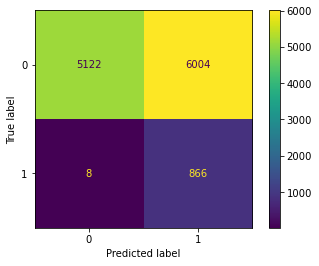

In [98]:
#model_gbc_grid_param
obj_mdl_lgbm_opt_1_n = LGBMClassifier(learning_rate=model_lgbm_grid_param['classifier__learning_rate'],
                                  num_leaves=model_lgbm_grid_param['classifier__num_leaves'],
                                  boosting_type=model_lgbm_grid_param['classifier__boosting_type'],
                                  objective=model_lgbm_grid_param['classifier__objective'],
                                  max_depth=model_lgbm_grid_param['classifier__max_depth'],
                                  random_state=model_lgbm_grid_param['classifier__random_state'],
                                  colsample_bytree=model_lgbm_grid_param['classifier__colsample_bytree'],
                                  subsample=model_lgbm_grid_param['classifier__subsample'],
                                  min_split_gain=model_lgbm_grid_param['classifier__min_split_gain'],
                                  class_weight=model_lgbm_grid_param['classifier__class_weight'],
                                  metric=model_lgbm_grid_param['classifier__metric'],
                                  is_unbalance=model_lgbm_grid_param['classifier__is_unbalance']
                                 )

# Build pipeline 
pip_model_lgbm_3_n= Pipeline(steps=[('preprocessor', preprocessor_n),
                                 ('classifier', obj_mdl_lgbm_opt_1_n)
                     ])

# Fit the model
pip_model_lgbm_3_n.fit(features_train, labels_train)

# Generate the model performance 
final_eval=model_performance_report(pip_model_lgbm_3_n, "LGBM classifier on balanced dataset",
                        features_test_n, labels_test)


# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LGBMClassifier(Features removed)", final_eval[0] , final_eval[1], "balanced" , "auc", "Yes"])

The model has become better at identifying positive labels and the accuracy has considerably declined. <br>

Let's try binning these features <br>

#### ii. Bin the features

Let's try converting these variables into categories and see if it helps with model performance. We can do that <br>
i. Dividing day into 'Week_first'(1-7),'Week_2'(8-14),'Week_3'(15-21), 'Week_last'(21-31) categories. <br>
ii. Divide year into quarters "Q1", "Q2", "Q3" and "Q4".<br>

In [394]:
# Add new_day column in Training Features - containing categories for day of the month
features_train['new_day']=pd.cut(features_train.day, bins=[0,7,14,21,31], 
                                 labels=['Week_first','Week_2','Week_3', 'Week_last'])
# Add new_day column in Test Features - containing categories for day of the month
features_test['new_day']=pd.cut(features_test.day, bins=[0,7,14,21,31], 
                                labels=['Week_first','Week_2','Week_3', 'Week_last'])

In [395]:
def return_month_quarter(monthName):
    # set the quarter name
    strQtrName=""
        
    if monthName in [ 'mar', 'feb', 'jan']:
        strQtrName ="Q1"
    elif  monthName in ['apr', 'may','jun']:
        strQtrName ="Q2"
    elif  monthName in ['jul', 'aug', 'sep']:
        strQtrName ="Q3"
    elif  monthName in ['oct', 'nov', 'dec']:
        strQtrName ="Q4"
    
    return strQtrName

# Add new_month column in Training Features - containing categories for month
features_train['new_month'] = [  return_month_quarter(month) for month in features_train.month ]
# Add new_month column in Test Features - containing categories for month
features_test['new_month'] = [  return_month_quarter(month) for month in features_test.month ]

In [396]:
# Set the categorical feature column names - Re-define the categorical features
categorical_features_2 = ['job', 'marital', 'education', 'default',\
                        'housing', 'loan', 'contact', 'new_day', 'new_month' ] 

# Define the ColumnTransformer
preprocessor_2 = ColumnTransformer(transformers=[('cat', categorical_transformer, categorical_features_2),
                                                 ('num', numeric_transformer, numeric_features)])

#remove the columns 
features_train_2 = features_train.drop(axis=1, columns=['day', 'month'])
features_test_2= features_test.drop(axis=1, columns=['day', 'month'])

In [319]:
# Fine tuning of LGBMClassifier
grid_params_lgbm = {
    'classifier__learning_rate': sp_randFloat(), #[0.05],
    'classifier__num_leaves': sp_randInt(20, 80),
    'classifier__boosting_type' : ['gbdt', 'dart'],
    'classifier__objective' : ['binary'],
    'classifier__max_depth' : sp_randInt(4, 8), #[5,6,7,8],
    'classifier__random_state' : [random_seed], 
    'classifier__colsample_bytree' :sp_randFloat(), # [0.5,0.7],
    'classifier__subsample' : sp_randFloat(), #[0.5,0.7],
    'classifier__min_split_gain' : [0.01],
    'classifier__class_weight' : ['balanced'],
    'classifier__metric': ['auc', 'l1', 'l2', 'binary_logloss'],
    'classifier__is_unbalance' : [True],
    'classifier__metric': ['auc']
    }

# Perform hyper parameter tunning 
model_lgbm_param_2, score, mdl_grid_cmp = return_optimized_hyper_parameter(LGBMClassifier(), preprocessor_2, grid_params_lgbm, 
                                                               features_train_2,labels_train, cv=5, n_iter=1500)

Fitting 5 folds for each of 1500 candidates, totalling 7500 fits
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.652 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.633 total time=   0.4s
[CV 4/5] END classifier__boos

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.640 total time=   0.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.869217625368181, classifier__is_unbalance=True, classifier__learning_rate=0.281465958012288, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.752380128410048;, score=0.925 total time=   2.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.024208462269980968, classifier__is_unbalance=True, classifier__learning_rate=0.11320938299957006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9416927339545298;, score=0.649 total time=   0.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.869217625368181, classifier__is_unbalance=True, classifier__learning_rate=0.281465958012288, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.752380128410048;, score=0.932 total time=   2.2s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7752108437741816, classifier__is_unbalance=True, classifier__learning_rate=0.07433056879513888, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0917381116706153;, score=0.932 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.31035471097124645, classifier__is_unbalance=True, classifier__learning_rate=0.1393396010067809, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5638970634680678;, score=0.927 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8167593276377842, classifier__is_unbalance=True, classifier__learning_rate=0.8673625794091255, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.055077756637325836;, score=0.798 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7752108437741816, classifier__is_unbalance=True, classifier__learning_rate=0.07433056879513888, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0917381116706153;, score=0.925 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.26979851695342383, classifier__is_unbalance=True, classifier__learning_rate=0.5654127988994546, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5347283649245319;, score=0.898 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4384529545852236, classifier__is_unbalance=True, classifier__learning_rate=0.9306539223092242, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4264669320690425;, score=0.888 total time=   1.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.26979851695342383, classifier__is_unbalance=True, classifier__learning_rate=0.5654127988994546, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5347283649245319;, score=0.901 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.26979851695342383, classifier__is_unbalance=True, classifier__learning_rate=0.5654127988994546, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5347283649245319;, score=0.902 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06423251043510703, classifier__is_unbalance=True, classifier__learning_rate=0.3186744021983806, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.45712716678574117;, score=0.905 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.857863113774601, classifier__is_unbalance=True, classifier__learning_rate=0.1505726789981805, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8286251631490634;, score=0.922 total time=   0.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06423251043510703, classifier__is_unbalance=True, classifier__learning_rate=0.3186744021983806, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.45712716678574117;, score=0.912 total time=   0.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.857863113774601, classifier__is_unbalance=True, classifier__learning_rate=0.1505726789981805, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8286251631490634;, score=0.917 total time=   0.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.0782896196866687, classifier__is_unbalance=True, classifier__learning_rate=0.37925980903414835, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9506898294340294;, score=0.908 total time=   1.1s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.17237175596165877, classifier__is_unbalance=True, classifier__learning_rate=0.7695853116091905, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.31051825814516043;, score=0.871 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6721107350390061, classifier__is_unbalance=True, classifier__learning_rate=0.8496636960147931, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.04069157073516472;, score=0.916 total time=   1.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.0782896196866687, classifier__is_unbalance=True, classifier__learning_rate=0.37925980903414835, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9506898294340294;, score=0.907 total time=   1.2s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9365362528387638, classifier__is_unbalance=True, classifier__learning_rate=0.45661439307470586, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6553924022224986;, score=0.911 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4538172631242908, classifier__is_unbalance=True, classifier__learning_rate=0.28733531766824094, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9412408633999985;, score=0.926 total time=   0.9s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4538172631242908, classifier__is_unbalance=True, classifier__learning_rate=0.28733531766824094, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9412408633999985;, score=0.926 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.06979352422460539, classifier__is_unbalance=True, classifier__learning_rate=0.552090924414751, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1336372765867907;, score=0.892 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.10298281892076155, classifier__is_unbalance=True, classifier__learning_rate=0.3873941985557453, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7237024267986485;, score=0.917 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5114701373798646, classifier__is_unbalance=True, classifier__learning_rate=0.7480005579438965, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6734807445765854;, score=0.884 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8931831945037342, classifier__is_unbalance=True, classifier__learning_rate=0.3135239611203364, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.975105221139713;, score=0.911 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5787776990717608, classifier__is_unbalance=True, classifier__learning_rate=0.41231388789326817, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.22115917230723736;, score=0.903 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5118322102383321, classifier__is_unbalance=True, classifier__learning_rate=0.24021810552913048, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05866269797171508;, score=0.928 total time=   1.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9205722465830266, classifier__is_unbalance=True, classifier__learning_rate=0.03714400190483613, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5182282712603115;, score=0.934 total time=   1.1s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.23260432702264477, classifier__is_unbalance=True, classifier__learning_rate=0.2550248265183166, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8181984353511028;, score=0.926 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.23260432702264477, classifier__is_unbalance=True, classifier__learning_rate=0.2550248265183166, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8181984353511028;, score=0.921 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.218957667206796, classifier__is_unbalance=True, classifier__learning_rate=0.4381592524201524, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4956870678714437;, score=0.919 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15787439368446576, classifier__is_unbalance=True, classifier__learning_rate=0.27158602854596914, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7532313841496486;, score=0.919 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.218957667206796, classifier__is_unbalance=True, classifier__learning_rate=0.4381592524201524, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4956870678714437;, score=0.919 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15787439368446576, classifier__is_unbalance=True, classifier__learning_rate=0.27158602854596914, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7532313841496486;, score=0.930 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5420294379264234, classifier__is_unbalance=True, classifier__learning_rate=0.3889562203097091, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8154284182275386;, score=0.927 total time=   1.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.24754236465282398, classifier__is_unbalance=True, classifier__learning_rate=0.9146821004583672, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9520665011273682;, score=0.875 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.034296578246626575, classifier__is_unbalance=True, classifier__learning_rate=0.44326931544565307, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1391853962185976;, score=0.632 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.034296578246626575, classifier__is_unbalance=True, classifier__learning_rate=0.44326931544565307, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1391853962185976;, score=0.617 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5130912160408121, classifier__is_unbalance=True, classifier__learning_rate=0.17938694153472656, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1130844218967576;, score=0.933 total time=   1.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5815432571069167, classifier__is_unbalance=True, classifier__learning_rate=0.7881637086699742, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7306323362853595;, score=0.902 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5815432571069167, classifier__is_unbalance=True, classifier__learning_rate=0.7881637086699742, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7306323362853595;, score=0.908 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5815432571069167, classifier__is_unbalance=True, classifier__learning_rate=0.7881637086699742, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7306323362853595;, score=0.912 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5709337390570581, classifier__is_unbalance=True, classifier__learning_rate=0.07997036036463767, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6848775936706344;, score=0.929 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5709337390570581, classifier__is_unbalance=True, classifier__learning_rate=0.07997036036463767, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6848775936706344;, score=0.923 total time=   1.4s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.414933371415225, classifier__is_unbalance=True, classifier__learning_rate=0.17228658920715, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6730957921633659;, score=0.922 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1237911642331595, classifier__is_unbalance=True, classifier__learning_rate=0.918443946581227, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1261130299697727;, score=0.916 total time=   1.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_by

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2461964889678495, classifier__is_unbalance=True, classifier__learning_rate=0.45953760490643003, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29803589447458645;, score=0.908 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.43658023633138465, classifier__is_unbalance=True, classifier__learning_rate=0.1427514072039382, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4648341223707929;, score=0.934 total time=   1.5s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2461964889678495, classifier__is_unbalance=True, classifier__learning_rate=0.45953760490643003, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29803589447458645;, score=0.911 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.43658023633138465, classifier__is_unbalance=True, classifier__learning_rate=0.1427514072039382, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4648341223707929;, score=0.929 total time=   1.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.14854212841770642, classifier__is_unbalance=True, classifier__learning_rate=0.9557446300089777, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.31204732629793996;, score=0.905 total time=   1.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6051323036178443, classifier__is_unbalance=True, classifier__learning_rate=0.9828769802080353, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07128673062377522;, score=0.743 total time=   2.1s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3451571646242496, classifier__is_unbalance=True, classifier__learning_rate=0.7417430708638519, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6622287125252607;, score=0.909 total time=   2.1s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8836112771092131, classifier__is_unbalance=True, classifier__learning_rate=0.6856663361543159, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9288332791067601;, score=0.910 total time=   2.0s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15856983081987797, classifier__is_unbalance=True, classifier__learning_rate=0.9777943224063554, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9594681146333178;, score=0.878 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15856983081987797, classifier__is_unbalance=True, classifier__learning_rate=0.9777943224063554, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9594681146333178;, score=0.871 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15856983081987797, classifier__is_unbalance=True, classifier__learning_rate=0.9777943224063554, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9594681146333178;, score=0.862 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.28241490039862893, classifier__is_unbalance=True, classifier__learning_rate=0.10020939587939859, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4956367583336829;, score=0.934 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8264038244016683, classifier__is_unbalance=True, classifier__learning_rate=0.515290285187154, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5789488849557395;, score=0.918 total time=   1.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6233247986371593, classifier__is_unbalance=True, classifier__learning_rate=0.9415725977592344, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.43890469849613734;, score=0.760 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6766378226195631, classifier__is_unbalance=True, classifier__learning_rate=0.967066047950813, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3311152295264528;, score=0.627 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9966690285401447, classifier__is_unbalance=True, classifier__learning_rate=0.5832068387244859, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5435529245673828;, score=0.929 total time=   1.3s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6454805064398222, classifier__is_unbalance=True, classifier__learning_rate=0.10042400563772691, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5284634811774781;, score=0.930 total time=   1.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6909764928056221, classifier__is_unbalance=True, classifier__learning_rate=0.9417439103613175, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6794042344282671;, score=0.760 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.10524523271424446, classifier__is_unbalance=True, classifier__learning_rate=0.33847334489466396, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9834831999653375;, score=0.914 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.10524523271424446, classifier__is_unbalance=True, classifier__learning_rate=0.33847334489466396, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9834831999653375;, score=0.912 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.07385381584340667, classifier__is_unbalance=True, classifier__learning_rate=0.3131664450513443, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8835337777343167;, score=0.912 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.07385381584340667, classifier__is_unbalance=True, classifier__learning_rate=0.3131664450513443, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8835337777343167;, score=0.906 total time=   0.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6712521682113285, classifier__is_unbalance=True, classifier__learning_rate=0.7567705608641954, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.468707912042836;, score=0.912 total time=   1.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4322032292125223, classifier__is_unbalance=True, classifier__learning_rate=0.8120588197256069, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9143111784792564;, score=0.900 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.07005700925293445, classifier__is_unbalance=True, classifier__learning_rate=0.8611382808042335, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8846824537002794;, score=0.893 total time=   1.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.19539192531528415, classifier__is_unbalance=True, classifier__learning_rate=0.9550496864179443, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12615206580301996;, score=0.896 total time=   1.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6712521682113285, classifier__is_unbalance=True, classifier__learning_rate=0.7567705608641954, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.468707912042836;, score=0.917 total time=   1.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8687233012003466, classifier__is_unbalance=True, classifier__learning_rate=0.04169650505621281, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.21662433125749547;, score=0.936 total time=   0.9s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9033840703865271, classifier__is_unbalance=True, classifier__learning_rate=0.6453737315206912, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2965378921525833;, score=0.894 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9033840703865271, classifier__is_unbalance=True, classifier__learning_rate=0.6453737315206912, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2965378921525833;, score=0.877 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8850814959761176, classifier__is_unbalance=True, classifier__learning_rate=0.6736619432313232, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2059744577853696;, score=0.928 total time=   1.4s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.42014914963980554, classifier__is_unbalance=True, classifier__learning_rate=0.7800834870799608, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8583008876147545;, score=0.893 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.42014914963980554, classifier__is_unbalance=True, classifier__learning_rate=0.7800834870799608, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8583008876147545;, score=0.909 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.42014914963980554, classifier__is_unbalance=True, classifier__learning_rate=0.7800834870799608, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8583008876147545;, score=0.894 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8696886188537956, classifier__is_unbalance=True, classifier__learning_rate=0.23983315955635898, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3371826370522014;, score=0.928 total time=   1.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6093734373680623, classifier__is_unbalance=True, classifier__learning_rate=0.9695925875367123, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.318434861339823;, score=0.889 total time=   2.2s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.16886214748565553, classifier__is_unbalance=True, classifier__learning_rate=0.1786474749778615, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2422762329298752;, score=0.926 total time=   0.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7045359441423733, classifier__is_unbalance=True, classifier__learning_rate=0.6845265176724331, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.0571275596911619;, score=0.905 total time=   2.0s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.662180759251916, classifier__is_unbalance=True, classifier__learning_rate=0.8192466692445467, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07094296155801694;, score=0.914 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.662180759251916, classifier__is_unbalance=True, classifier__learning_rate=0.8192466692445467, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07094296155801694;, score=0.907 total time=   2.2s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.943943595920578, classifier__is_unbalance=True, classifier__learning_rate=0.2856080740568129, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7947141774245917;, score=0.917 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.03782913610772454, classifier__is_unbalance=True, classifier__learning_rate=0.42231849362228013, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2769465237055846;, score=0.869 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4680035164449079, classifier__is_unbalance=True, classifier__learning_rate=0.6859544156108721, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.48339109664932167;, score=0.915 total time=   2.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7863188697328665, classifier__is_unbalance=True, classifier__learning_rate=0.8733065217956337, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5617429718005958;, score=0.892 total time=   2.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6735973266333433, classifier__is_unbalance=True, classifier__learning_rate=0.48196343500260963, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4173624243966345;, score=0.914 total time=   2.1s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5452003103796335, classifier__is_unbalance=True, classifier__learning_rate=0.017622019835974556, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5584589384682483;, score=0.923 total time=   0.9s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.23864868536755035, classifier__is_unbalance=True, classifier__learning_rate=0.7386101518467382, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.331970573008629;, score=0.909 total time=   1.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9690742093835019, classifier__is_unbalance=True, classifier__learning_rate=0.004544483404134159, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5312343016269048;, score=0.927 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6747096754078566, classifier__is_unbalance=True, classifier__learning_rate=0.9403719094682869, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9628771138732851;, score=0.861 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6747096754078566, classifier__is_unbalance=True, classifier__learning_rate=0.9403719094682869, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9628771138732851;, score=0.685 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.20882755746952664, classifier__is_unbalance=True, classifier__learning_rate=0.15856060411973838, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.44158391951469933;, score=0.930 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8018993626897234, classifier__is_unbalance=True, classifier__learning_rate=0.06382975639404609, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3107764293358548;, score=0.927 total time=   0.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7269749128684797, classifier__is_unbalance=True, classifier__learning_rate=0.8495054060185167, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6958828011677668;, score=0.912 total time=   1.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13076551817126203, classifier__is_unbalance=True, classifier__learning_rate=0.799192056499317, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7259665328064394;, score=0.916 total time=   1.3s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.17735378138739666, classifier__is_unbalance=True, classifier__learning_rate=0.6988606752838161, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.011623297063053983;, score=0.883 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.17735378138739666, classifier__is_unbalance=True, classifier__learning_rate=0.6988606752838161, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.011623297063053983;, score=0.880 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__co

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.49236171781203564, classifier__is_unbalance=True, classifier__learning_rate=0.6260816735341392, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.46039069426926627;, score=0.922 total time=   1.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08721212779668563, classifier__is_unbalance=True, classifier__learning_rate=0.7567704147896434, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.95119731583539;, score=0.879 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08721212779668563, classifier__is_unbalance=True, classifier__learning_rate=0.7567704147896434, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=67, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.95119731583539;, score=0.874 total time=   0.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1767363022074585, classifier__is_unbalance=True, classifier__learning_rate=0.68139924219558, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15319136621971896;, score=0.909 total time=   1.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6764024393055079, classifier__is_unbalance=True, classifier__learning_rate=0.920239166780046, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3054424761878084;, score=0.814 total time=   1.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8557071506107764, classifier__is_unbalance=True, classifier__learning_rate=0.944823903276745, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7257076801662513;, score=0.910 total time=   1.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.11839654058014648, classifier__is_unbalance=True, classifier__learning_rate=0.1774793526475208, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3154072724787609;, score=0.899 total time=   1.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5036652318694764, classifier__is_unbalance=True, classifier__learning_rate=0.6554604747293146, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6827842267830557;, score=0.908 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6530668308092127, classifier__is_unbalance=True, classifier__learning_rate=0.33589290843538233, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7268327292897324;, score=0.926 total time=   1.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8039258028849362, classifier__is_unbalance=True, classifier__learning_rate=0.36526977709616304, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6648852536989703;, score=0.922 total time=   1.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.759490055256446, classifier__is_unbalance=True, classifier__learning_rate=0.3033056197682702, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.06005599630815106;, score=0.932 total time=   1.3s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4447666560143031, classifier__is_unbalance=True, classifier__learning_rate=0.5276523041329235, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.38174537223587013;, score=0.890 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5255851067433566, classifier__is_unbalance=True, classifier__learning_rate=0.14887398965835308, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.40435364615949265;, score=0.934 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5255851067433566, classifier__is_unbalance=True, classifier__learning_rate=0.14887398965835308, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.40435364615949265;, score=0.931 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5072985546101693, classifier__is_unbalance=True, classifier__learning_rate=0.1957911363680369, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12843634571064533;, score=0.928 total time=   1.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4611668721714641, classifier__is_unbalance=True, classifier__learning_rate=0.7483185023448696, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4040093525717888;, score=0.891 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7595685900553757, classifier__is_unbalance=True, classifier__learning_rate=0.870565086665565, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.02741948286266349;, score=0.645 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5917002425596358, classifier__is_unbalance=True, classifier__learning_rate=0.048107688875606125, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9146521478945489;, score=0.933 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1883796393677648, classifier__is_unbalance=True, classifier__learning_rate=0.9048705996705566, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5117819271216751;, score=0.885 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7500116895122049, classifier__is_unbalance=True, classifier__learning_rate=0.7195123518641156, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.629589204214665;, score=0.922 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8812968819206014, classifier__is_unbalance=True, classifier__learning_rate=0.13992616414529424, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7355611875671793;, score=0.922 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8740326991538564, classifier__is_unbalance=True, classifier__learning_rate=0.7446532823051653, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8723062169643132;, score=0.875 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2614656524434502, classifier__is_unbalance=True, classifier__learning_rate=0.6743483868592502, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9538981079478664;, score=0.925 total time=   1.3s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7453489668024936, classifier__is_unbalance=True, classifier__learning_rate=0.9812266706946882, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.06410069360389203;, score=0.844 total time=   1.3s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.42426938103250833, classifier__is_unbalance=True, classifier__learning_rate=0.13395348912349325, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9088658511188916;, score=0.923 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3006036466619173, classifier__is_unbalance=True, classifier__learning_rate=0.07407753828949382, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.17210684614380667;, score=0.923 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08496154684562685, classifier__is_unbalance=True, classifier__learning_rate=0.9264886439630153, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5270120753772395;, score=0.867 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2562260069805993, classifier__is_unbalance=True, classifier__learning_rate=0.14693108775010977, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3421124345729559;, score=0.927 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.46707619968224556, classifier__is_unbalance=True, classifier__learning_rate=0.4508878582374849, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4218989648643271;, score=0.928 total time=   1.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5383821180421889, classifier__is_unbalance=True, classifier__learning_rate=0.9509782038279886, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8820482074865591;, score=0.878 total time=   2.1s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7053270836442397, classifier__is_unbalance=True, classifier__learning_rate=0.20050031999572637, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5876764692448387;, score=0.924 total time=   1.2s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8005285350826294, classifier__is_unbalance=True, classifier__learning_rate=0.2338771821703589, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5971833108465705;, score=0.923 total time=   2.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6478803015850231, classifier__is_unbalance=True, classifier__learning_rate=0.07345706622943315, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7053472469030356;, score=0.928 total time=   2.2s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3278745904494157, classifier__is_unbalance=True, classifier__learning_rate=0.865750175614109, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3564909916944028;, score=0.909 total time=   1.9s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.21898439530565794, classifier__is_unbalance=True, classifier__learning_rate=0.10085237936899272, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23267193504273997;, score=0.896 total time=   2.0s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5502671750295745, classifier__is_unbalance=True, classifier__learning_rate=0.5172902038936158, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.618912130630838;, score=0.909 total time=   0.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.520113597050296, classifier__is_unbalance=True, classifier__learning_rate=0.15639811308346963, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5098138608903338;, score=0.921 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.38757719370249233, classifier__is_unbalance=True, classifier__learning_rate=0.1574527214112491, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10218917526454208;, score=0.924 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.07888207463852104, classifier__is_unbalance=True, classifier__learning_rate=0.7963879320708914, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9252271797681969;, score=0.898 total time=   0.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.07888207463852104, classifier__is_unbalance=True, classifier__learning_rate=0.7963879320708914, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9252271797681969;, score=0.888 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9553342855457424, classifier__is_unbalance=True, classifier__learning_rate=0.08708269270663727, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7348321982140418;, score=0.936 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9553342855457424, classifier__is_unbalance=True, classifier__learning_rate=0.08708269270663727, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7348321982140418;, score=0.931 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.0037480884099030387, classifier__is_unbalance=True, classifier__learning_rate=0.9253518769127477, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11285505206465785;, score=0.638 total time=   0.5s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.021824623038355084, classifier__is_unbalance=True, classifier__learning_rate=0.0488797568277779, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23987883070889227;, score=0.638 total time=   0.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__c

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9853008090620327, classifier__is_unbalance=True, classifier__learning_rate=0.25343626739187475, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.36265986705628206;, score=0.915 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1856878873629798, classifier__is_unbalance=True, classifier__learning_rate=0.4323782043008859, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.047914967212814186;, score=0.926 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7360019310848357, classifier__is_unbalance=True, classifier__learning_rate=0.45846177011503597, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.06552130313556992;, score=0.934 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7360019310848357, classifier__is_unbalance=True, classifier__learning_rate=0.45846177011503597, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.06552130313556992;, score=0.930 total time=   1.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3562574115043978, classifier__is_unbalance=True, classifier__learning_rate=0.795611570126178, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5747831318688735;, score=0.908 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3562574115043978, classifier__is_unbalance=True, classifier__learning_rate=0.795611570126178, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5747831318688735;, score=0.896 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9007317006407143, classifier__is_unbalance=True, classifier__learning_rate=0.6439053156622592, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23929083113042537;, score=0.900 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.48632119127847884, classifier__is_unbalance=True, classifier__learning_rate=0.5648389024005691, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5063847799427343;, score=0.932 total time=   1.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5221057040368251, classifier__is_unbalance=True, classifier__learning_rate=0.882712444639384, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4756745236401876;, score=0.896 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8712445313620842, classifier__is_unbalance=True, classifier__learning_rate=0.03681726256809437, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8337642282217894;, score=0.918 total time=   1.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.49554734232953424, classifier__is_unbalance=True, classifier__learning_rate=0.05140858308437202, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6479493090443411;, score=0.913 total time=   1.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3104936672300843, classifier__is_unbalance=True, classifier__learning_rate=0.7119738178212203, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8745606729624733;, score=0.903 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4716710312688386, classifier__is_unbalance=True, classifier__learning_rate=0.9833989166267125, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5561107071305685;, score=0.711 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3673751492189995, classifier__is_unbalance=True, classifier__learning_rate=0.8035397711127382, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.728490853995666;, score=0.912 total time=   1.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.28794850756868395, classifier__is_unbalance=True, classifier__learning_rate=0.3540702796718468, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5956021568918621;, score=0.931 total time=   1.3s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.14210489492571932, classifier__is_unbalance=True, classifier__learning_rate=0.18502720065852807, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4717093941494822;, score=0.916 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.003360612169584165, classifier__is_unbalance=True, classifier__learning_rate=0.16017892545267842, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8911023618094865;, score=0.626 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4880215686727589, classifier__is_unbalance=True, classifier__learning_rate=0.9170030788096675, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8951922808930729;, score=0.908 total time=   1.9s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5804732301637944, classifier__is_unbalance=True, classifier__learning_rate=0.18637874699164225, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9092418048199921;, score=0.926 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.69966506388354, classifier__is_unbalance=True, classifier__learning_rate=0.6672690629629027, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7333022189124191;, score=0.903 total time=   1.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4372998862847358, classifier__is_unbalance=True, classifier__learning_rate=0.46786820006813656, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05556021720964943;, score=0.926 total time=   1.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5443414028331259, classifier__is_unbalance=True, classifier__learning_rate=0.8312950181656144, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8063949776303283;, score=0.883 total time=   1.0s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.13121475499508617, classifier__is_unbalance=True, classifier__learning_rate=0.450464593992556, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24003132966018603;, score=0.913 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.13121475499508617, classifier__is_unbalance=True, classifier__learning_rate=0.450464593992556, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24003132966018603;, score=0.903 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.27857967830928154, classifier__is_unbalance=True, classifier__learning_rate=0.05598753214224461, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9821483549676852;, score=0.910 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.13121475499508617, classifier__is_unbalance=True, classifier__learning_rate=0.450464593992556, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24003132966018603;, score=0.901 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.23301432423690815, classifier__is_unbalance=True, classifier__learning_rate=0.9690557027412838, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8776236031966441;, score=0.911 total time=   1.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7722242256483074, classifier__is_unbalance=True, classifier__learning_rate=0.3734388071146796, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7470641901662538;, score=0.935 total time=   1.4s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.18618420553653625, classifier__is_unbalance=True, classifier__learning_rate=0.046053145934378814, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6263137080466671;, score=0.899 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.18618420553653625, classifier__is_unbalance=True, classifier__learning_rate=0.046053145934378814, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=61, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6263137080466671;, score=0.885 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__co

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3803087040820986, classifier__is_unbalance=True, classifier__learning_rate=0.4557308463400346, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6043363810459387;, score=0.922 total time=   2.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3096728119061577, classifier__is_unbalance=True, classifier__learning_rate=0.0022332795416992735, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2541259562437158;, score=0.898 total time=   1.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.38238733772370315, classifier__is_unbalance=True, classifier__learning_rate=0.011478868405100706, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9393311233744461;, score=0.908 total time=   2.0s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.38238733772370315, classifier__is_unbalance=True, classifier__learning_rate=0.011478868405100706, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9393311233744461;, score=0.900 total time=   2.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4164264302752235, classifier__is_unbalance=True, classifier__learning_rate=0.9740478499986631, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.25250518659524746;, score=0.616 total time=   0.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.16159334061773312, classifier__is_unbalance=True, classifier__learning_rate=0.0778706321219017, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8321763957235512;, score=0.901 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.21153257116898472, classifier__is_unbalance=True, classifier__learning_rate=0.23081210133816887, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7924912131704103;, score=0.931 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.21153257116898472, classifier__is_unbalance=True, classifier__learning_rate=0.23081210133816887, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7924912131704103;, score=0.923 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7530077677873191, classifier__is_unbalance=True, classifier__learning_rate=0.44377858027231687, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26354425501582524;, score=0.924 total time=   0.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.07972280406377441, classifier__is_unbalance=True, classifier__learning_rate=0.8175569134534729, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.12320752080509123;, score=0.905 total time=   1.4s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13211777090411447, classifier__is_unbalance=True, classifier__learning_rate=0.3677272836188339, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.32807695841769446;, score=0.909 total time=   1.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8229084887698397, classifier__is_unbalance=True, classifier__learning_rate=0.5850927781859755, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1729877065939317;, score=0.893 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9562146330803445, classifier__is_unbalance=True, classifier__learning_rate=0.5134220315871469, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6135655278177894;, score=0.923 total time=   1.9s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.052747905040182785, classifier__is_unbalance=True, classifier__learning_rate=0.3073743685600887, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5093628589714263;, score=0.877 total time=   1.0s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2694942497098104, classifier__is_unbalance=True, classifier__learning_rate=0.6616412612017866, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37983024042728075;, score=0.902 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2694942497098104, classifier__is_unbalance=True, classifier__learning_rate=0.6616412612017866, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.37983024042728075;, score=0.897 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4536036539896052, classifier__is_unbalance=True, classifier__learning_rate=0.5913466626999452, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6208059544767328;, score=0.903 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4536036539896052, classifier__is_unbalance=True, classifier__learning_rate=0.5913466626999452, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6208059544767328;, score=0.904 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7818380253309258, classifier__is_unbalance=True, classifier__learning_rate=0.09846987926421757, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9270244193741192;, score=0.936 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7818380253309258, classifier__is_unbalance=True, classifier__learning_rate=0.09846987926421757, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9270244193741192;, score=0.929 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5302214976943214, classifier__is_unbalance=True, classifier__learning_rate=0.19387871201105544, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.18161771919178227;, score=0.925 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.47475888610413197, classifier__is_unbalance=True, classifier__learning_rate=0.5768918970898423, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5601076812818936;, score=0.910 total time=   2.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5547859032385378, classifier__is_unbalance=True, classifier__learning_rate=0.07184207420481592, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4182497883868018;, score=0.921 total time=   1.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.30455068534908714, classifier__is_unbalance=True, classifier__learning_rate=0.31497598509302227, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7242846769425632;, score=0.930 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.48146474349325796, classifier__is_unbalance=True, classifier__learning_rate=0.3972742608776476, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.36146701736653997;, score=0.924 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7636155624331487, classifier__is_unbalance=True, classifier__learning_rate=0.8620210089795043, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7648829678911029;, score=0.890 total time=   1.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9150377978177404, classifier__is_unbalance=True, classifier__learning_rate=0.2944261636755896, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7402991724935624;, score=0.908 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9268444446380759, classifier__is_unbalance=True, classifier__learning_rate=0.1169405103062614, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5256561516578842;, score=0.925 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.042469280018035405, classifier__is_unbalance=True, classifier__learning_rate=0.33916572464145556, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.730691432164853;, score=0.861 total time=   1.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.035363722843490875, classifier__is_unbalance=True, classifier__learning_rate=0.5182689331743694, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8637100429048592;, score=0.657 total time=   0.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.797837119664436, classifier__is_unbalance=True, classifier__learning_rate=0.6431620690180339, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9339156978819927;, score=0.906 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.797837119664436, classifier__is_unbalance=True, classifier__learning_rate=0.6431620690180339, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=62, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9339156978819927;, score=0.906 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5429654649396629, classifier__is_unbalance=True, classifier__learning_rate=0.6032051369725981, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.02838033940486384;, score=0.922 total time=   1.4s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.25274003550906, classifier__is_unbalance=True, classifier__learning_rate=0.9928213581990247, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8044623949319827;, score=0.896 total time=   1.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.34607823749968836, classifier__is_unbalance=True, classifier__learning_rate=0.6831255117938587, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19616130610008686;, score=0.915 total time=   2.0s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.27938738012368447, classifier__is_unbalance=True, classifier__learning_rate=0.5983930310955152, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2934988182424534;, score=0.924 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5687339863275247, classifier__is_unbalance=True, classifier__learning_rate=0.18048240489715928, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5498443171127303;, score=0.916 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.17835694427630078, classifier__is_unbalance=True, classifier__learning_rate=0.20438831700416316, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5859349517559593;, score=0.903 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.030671028064329753, classifier__is_unbalance=True, classifier__learning_rate=0.18286098408416018, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3211291526131702;, score=0.615 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.18161558844032577, classifier__is_unbalance=True, classifier__learning_rate=0.1381325279207728, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6474302213549925;, score=0.889 total time=   1.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.730545223277303, classifier__is_unbalance=True, classifier__learning_rate=0.9049888530460408, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2529617541718291;, score=0.860 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.22877629412087208, classifier__is_unbalance=True, classifier__learning_rate=0.6725983948712286, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4701064419718688;, score=0.920 total time=   0.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15084361602481722, classifier__is_unbalance=True, classifier__learning_rate=0.12023128498972391, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20740473696601058;, score=0.915 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15084361602481722, classifier__is_unbalance=True, classifier__learning_rate=0.12023128498972391, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20740473696601058;, score=0.912 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__co

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.18970554320644528, classifier__is_unbalance=True, classifier__learning_rate=0.20586070904577936, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5327706073091185;, score=0.925 total time=   1.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5889142906105124, classifier__is_unbalance=True, classifier__learning_rate=0.4334948109016006, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.48178022303627166;, score=0.920 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9639974140059262, classifier__is_unbalance=True, classifier__learning_rate=0.07201587278347876, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4070093384228246;, score=0.923 total time=   0.7s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8340792841790269, classifier__is_unbalance=True, classifier__learning_rate=0.13957546766471318, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9761181128460559;, score=0.934 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5290160256815027, classifier__is_unbalance=True, classifier__learning_rate=0.23621105071744775, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5176777785855402;, score=0.922 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8216648746294561, classifier__is_unbalance=True, classifier__learning_rate=0.32353571454922236, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07614956556171426;, score=0.934 total time=   0.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.23825517149816122, classifier__is_unbalance=True, classifier__learning_rate=0.03073006369000697, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09729810867593414;, score=0.883 total time=   1.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.051264541258428276, classifier__is_unbalance=True, classifier__learning_rate=0.7508741557658349, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26968526346552246;, score=0.879 total time=   1.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4950521115026656, classifier__is_unbalance=True, classifier__learning_rate=0.060095379185788445, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.39450653703789773;, score=0.928 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6277594936990557, classifier__is_unbalance=True, classifier__learning_rate=0.4514051473057292, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.27145156042517804;, score=0.933 total time=   1.4s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4950521115026656, classifier__is_unbalance=True, classifier__learning_rate=0.060095379185788445, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.39450653703789773;, score=0.926 total time=   0.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6277594936990557, classifier__is_unbalance=True, classifier__learning_rate=0.4514051473057292, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.27145156042517804;, score=0.926 total time=   1.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5258141391998923, classifier__is_unbalance=True, classifier__learning_rate=0.14264875132839938, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.28906489271647573;, score=0.934 total time=   0.7s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5258141391998923, classifier__is_unbalance=True, classifier__learning_rate=0.14264875132839938, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.28906489271647573;, score=0.926 total time=   0.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.32050605511994334, classifier__is_unbalance=True, classifier__learning_rate=0.7795062053977982, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=56, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2098241543950955;, score=0.910 total time=   1.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8340381780326277, classifier__is_unbalance=True, classifier__learning_rate=0.9459042480149337, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.34944164156100166;, score=0.752 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8106649922940956, classifier__is_unbalance=True, classifier__learning_rate=0.4654875747713375, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7493937386771348;, score=0.925 total time=   2.2s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9140077310943128, classifier__is_unbalance=True, classifier__learning_rate=0.24145682478134223, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.04775536498008981;, score=0.915 total time=   0.8s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.43487384835002807, classifier__is_unbalance=True, classifier__learning_rate=0.9812899801663424, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.821950060460062;, score=0.860 total time=   1.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4620038416921498, classifier__is_unbalance=True, classifier__learning_rate=0.946605233327574, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9201286200665907;, score=0.888 total time=   1.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.13539146177628303, classifier__is_unbalance=True, classifier__learning_rate=0.9224342536849863, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29622757749721473;, score=0.904 total time=   1.9s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.13539146177628303, classifier__is_unbalance=True, classifier__learning_rate=0.9224342536849863, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.29622757749721473;, score=0.887 total time=   1.1s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9675973820187528, classifier__is_unbalance=True, classifier__learning_rate=0.1463074317775377, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.46179738130635917;, score=0.939 total time=   1.1s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9675973820187528, classifier__is_unbalance=True, classifier__learning_rate=0.1463074317775377, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.46179738130635917;, score=0.924 total time=   1.1s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.47831766926768693, classifier__is_unbalance=True, classifier__learning_rate=0.6124432702286017, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09882069267647553;, score=0.923 total time=   2.1s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.47831766926768693, classifier__is_unbalance=True, classifier__learning_rate=0.6124432702286017, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09882069267647553;, score=0.923 total time=   2.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.47831766926768693, classifier__is_unbalance=True, classifier__learning_rate=0.6124432702286017, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09882069267647553;, score=0.909 total time=   2.2s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.18429629879856613, classifier__is_unbalance=True, classifier__learning_rate=0.13787849668160912, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=44, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3830620968487711;, score=0.886 total time=   2.2s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7811290181669105, classifier__is_unbalance=True, classifier__learning_rate=0.8070327661277873, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9789812802278154;, score=0.926 total time=   2.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9935323094228677, classifier__is_unbalance=True, classifier__learning_rate=0.07721749442123549, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4212604328534605;, score=0.923 total time=   1.8s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6344641769265708, classifier__is_unbalance=True, classifier__learning_rate=0.1827652496221548, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2336701675129096;, score=0.924 total time=   4.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9187047291431824, classifier__is_unbalance=True, classifier__learning_rate=0.25883789552278325, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=76, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.805506700309779;, score=0.927 total time=   3.1s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9410235126952963, classifier__is_unbalance=True, classifier__learning_rate=0.8753249733713538, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.38104453171205066;, score=0.893 total time=   0.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9410235126952963, classifier__is_unbalance=True, classifier__learning_rate=0.8753249733713538, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.38104453171205066;, score=0.893 total time=   1.1s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6489950350164218, classifier__is_unbalance=True, classifier__learning_rate=0.6699634517186773, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8081638067065207;, score=0.919 total time=   3.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5582109941339025, classifier__is_unbalance=True, classifier__learning_rate=0.6369376839878965, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20054495522072535;, score=0.913 total time=   2.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1147070700421241, classifier__is_unbalance=True, classifier__learning_rate=0.7531680728473169, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=25, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19250453365059372;, score=0.910 total time=   4.6s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9922143831230483, classifier__is_unbalance=True, classifier__learning_rate=0.8835183263717645, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3346405308011242;, score=0.804 total time=   2.0s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5256240571592553, classifier__is_unbalance=True, classifier__learning_rate=0.8702570609756658, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7195459993984812;, score=0.908 total time=   2.1s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.98977848205485, classifier__is_unbalance=True, classifier__learning_rate=0.05239811727065158, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=40, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9916081102565241;, score=0.925 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.62864777474122, classifier__is_unbalance=True, classifier__learning_rate=0.8302515112482273, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6090275572049574;, score=0.907 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.49526643673545445, classifier__is_unbalance=True, classifier__learning_rate=0.6167505148859704, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8287950962486093;, score=0.903 total time=   2.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3772066732160022, classifier__is_unbalance=True, classifier__learning_rate=0.3744783029184833, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7765732314130351;, score=0.918 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3326127110996364, classifier__is_unbalance=True, classifier__learning_rate=0.5552675398281006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15030317579558738;, score=0.916 total time=   1.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3509894538713638, classifier__is_unbalance=True, classifier__learning_rate=0.4193396740631389, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4987280327560768;, score=0.925 total time=   1.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2820518196391434, classifier__is_unbalance=True, classifier__learning_rate=0.23561935757569863, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4637004113907931;, score=0.921 total time=   1.7s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3772066732160022, classifier__is_unbalance=True, classifier__learning_rate=0.3744783029184833, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7765732314130351;, score=0.915 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3326127110996364, classifier__is_unbalance=True, classifier__learning_rate=0.5552675398281006, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.15030317579558738;, score=0.934 total time=   1.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.723958044975734, classifier__is_unbalance=True, classifier__learning_rate=0.31043580785544245, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=42, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.2937396552530642;, score=0.920 total time=   2.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3499501764681746, classifier__is_unbalance=True, classifier__learning_rate=0.5677332535283954, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4986481579301807;, score=0.919 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9166357302797725, classifier__is_unbalance=True, classifier__learning_rate=0.20042963036511885, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3440338558220031;, score=0.928 total time=   0.9s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9166357302797725, classifier__is_unbalance=True, classifier__learning_rate=0.20042963036511885, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3440338558220031;, score=0.917 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2624224242474136, classifier__is_unbalance=True, classifier__learning_rate=0.17194107534897107, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.41290058534879215;, score=0.922 total time=   2.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7451539820326075, classifier__is_unbalance=True, classifier__learning_rate=0.5119258434269125, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9822103608658561;, score=0.909 total time=   2.4s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7940345758359689, classifier__is_unbalance=True, classifier__learning_rate=0.3860469624870896, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9510596434763633;, score=0.904 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6823128650518167, classifier__is_unbalance=True, classifier__learning_rate=0.02964293237787674, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3254022141362167;, score=0.919 total time=   0.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8087475116675006, classifier__is_unbalance=True, classifier__learning_rate=0.983052523659728, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7564105509038674;, score=0.871 total time=   2.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6219756780530897, classifier__is_unbalance=True, classifier__learning_rate=0.198396217893137, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.670022480894697;, score=0.930 total time=   1.1s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_b

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5628221876122168, classifier__is_unbalance=True, classifier__learning_rate=0.4107744494283301, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8488340151270112;, score=0.926 total time=   2.3s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5628221876122168, classifier__is_unbalance=True, classifier__learning_rate=0.4107744494283301, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8488340151270112;, score=0.926 total time=   3.2s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.16436726160645476, classifier__is_unbalance=True, classifier__learning_rate=0.4492589601642518, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7133202772060182;, score=0.893 total time=   0.9s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7762544001711802, classifier__is_unbalance=True, classifier__learning_rate=0.6625874010004933, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07958514611199696;, score=0.906 total time=   2.4s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.09006757126270415, classifier__is_unbalance=True, classifier__learning_rate=0.48854465192799335, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3536769307480062;, score=0.909 total time=   3.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.49139890058830404, classifier__is_unbalance=True, classifier__learning_rate=0.4886402279062778, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19194087768792067;, score=0.911 total time=   1.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3491976882467078, classifier__is_unbalance=True, classifier__learning_rate=0.06475046502385773, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.861609672811815;, score=0.908 total time=   2.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4216903459130362, classifier__is_unbalance=True, classifier__learning_rate=0.8282226245730776, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=20, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8272237382243197;, score=0.925 total time=   1.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.15337311452359115, classifier__is_unbalance=True, classifier__learning_rate=0.03459366449046697, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8318534706285688;, score=0.885 total time=   1.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.3491976882467078, classifier__is_unbalance=True, classifier__learning_rate=0.06475046502385773, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.861609672811815;, score=0.916 total time=   2.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8857273429235116, classifier__is_unbalance=True, classifier__learning_rate=0.6959385646534659, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05961979138806306;, score=0.912 total time=   2.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8857273429235116, classifier__is_unbalance=True, classifier__learning_rate=0.6959385646534659, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=54, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.05961979138806306;, score=0.922 total time=   1.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7604982790216253, classifier__is_unbalance=True, classifier__learning_rate=0.8128393933209561, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7718217820238076;, score=0.877 total time=   1.0s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7604982790216253, classifier__is_unbalance=True, classifier__learning_rate=0.8128393933209561, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7718217820238076;, score=0.826 total time=   0.7s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.21321855298579373, classifier__is_unbalance=True, classifier__learning_rate=0.3177502308372384, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.04605751074899822;, score=0.909 total time=   2.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.23917753925346974, classifier__is_unbalance=True, classifier__learning_rate=0.21651316433296885, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9445771793437555;, score=0.918 total time=   2.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.43387471351675966, classifier__is_unbalance=True, classifier__learning_rate=0.9698916798291587, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=63, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5797262030479553;, score=0.748 total time=   0.8s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.05685161300203523, classifier__is_unbalance=True, classifier__learning_rate=0.16319287151445583, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=41, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.08351491424829982;, score=0.863 total time=   0.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.00819513505381686, classifier__is_unbalance=True, classifier__learning_rate=0.895344471352625, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=27, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6817804154228457;, score=0.621 total time=   0.5s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.183878362412204, classifier__is_unbalance=True, classifier__learning_rate=0.4890704947323151, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7716450133239438;, score=0.925 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5412177038236725, classifier__is_unbalance=True, classifier__learning_rate=0.6408850409392775, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.49829758431029303;, score=0.925 total time=   2.1s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.47435241820716456, classifier__is_unbalance=True, classifier__learning_rate=0.06968733382361114, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=65, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.1672154587647916;, score=0.919 total time=   4.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.17149949673930576, classifier__is_unbalance=True, classifier__learning_rate=0.4379975883374446, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.18483771569492846;, score=0.919 total time=   2.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6147917878046825, classifier__is_unbalance=True, classifier__learning_rate=0.344909892808817, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=66, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9262122655700195;, score=0.915 total time=   6.0s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.91782686186883, classifier__is_unbalance=True, classifier__learning_rate=0.3870813582000736, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3653663442848736;, score=0.915 total time=   4.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4523106714587297, classifier__is_unbalance=True, classifier__learning_rate=0.9229732920693335, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9361938408894485;, score=0.857 total time=   2.2s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6863247392318705, classifier__is_unbalance=True, classifier__learning_rate=0.42916088232623173, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10467474679493283;, score=0.922 total time=   1.6s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6196200590710701, classifier__is_unbalance=True, classifier__learning_rate=0.5888649685350837, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4999163130375972;, score=0.913 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.08459504169508736, classifier__is_unbalance=True, classifier__learning_rate=0.32976252861890154, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.042459449930774884;, score=0.910 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.680917446920714, classifier__is_unbalance=True, classifier__learning_rate=0.8907343896816334, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6145171448005166;, score=0.875 total time=   0.8s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2458149660822454, classifier__is_unbalance=True, classifier__learning_rate=0.11908511356871687, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09598887277954615;, score=0.924 total time=   2.0s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.2458149660822454, classifier__is_unbalance=True, classifier__learning_rate=0.11908511356871687, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=35, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.09598887277954615;, score=0.916 total time=   2.3s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4087550541332077, classifier__is_unbalance=True, classifier__learning_rate=0.14457924635627883, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=59, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9136612715724385;, score=0.925 total time=   1.6s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.19323412524486583, classifier__is_unbalance=True, classifier__learning_rate=0.287738787767997, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=36, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.22723851608633394;, score=0.922 total time=   1.9s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5950294508279435, classifier__is_unbalance=True, classifier__learning_rate=0.450635521025578, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5335220174115786;, score=0.922 total time=   1.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.896553248360801, classifier__is_unbalance=True, classifier__learning_rate=0.6503672343674736, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8832517114864847;, score=0.893 total time=   1.4s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6364397684410031, classifier__is_unbalance=True, classifier__learning_rate=0.26538316728731803, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.25038745812302987;, score=0.916 total time=   1.0s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6364397684410031, classifier__is_unbalance=True, classifier__learning_rate=0.26538316728731803, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.25038745812302987;, score=0.923 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4502575693014481, classifier__is_unbalance=True, classifier__learning_rate=0.7066359152190194, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26664693392487004;, score=0.929 total time=   1.9s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4502575693014481, classifier__is_unbalance=True, classifier__learning_rate=0.7066359152190194, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.26664693392487004;, score=0.921 total time=   1.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4797370094142829, classifier__is_unbalance=True, classifier__learning_rate=0.3648171881443866, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3914269041543619;, score=0.930 total time=   1.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5787414887261911, classifier__is_unbalance=True, classifier__learning_rate=0.4785626835199036, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8999642017670925;, score=0.926 total time=   1.9s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.396691958823423, classifier__is_unbalance=True, classifier__learning_rate=0.42000275078083904, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9295819567803492;, score=0.910 total time=   0.9s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9733576588574038, classifier__is_unbalance=True, classifier__learning_rate=0.8146282492834713, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.07615620001229007;, score=0.880 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7910450765386104, classifier__is_unbalance=True, classifier__learning_rate=0.22218880617246217, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5196032631369868;, score=0.934 total time=   2.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.396691958823423, classifier__is_unbalance=True, classifier__learning_rate=0.42000275078083904, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9295819567803492;, score=0.917 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.05214517743691294, classifier__is_unbalance=True, classifier__learning_rate=0.846420242432452, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9763855706900343;, score=0.889 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.05214517743691294, classifier__is_unbalance=True, classifier__learning_rate=0.846420242432452, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=24, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9763855706900343;, score=0.870 total time=   0.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.18316266218791644, classifier__is_unbalance=True, classifier__learning_rate=0.3411678215054953, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8782563367263624;, score=0.916 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9751417030124957, classifier__is_unbalance=True, classifier__learning_rate=0.7266707231381061, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7743738784669335;, score=0.913 total time=   1.6s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsamp

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.8464119828743223, classifier__is_unbalance=True, classifier__learning_rate=0.44021582424001404, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.018404882843248815;, score=0.923 total time=   2.3s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.06308851050664177, classifier__is_unbalance=True, classifier__learning_rate=0.026000592734392036, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=70, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20459747699083897;, score=0.876 total time=   1.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__c

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.29405810390124665, classifier__is_unbalance=True, classifier__learning_rate=0.7414792332194262, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.02783496308934419;, score=0.907 total time=   0.9s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.13513788421344763, classifier__is_unbalance=True, classifier__learning_rate=0.9629376350079526, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=57, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7240974713946388;, score=0.894 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.26466616696443734, classifier__is_unbalance=True, classifier__learning_rate=0.8083959838525347, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9699127306420473;, score=0.915 total time=   3.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.26466616696443734, classifier__is_unbalance=True, classifier__learning_rate=0.8083959838525347, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9699127306420473;, score=0.895 total time=   3.7s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8915916534382413, classifier__is_unbalance=True, classifier__learning_rate=0.18566641511980353, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.213574294109532;, score=0.921 total time=   0.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.29340384577923606, classifier__is_unbalance=True, classifier__learning_rate=0.4293746471245885, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=38, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7134591118728156;, score=0.933 total time=   2.2s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6354882628803113, classifier__is_unbalance=True, classifier__learning_rate=0.46436024296876643, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=52, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8171289539839872;, score=0.898 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4720087289066973, classifier__is_unbalance=True, classifier__learning_rate=0.3080450584550599, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19126350051146324;, score=0.931 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4720087289066973, classifier__is_unbalance=True, classifier__learning_rate=0.3080450584550599, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=50, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.19126350051146324;, score=0.921 total time=   0.7s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.060844732880200536, classifier__is_unbalance=True, classifier__learning_rate=0.06858225296603992, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9230083845521685;, score=0.848 total time=   0.5s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__cols

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8731878429978758, classifier__is_unbalance=True, classifier__learning_rate=0.4221926427943107, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=28, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9547861046137651;, score=0.891 total time=   0.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.701857375279883, classifier__is_unbalance=True, classifier__learning_rate=0.3269010654396768, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8067802972025485;, score=0.921 total time=   2.1s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.4018014427747314, classifier__is_unbalance=True, classifier__learning_rate=0.5324738780424498, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=46, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8129869466873761;, score=0.921 total time=   1.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.7341880097616504, classifier__is_unbalance=True, classifier__learning_rate=0.483506538810057, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=75, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.10216639733674227;, score=0.921 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.3667091102014781, classifier__is_unbalance=True, classifier__learning_rate=0.1250437475108489, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6036426836238911;, score=0.929 total time=   1.1s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5850803157697209, classifier__is_unbalance=True, classifier__learning_rate=0.0041690897733706045, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5818575330264827;, score=0.909 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5850803157697209, classifier__is_unbalance=True, classifier__learning_rate=0.0041690897733706045, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5818575330264827;, score=0.902 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.88602306620011, classifier__is_unbalance=True, classifier__learning_rate=0.7720198064467819, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=53, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.03692208267790065;, score=0.889 total time=   0.9s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.1744073856462226, classifier__is_unbalance=True, classifier__learning_rate=0.44080966573720026, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=58, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5062821937647012;, score=0.901 total time=   0.8s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2394025402324138, classifier__is_unbalance=True, classifier__learning_rate=0.13569145611451805, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=47, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9191927748605154;, score=0.920 total time=   1.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.03381773117579168, classifier__is_unbalance=True, classifier__learning_rate=0.6610444615961882, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6411547059569849;, score=0.637 total time=   0.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5555634919575111, classifier__is_unbalance=True, classifier__learning_rate=0.2440332528433663, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=49, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.929650121462293;, score=0.922 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9434227629766002, classifier__is_unbalance=True, classifier__learning_rate=0.7429152649235898, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8070170865293677;, score=0.913 total time=   2.5s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9434227629766002, classifier__is_unbalance=True, classifier__learning_rate=0.7429152649235898, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8070170865293677;, score=0.908 total time=   2.6s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6589552647911958, classifier__is_unbalance=True, classifier__learning_rate=0.29588962488138293, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=23, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3923380243825084;, score=0.934 total time=   1.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9434227629766002, classifier__is_unbalance=True, classifier__learning_rate=0.7429152649235898, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=78, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8070170865293677;, score=0.902 total time=   2.5s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.43530918007572905, classifier__is_unbalance=True, classifier__learning_rate=0.35930225385525627, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.35205299853777317;, score=0.923 total time=   1.0s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.43530918007572905, classifier__is_unbalance=True, classifier__learning_rate=0.35930225385525627, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.35205299853777317;, score=0.913 total time=   1.1s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__co

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.047987778886035004, classifier__is_unbalance=True, classifier__learning_rate=0.224949818755393, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.45409502503375543;, score=0.884 total time=   0.5s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.7974048451657841, classifier__is_unbalance=True, classifier__learning_rate=0.12421393085617849, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9774941354882359;, score=0.929 total time=   1.5s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9630582052815928, classifier__is_unbalance=True, classifier__learning_rate=0.7697216809201467, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=34, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.46191544993352573;, score=0.913 total time=   1.4s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.047987778886035004, classifier__is_unbalance=True, classifier__learning_rate=0.224949818755393, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=48, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.45409502503375543;, score=0.897 total time=   0.5s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.13008304656664993, classifier__is_unbalance=True, classifier__learning_rate=0.150046082513559, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=29, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.3931926777846051;, score=0.908 total time=   1.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.2775641682176815, classifier__is_unbalance=True, classifier__learning_rate=0.3991327630663055, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=21, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.49400007315677097;, score=0.917 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9399226668655566, classifier__is_unbalance=True, classifier__learning_rate=0.4880010408138198, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=77, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8998473148950262;, score=0.928 total time=   1.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5170101043924021, classifier__is_unbalance=True, classifier__learning_rate=0.8015378293878612, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6339101414555642;, score=0.919 total time=   1.7s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.6493163271308251, classifier__is_unbalance=True, classifier__learning_rate=0.6750943372221213, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5948046904976115;, score=0.924 total time=   1.4s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9440200432270621, classifier__is_unbalance=True, classifier__learning_rate=0.2356235656331238, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=71, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.03616987786142589;, score=0.934 total time=   1.8s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1462980486539045, classifier__is_unbalance=True, classifier__learning_rate=0.07345532334064453, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=26, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4679564078472471;, score=0.888 total time=   1.5s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1832324152355651, classifier__is_unbalance=True, classifier__learning_rate=0.9917044981981183, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=55, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.925842622431307;, score=0.909 total time=   1.6s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsampl

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9425861551483847, classifier__is_unbalance=True, classifier__learning_rate=0.7989248836383541, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=30, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6151894973011693;, score=0.903 total time=   2.1s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.893044352174284, classifier__is_unbalance=True, classifier__learning_rate=0.5660946703129619, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=39, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4697606516739212;, score=0.918 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.10662171627044625, classifier__is_unbalance=True, classifier__learning_rate=0.9542527505188274, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7196750642433565;, score=0.890 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.10662171627044625, classifier__is_unbalance=True, classifier__learning_rate=0.9542527505188274, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=22, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7196750642433565;, score=0.884 total time=   0.6s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9045008423770832, classifier__is_unbalance=True, classifier__learning_rate=0.0013692951751899107, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.21755348570141175;, score=0.929 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9045008423770832, classifier__is_unbalance=True, classifier__learning_rate=0.0013692951751899107, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.21755348570141175;, score=0.923 total time=   0.8s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9045008423770832, classifier__is_unbalance=True, classifier__learning_rate=0.0013692951751899107, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=69, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.21755348570141175;, score=0.918 total time=   0.9s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.851643740303697, classifier__is_unbalance=True, classifier__learning_rate=0.5048520224185153, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=68, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9188114775211179;, score=0.911 total time=   2.5s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsa

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6587537694582564, classifier__is_unbalance=True, classifier__learning_rate=0.6256459453479136, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20759752910438733;, score=0.925 total time=   0.7s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.6587537694582564, classifier__is_unbalance=True, classifier__learning_rate=0.6256459453479136, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.20759752910438733;, score=0.913 total time=   0.6s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8080389903585797, classifier__is_unbalance=True, classifier__learning_rate=0.8594400035144303, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=72, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.7273393035283685;, score=0.862 total time=   0.9s
[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.5061298802989724, classifier__is_unbalance=True, classifier__learning_rate=0.1332285474515421, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=51, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.04535120082286448;, score=0.923 total time=   0.8s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsamp

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8977318423433222, classifier__is_unbalance=True, classifier__learning_rate=0.9762277118768564, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11912958350886127;, score=0.506 total time=   0.7s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.8977318423433222, classifier__is_unbalance=True, classifier__learning_rate=0.9762277118768564, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.11912958350886127;, score=0.717 total time=   0.8s
[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1593406243670893, classifier__is_unbalance=True, classifier__learning_rate=0.10883704539588313, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6057583637935028;, score=0.901 total time=   1.9s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.1593406243670893, classifier__is_unbalance=True, classifier__learning_rate=0.10883704539588313, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=31, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6057583637935028;, score=0.890 total time=   1.9s
[CV 3/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsam

[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.33705090318523656, classifier__is_unbalance=True, classifier__learning_rate=0.4015091798459878, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=60, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6492454665098462;, score=0.927 total time=   2.2s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9485293629826469, classifier__is_unbalance=True, classifier__learning_rate=0.02725018518685829, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=43, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.5909801357642301;, score=0.922 total time=   2.2s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.9485164299819897, classifier__is_unbalance=True, classifier__learning_rate=0.0676928458891155, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=37, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.8449426977975188;, score=0.921 total time=   1.9s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.647225667353453, classifier__is_unbalance=True, classifier__learning_rate=0.2992024201156732, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.677435847187405;, score=0.932 total time=   2.4s
[CV 5/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_

[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.061295206326204554, classifier__is_unbalance=True, classifier__learning_rate=0.3740065618349788, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4007133640563425;, score=0.878 total time=   1.0s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.061295206326204554, classifier__is_unbalance=True, classifier__learning_rate=0.3740065618349788, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=32, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4007133640563425;, score=0.884 total time=   1.0s
[CV 2/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.15393207687808763, classifier__is_unbalance=True, classifier__learning_rate=0.10872602042957935, classifier__max_depth=6, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=79, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.9689055240673744;, score=0.903 total time=   0.7s
[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.4146137468657133, classifier__is_unbalance=True, classifier__learning_rate=0.13446271849971425, classifier__max_depth=5, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=45, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.6016235752321161;, score=0.930 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsa

[CV 4/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.16262718338924365, classifier__is_unbalance=True, classifier__learning_rate=0.6434021294442591, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=73, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.23418533093798155;, score=0.888 total time=   0.8s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsample_bytree=0.5927203268252818, classifier__is_unbalance=True, classifier__learning_rate=0.26131292874400447, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=64, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.24823023799861688;, score=0.922 total time=   2.4s
[CV 1/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

[CV 1/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9160979650486246, classifier__is_unbalance=True, classifier__learning_rate=0.12937049988324378, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4211704420428013;, score=0.934 total time=   0.8s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.9160979650486246, classifier__is_unbalance=True, classifier__learning_rate=0.12937049988324378, classifier__max_depth=7, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=33, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.4211704420428013;, score=0.927 total time=   0.9s
[CV 4/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__colsam

[CV 2/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.43975988400386634, classifier__is_unbalance=True, classifier__learning_rate=0.6560063751238855, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.27442932190540514;, score=0.909 total time=   0.6s
[CV 5/5] END classifier__boosting_type=gbdt, classifier__class_weight=balanced, classifier__colsample_bytree=0.43975988400386634, classifier__is_unbalance=True, classifier__learning_rate=0.6560063751238855, classifier__max_depth=4, classifier__metric=auc, classifier__min_split_gain=0.01, classifier__num_leaves=74, classifier__objective=binary, classifier__random_state=1212, classifier__subsample=0.27442932190540514;, score=0.909 total time=   0.6s
[CV 3/5] END classifier__boosting_type=dart, classifier__class_weight=balanced, classifier__cols

In [322]:
#model_gbc_grid_param
obj_mdl_lgbm_opt_1_n = LGBMClassifier(learning_rate=model_lgbm_param_2['classifier__learning_rate'],
                                  num_leaves=model_lgbm_param_2['classifier__num_leaves'],
                                  boosting_type=model_lgbm_param_2['classifier__boosting_type'],
                                  objective=model_lgbm_param_2['classifier__objective'],
                                  max_depth=model_lgbm_param_2['classifier__max_depth'],
                                  random_state=model_lgbm_param_2['classifier__random_state'],
                                  colsample_bytree=model_lgbm_param_2['classifier__colsample_bytree'],
                                  subsample=model_lgbm_param_2['classifier__subsample'],
                                  min_split_gain=model_lgbm_param_2['classifier__min_split_gain'],
                                  class_weight=model_lgbm_param_2['classifier__class_weight'],
                                  metric=model_lgbm_param_2['classifier__metric'],
                                  is_unbalance=model_lgbm_param_2['classifier__is_unbalance']
                                 )
# Build pipeline 
pip_model_grid_cmp= Pipeline(steps=[('preprocessor', preprocessor_2),
                                 ('classifier', obj_mdl_lgbm_opt_1_n)
                     ])


pip_model_grid_cmp.fit(features_test_2, labels_test)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'new_day', 'new_month']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'balance', 'duration',
                                                   'campaign'])])),
                ('classifier',
                 LG

-------------------------------------------------------------

Performance metrics for  LGBM classifier on balanced dataset :

-------------------------------------------------------------

Model Accuracy :
model score: 0.718
-------------------------------------------------------------

ROC AUC score: 0.848
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.70      0.82     11126
           1       0.21      1.00      0.34       874

    accuracy                           0.72     12000
   macro avg       0.60      0.85      0.58     12000
weighted avg       0.94      0.72      0.79     12000

-------------------------------------------------------------

Confusion Matrix  :


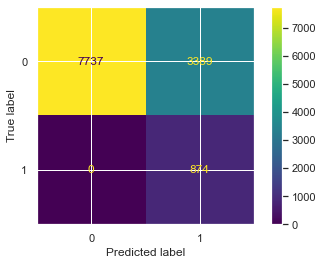

In [324]:
# Generate the model performance 
final_eval=model_performance_report(pip_model_grid_cmp, "LGBM classifier on balanced dataset",
                        features_test_2, labels_test)
# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LGBMClassifier(Features Binned#1500)", final_eval[0] , final_eval[1], "balanced" , "auc", "Yes"])

In [399]:
# Fine tuning of LGBMClassifier
grid_params_lgbm = {
    'classifier__learning_rate': sp_randFloat(), #[0.05],
    'classifier__num_leaves': sp_randInt(20, 80),
    'classifier__boosting_type' : ['gbdt', 'dart'],
    'classifier__objective' : ['binary'],
    'classifier__random_state' : [random_seed], 
    'classifier__colsample_bytree' :sp_randFloat(), # [0.5,0.7],
    'classifier__subsample' : sp_randFloat(), #[0.5,0.7],
    'classifier__min_split_gain' : [0.01],
    'classifier__class_weight' : ['balanced'],
    'classifier__metric': ['auc', 'l1', 'l2', 'binary_logloss'],
    'classifier__is_unbalance' : [True],
    'classifier__metric': ['auc']
    }

# Perform hyper parameter tunning 
model_lgbm_param_cv_3, scorecv_3, mdl_grid_cmp_cv_3 = return_optimized_hyper_parameter(LGBMClassifier(), 
                                                                                       preprocessor_2, 
                                                                                       grid_params_lgbm, 
                                                                                       features_train_2,
                                                                                       labels_train, 
                                                                                       cv=5,
                                                                                       n_iter=8)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [400]:
#model_gbc_grid_param
obj_mdl_lgbm_opt_3_n = LGBMClassifier(learning_rate=model_lgbm_param_cv_3['classifier__learning_rate'],
                                  num_leaves=model_lgbm_param_cv_3['classifier__num_leaves'],
                                  boosting_type=model_lgbm_param_cv_3['classifier__boosting_type'],
                                  objective=model_lgbm_param_cv_3['classifier__objective'],
                                  #max_depth=model_lgbm_param_cv_3['classifier__max_depth'],
                                  random_state=model_lgbm_param_cv_3['classifier__random_state'],
                                  colsample_bytree=model_lgbm_param_cv_3['classifier__colsample_bytree'],
                                  subsample=model_lgbm_param_cv_3['classifier__subsample'],
                                  min_split_gain=model_lgbm_param_cv_3['classifier__min_split_gain'],
                                  class_weight=model_lgbm_param_cv_3['classifier__class_weight'],
                                  metric=model_lgbm_param_cv_3['classifier__metric'],
                                  is_unbalance=model_lgbm_param_cv_3['classifier__is_unbalance']
                                 )
# Build pipeline 
pip_model_grid_cmp_3= Pipeline(steps=[('preprocessor', preprocessor_2),
                                 ('classifier', obj_mdl_lgbm_opt_3_n)
                     ])

# Train the model
pip_model_grid_cmp_3.fit(features_test_2, labels_test)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'new_day', 'new_month']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'balance', 'duration',
                                                   'campaign'])])),
                ('classifier',
                 LG

-------------------------------------------------------------

Performance metrics for  LGBM classifier on balanced dataset :

-------------------------------------------------------------

Model Accuracy :
model score: 0.933
-------------------------------------------------------------

ROC AUC score: 0.964
-------------------------------------------------------------

Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.93      0.96     11126
           1       0.52      1.00      0.68       874

    accuracy                           0.93     12000
   macro avg       0.76      0.96      0.82     12000
weighted avg       0.96      0.93      0.94     12000

-------------------------------------------------------------

Confusion Matrix  :


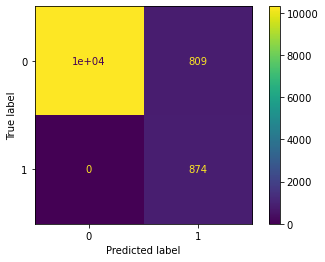

In [401]:
# Generate the model performance 
final_eval=model_performance_report(pip_model_grid_cmp_3, "LGBM classifier on balanced dataset",
                        features_test_2, labels_test)
# Add entry in report model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
eval_report.append([ "LGBMClassifier(Features Binned#8)", final_eval[0] , final_eval[1], "balanced" , "auc", "Yes"])

In [402]:
# Set the file name
file_name = 'finalized_2_pip_model_grid_cmp_3.pickle'
# Save the model 
joblib.dump(pip_model_grid_cmp_3, open(file_name, 'wb'))

**Step 16. Analyze the report for identifying the best model**

In [338]:
pd_report = pd.DataFrame(eval_report)
# model name  accuracy score, roc_auc, class weight of classifier, Classifier , param optimization
pd_report.columns = ['Model Name', 'Accuracy Score', 'roc_auc score', 'Class Weight',\
                     'Classifier optimization param', 'Param Optimization ']
pd_report.sort_values(by='roc_auc score', ascending=False)

,Model Name,Accuracy Score,roc_auc score,Class Weight,Classifier optimization param,Param Optimization
11,LGBMClassifier(Features Binned#8),0.869000,0.929000,balanced,auc,Yes
1,LGBMClassifier,0.887417,0.884991,balanced,auc,No
4,SVC Linear Kernel,0.856000,0.870000,balanced,none,Yes
0,LogisticRegressionCV,0.937146,0.867344,balanced,roc_auc,No
5,LogisticRegressionCV,0.937000,0.867000,balanced,roc_auc,Yes
3,LGBMClassifier(iter#1500),0.763000,0.865000,balanced,auc,Yes
2,LGBMClassifier(iter#2000),0.745000,0.855000,balanced,auc,Yes
10,LGBMClassifier(Features Binned#1500),0.717583,0.847699,balanced,auc,Yes
6,StackingClassifier,0.678000,0.813000,--,--,No
9,LGBMClassifier(Features removed),0.499000,0.726000,balanced,auc,Yes


Based on the report LGBMClassifier(Features Binned#8) seems like the best model for our dataset.

## Feature Analysis

**Step 17. Let's feature importance analysis for best performing models .**<br>

In [327]:
# Generate list of categorical feature names
column_categorical_num = list(pip_model_grid_cmp_3.named_steps['preprocessor'].transformers_[0][1]\
                           .named_steps['onehot'].get_feature_names(categorical_features))

# Add the numerical feature names
column_categorical_num.extend(numeric_features)

In [328]:
# Generate the column index
column_index = [ "column_" + str(value) for value in  range(0,len(column_categorical)+1)]

# Generate the column index and name mapping
column_mapping = dict(zip(column_index, column_categorical_num))

#fetch the feature importance
Feature_imp = pip_model_grid_cmp_3['classifier'].feature_importances_

In [329]:
df_feature_imp = pd.DataFrame({ 'Feature_Names': column_categorical_num,
                                'Feature_Importance': Feature_imp })


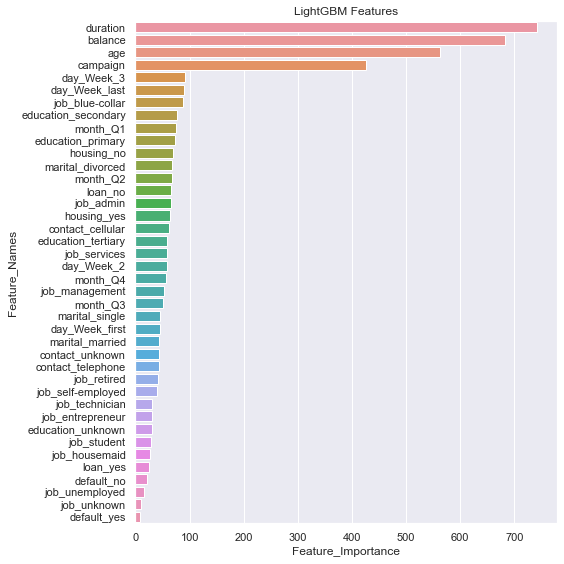

In [331]:
# Set the figure size
plt.figure(figsize=(8,8))
# Set the font value
sns.set(font_scale = 1)
# Generate the barplot
ax = sns.barplot(x="Feature_Importance", y="Feature_Names",\
                 data=df_feature_imp.sort_values(by="Feature_Importance", ascending=False))
plt.title('LightGBM Features')
plt.tight_layout()
plt.savefig('lgbm_importances-01.png')
plt.show()

Looking at the feature importance plot we can say that<br>
    i. duration followed by balance, followed by age and the campaign are the most important predictors.<br>
    ii. People who were contacted in the second half of the month were more inclined to subscribe.<br>
    iv. People with secondary education are most likely to subscribe as compared to other education levels.<br>
    v. people in blue color jobs are most likely to subscribe as compared to people in other professions.<br>
    
    
<br>

## Customer segmentation via clustering
<br>

**Step 18. Data prepration for clustering**<br>

In [250]:
# copy the train data 
features_train_filtered = features_train_2.copy()
# Reset the data frame index
features_train_filtered.reset_index(inplace= True)

In [251]:
# Perform scaling of numerical features
Num_feat_scaled = StandardScaler().fit_transform(features_train_filtered[numeric_features])

# Store the unscaled features
unscaled_feat = features_train_filtered[numeric_features]

# Replace numeric features with scaled features
features_train_filtered[numeric_features] = Num_feat_scaled

# Add the record lables
features_train_filtered['Y'] = labels_train

# Reset the index
features_train_filtered.drop(axis=1, columns= ['index'] , inplace = True)

# Get Indexes of positive labels
indexes_pos_lbl = list(features_train_filtered['Y'] == 1)

# Filter Out records for positive label
features_train_filtered_1 = features_train_filtered.loc[ indexes_pos_lbl ,:].copy()

# reset the index 
features_train_filtered_1.reset_index(drop=True, inplace=True)

Let's Drop 'new_day', 'new_month', 'campaign' as they give no information about customers

In [252]:
features_train_filtered_1.drop( axis=1, inplace= True, columns = ['new_day', 'new_month', 'campaign'])
features_train_filtered_1

,age,job,marital,education,default,balance,housing,loan,contact,duration,Y
0,-1.506047,blue-collar,married,secondary,no,-0.441360,yes,yes,cellular,3.437379,1
1,-0.260504,technician,divorced,secondary,no,-0.129755,yes,no,cellular,1.516718,1
2,0.466063,technician,single,tertiary,no,-0.437606,no,no,cellular,1.989201,1
3,1.088834,technician,married,secondary,no,-0.363886,no,no,cellular,1.382272,1
4,-0.364299,technician,divorced,secondary,no,-0.389483,yes,no,cellular,2.277300,1
...,...,...,...,...,...,...,...,...,...,...,...
2017,0.881244,technician,married,secondary,no,-0.296991,no,no,cellular,3.986689,1
2018,0.050882,services,single,secondary,no,-0.667982,yes,yes,cellular,-0.415467,1
2019,0.362268,admin,married,secondary,no,-0.071052,yes,no,cellular,2.519303,1
2020,1.400220,retired,single,secondary,no,-0.393578,no,yes,cellular,2.350285,1


**Step 19. Clustering using KPrototypes clustering algorithm**

    i. Identify the ideal number of clusters

In [253]:
# fetch the categorical indexes
categorical_features_idx = [1, 2, 3, 4, 6, 7, 8]

In [82]:
# Cost List 
cost_ =[]

# Loop to identify the best number of cluster 
for cluster in range(1, 10):
    try:
        kprototype = KPrototypes(n_jobs = -1, n_clusters = cluster,
                                 init = 'Huang', random_state = random_seed)
        kprototype.fit_predict(features_train_filtered_1.iloc[: , :-1], categorical = categorical_features_idx)
        cost_.append(kprototype.cost_)
        print('Cluster initiation: {}'.format(cluster))
    except:
        break
        

Cluster initiation: 1
Cluster initiation: 2
Cluster initiation: 3
Cluster initiation: 4
Cluster initiation: 5
Cluster initiation: 6
Cluster initiation: 7
Cluster initiation: 8
Cluster initiation: 9


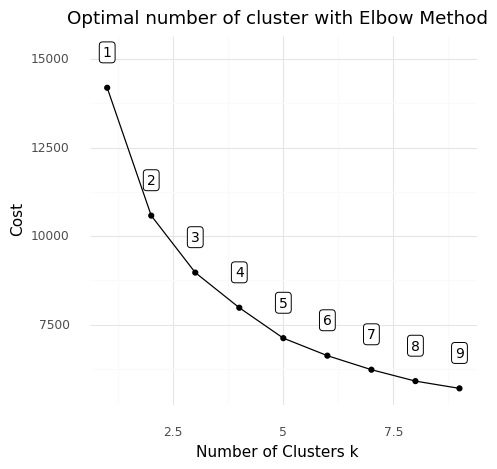

<ggplot: (8785314697948)>

In [255]:
# Converting the results into a dataframe and plotting them
df_cost = pd.DataFrame({'Cluster':range(1, 10), 'Cost':cost_})
# Data viz
plotnine.options.figure_size = (5, 4.8)
(
    ggplot(data = df_cost)+
    geom_line(aes(x = 'Cluster',
                  y = 'Cost'))+
    geom_point(aes(x = 'Cluster',
                   y = 'Cost'))+
    geom_label(aes(x = 'Cluster',
                   y = 'Cost',
                   label = 'Cluster'),
               size = 10,
               nudge_y = 1000) +
    labs(title = 'Optimal number of cluster with Elbow Method')+
    xlab('Number of Clusters k')+
    ylab('Cost')+
    theme_minimal()
)


    ii. Perform clustering and generate label

In [263]:
kprototype = KPrototypes(n_jobs = -1, n_clusters = 3,
                        init = 'Huang', random_state = random_seed)
kprototype.fit_predict(features_train_filtered_1.iloc[: , :-1], categorical = categorical_features_idx)

# Fetch the predicted labels
labels = kprototype.labels_ 

# Labeled training dataset
features_train_filtered_1['Cluster_Id'] = labels

    iii. Perform feature tranformation for dimension reduction implementation

In [264]:
# Separate the numerical features
numerical_features = features_train_filtered_1.loc[ : , ['age', 'balance', 'duration']].copy() #, 'campaign']].copy()

# Separate the categorical features
categorical_features = features_train_filtered_1.loc[ : , ['job', 'marital', 'education',\
                                                           'default', 'housing', 'loan', 'contact']].copy()

In [265]:
# Define the column transformer
cat_tranformer = ColumnTransformer(transformers=[('cat', OneHotEncoder(sparse=False),
                                                  list(categorical_features.columns))
                                                ])

# Transform the features 
categorical_features_ = cat_tranformer.fit_transform(categorical_features)

# Convert the Tranformed data into data frame
categorical_features_1 = pd.DataFrame(categorical_features_)

# Get the Feature names
column_names = cat_tranformer.get_feature_names()

# Format the column names
column_names = [  str.replace(col_name, "cat__", "")     for col_name in column_names ]

# Rename the columns 
categorical_features_1.columns = column_names

# Reset the indexes
numerical_features.reset_index(drop=True, inplace=True)

# Reset the indexes
categorical_features_1.reset_index(drop=True, inplace=True)

# Concatenate the data frames
features_train_filtered_transformed = pd.concat( [numerical_features, categorical_features_1 ], axis=1)

In [266]:
# Create an instance of TNSE
obj_tnse =  TSNE(n_components=3, learning_rate='auto', init='random', random_state = random_seed)

# Train the data using TNSE
features_train_t_sne = obj_tnse.fit_transform(features_train_filtered_transformed)

In [267]:
features_train_t_sne = pd.DataFrame(features_train_t_sne)
#  Add the cluster Id
features_train_t_sne['Cluster_id']= list(features_train_filtered_1['Cluster_Id'])

    iv. Visualize the clusters

In [269]:
pio.renderers.default = 'iframe'
# Visualize the clusters using reduced dimensions
fig = px.scatter_3d(features_train_t_sne, x=0, y=1, z=2,color='Cluster_id')
fig.update_layout(title_text='Cluster distribution kprototype(dimension reduced TSNE)', title_x=0.5)
fig.show()

From the plot we can say the cluster are somewhat clear but not entirely separated. Let's try AgglomerativeClustering on the dimensionally reduced data and see if are able to perform better clustering. 

**Step 20. Clustering using Agglomerative clustering algorithm**: 

    i. Identify the ideal number of clusters using dendograms

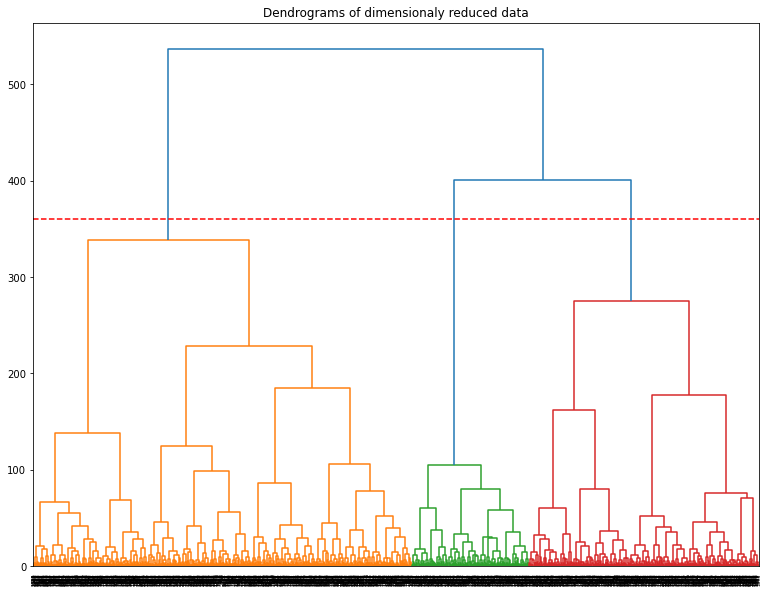

In [270]:
# Set the plot dimesions
plt.figure(figsize=(13, 10))  
plt.title("Dendrograms of dimensionaly reduced data")
# Generate the dendogram of dimensionally reduced data excluding the previous cluster labels
dend = shc.dendrogram(shc.linkage(features_train_t_sne.iloc[:, :-1], method='ward'))
# Add the horizontal line to identify the ideal number of clusters
plt.axhline(y=360, color='r', linestyle='--')

Denodgram suggests that the ideal number of clusters for this data is 3. <br>

    ii. Perform clustering for ideal number of clusters 

In [271]:
# Generate cluster labels via AgglomerativeClustering algorithm
cluster = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')  
labels = cluster.fit_predict(features_train_t_sne.iloc[:, :-1])

# Add the cluster id into features_train_t_sne data frame
features_train_t_sne['agl_cluster_id'] =labels

    iii. Plot the clusters

In [272]:
# Plot the clusters using new labels
fig = px.scatter_3d(features_train_t_sne, x=0, y=1, z=2,color='agl_cluster_id')
fig.update_layout(title_text='Clusters with tsne dimension reduction -AgglomerativeClustering ', title_x=0.5)
fig.show()

The cluster formation is much clearer now, let's map back the cluster id and analyze the data.

**Step 21. Perform customer segmentation using clusters created**

In [274]:
# Copy the Agg clustering labels generated
features_train_filtered_1['Cluster_Id'] = features_train_t_sne['agl_cluster_id'] 
# Check the cluster counts
features_train_filtered_1.groupby('Cluster_Id')['duration'].count()

Cluster_Id
0    1055
1     641
2     326
Name: duration, dtype: int64

Cluster 0 looks like the majority cluster of customers subscribing to the product, let's analyze cluster **0** to understand the characteristics. <br>

       i. Analyze Cluster 0

In [316]:
# Create a copy of features_train_filtered_1
features_train_clustered = features_train_filtered_1.copy()

# Revert to original  unscaled features
features_train_clustered.loc[: , ['age', 'balance', 'duration']] = unscaled_feat.loc[: , ['age', 'balance', 'duration']] 

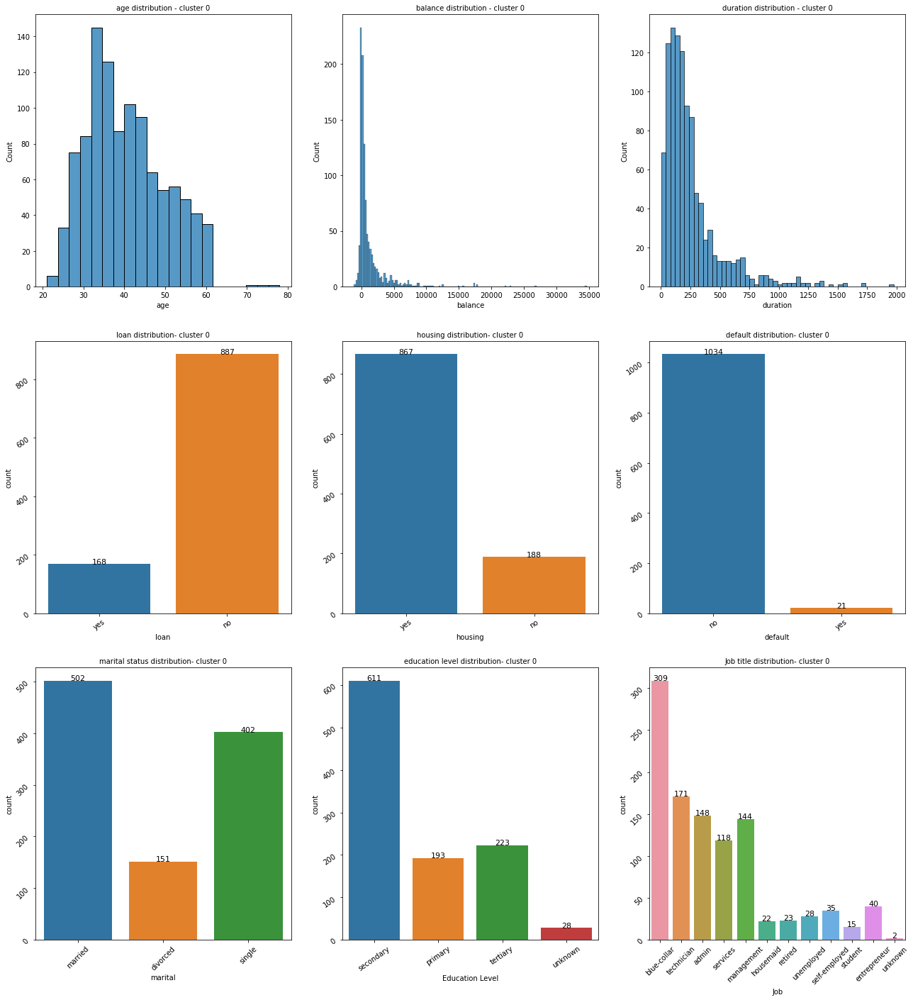

In [386]:
# Filter out the records and visualize cluster 0
visualize_cluster_features( features_train_clustered.loc[ features_train_filtered_1['Cluster_Id'] == 0 , : ] , 0)

For cluster 0(majority cluster) , we can say customers whose   <br>
    i. marrital status is married (followed by single) <br>
    ii. have secondary education level   <br>
    iii. are in Blue-Collar jobs   <br>
    iv. have no personal loan and never defaulted  <br>
    v. have housing loan   <br>
    vi. were contacted for less than 300 seconds  <br>
    vii. have balance less than 3000 and are between age group 32 -55  <br>
 are the most likely going to subscribe to the product.  <br>
 
    ii. Analyze Cluster 1

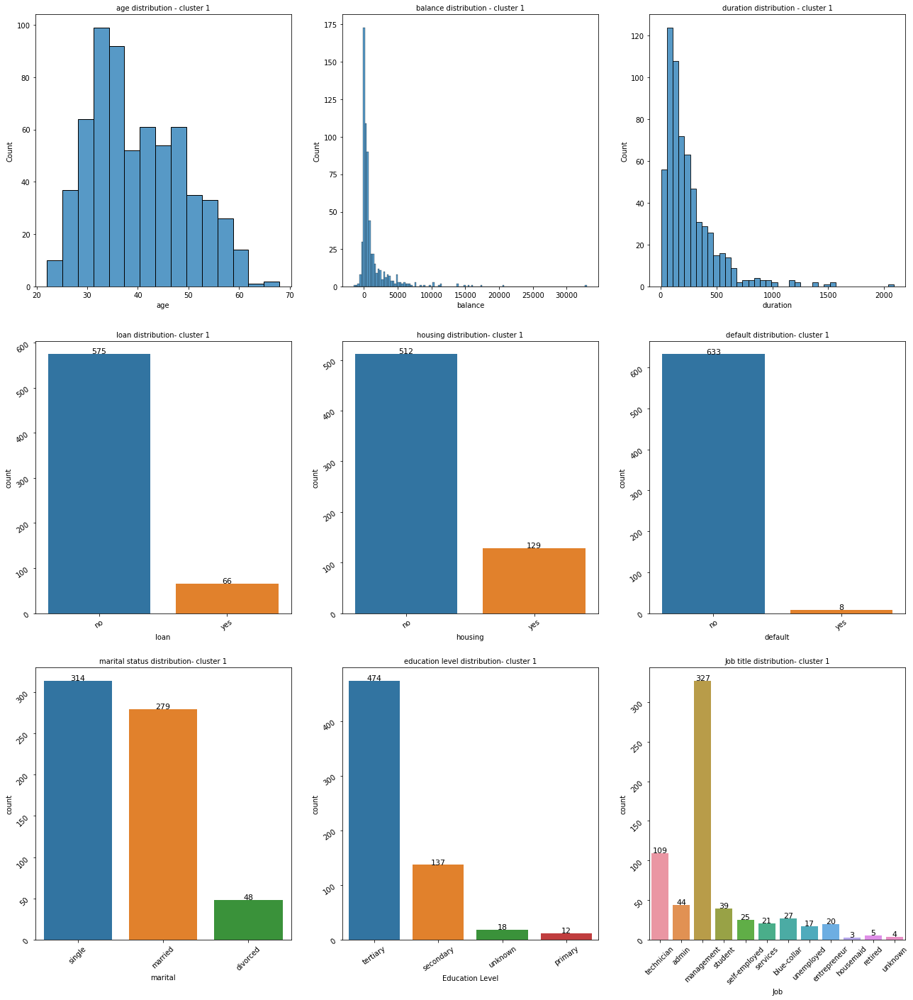

In [385]:
# Filter out the records and visualize cluster 1
visualize_cluster_features( features_train_clustered.loc[ features_train_filtered_1['Cluster_Id'] == 1 , : ] , 1)

For cluster 1(second largest cluster) , we can say customers whose <br>
i. marrital status is single(followed by married)<br>
ii. have tertiary education level<br>
iii. are in management jobs<br>
iv. have no personal loan, no housing loan and never defaulted<br>
v. were contacted for less than 300 seconds<br>
vi. have balance less than 3000 and are between age group 32-55 years<br>

are the most likely going to subscribe to the product.<br>

   iii. Analyze Cluster 2

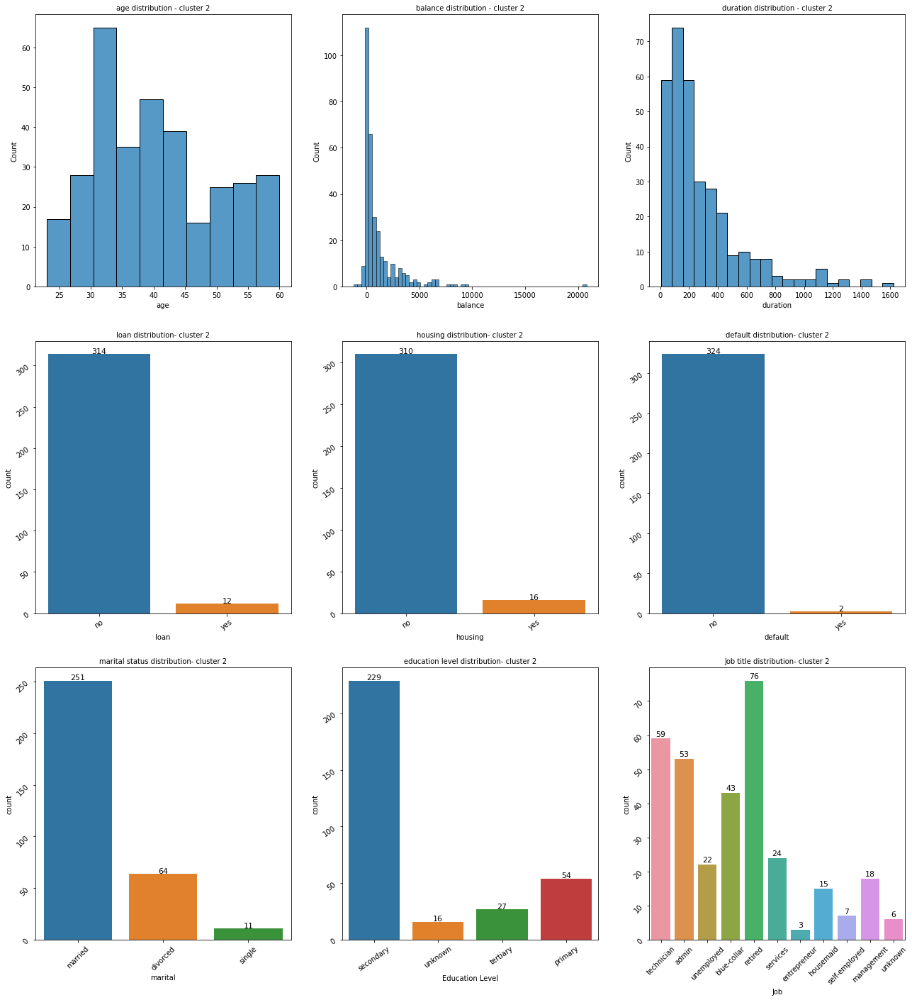

In [384]:
# Filter out the records and visualize the cluster 2
visualize_cluster_features( features_train_clustered.loc[ features_train_filtered_1['Cluster_Id'] == 2 , : ] , 2)

For cluster 2(smallest cluster) , we can say customers whose <br>
i. marrital status is married<br>
ii. have secondary education level<br>
iii. are retired(followed by technician job)<br>
iv. have no personal loan, no housing loan and never defaulted<br>
v. were contacted for less than 400 seconds<br>
vi. have balance less than 2000 and are between age group 33-60 years<br>
are the most likely going to subscribe to the product.<br>